<a href="https://colab.research.google.com/github/Giriankur/Project-03/blob/main/Final_05_06_2024Untitled0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Feature Engineering
# import the libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler


In [ ]:
data = "/content/housing_data.csv"

In [ ]:
housing_data = pd.read_csv(data)

In [ ]:
housing_data

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
housing_data.shape

(1460, 81)

In [ ]:
housing_data.shape[0]

1460

In [ ]:
housing_data.shape[1]

81

In [ ]:
housing_data.head()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000


In [ ]:
housing_data.head().T

,0,1,2,3,4
Unnamed: 0,0,1,2,3,4
MSSubClass,SC60,SC20,SC60,SC70,SC60
MSZoning,RL,RL,RL,RL,RL
LotFrontage,65,80,68,60,84
LotArea,8450,9600,11250,9550,14260
...,...,...,...,...,...
MoSold,Feb,May,Sep,Feb,Dec
YrSold,2008,2007,2008,2006,2008
SaleType,WD,WD,WD,WD,WD
SaleCondition,Normal,Normal,Normal,Abnorml,Normal


In [ ]:
housing_data.tail()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125
1459,1459,SC20,RL,75,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2008,WD,Normal,147500


In [ ]:
housing_data.tail().T

,1455,1456,1457,1458,1459
Unnamed: 0,1455,1456,1457,1458,1459
MSSubClass,SC60,SC20,SC70,SC20,SC20
MSZoning,RL,RL,RL,RL,RL
LotFrontage,62,85,66,68,75
LotArea,7917,13175,9042,9717,9937
...,...,...,...,...,...
MoSold,Aug,Feb,May,Apr,Jun
YrSold,2007,2010,2010,2010,2008
SaleType,WD,WD,WD,WD,WD
SaleCondition,Normal,Normal,Normal,Normal,Normal


In [ ]:
housing_data.describe() # summary of centeral tendecy of data and shape of data shape of data set distrubtion

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,729.500000,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,...,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,2007.815753,180921.195890
std,421.610009,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,...,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,1.328095,79442.502883
min,0.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000
25%,364.750000,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129975.000000
50%,729.500000,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,163000.000000
75%,1094.250000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,...,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000,214000.000000
max,1459.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,2010.000000,755000.000000


In [ ]:
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
housing_data.dtypes

Unnamed: 0        int64
MSSubClass       object
MSZoning         object
LotFrontage       int64
LotArea           int64
                  ...  
MoSold           object
YrSold            int64
SaleType         object
SaleCondition    object
SalePrice         int64
Length: 81, dtype: object

In [ ]:
housing_data.isna() #Each element is a missing value (NaN)

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1456,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1457,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1458,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
housing_data.isnull()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1456,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1457,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1458,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
housing_data.isnull().sum() # Check for null values in the dataset


Unnamed: 0       0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64

In [ ]:
housing_data.dropna() # Cleaned data where rows containing any missing values have been remove

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
56,56,SC160,FV,24,2645,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2009,WD,Abnorml,172500
87,87,SC160,FV,40,3951,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2009,New,Partial,164500
115,115,SC160,FV,34,3230,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2007,WD,Normal,176000
281,281,SC20,FV,60,7200,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2006,New,Partial,185000
297,297,SC60,FV,66,7399,Pave,Pave,IR1,Lvl,AllPub,...,0,No,No,No,0,Jun,2007,WD,Normal,239000
505,505,SC90,RM,60,7596,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,Jul,2009,COD,Normal,124500
579,579,SC50,RM,81,12150,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,Nov,2008,WD,Normal,131500
755,755,SC160,FV,34,3230,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Mar,2009,WD,Normal,172500
758,758,SC160,FV,24,2280,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2008,WD,Normal,179400
914,914,SC160,FV,30,3000,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2009,New,Partial,173733


In [ ]:
housing_data.drop(["Unnamed: 0","MasVnrType"],axis=1)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
# NaN ko 0 se replace karna
#df_filled = housing_data.fillna(0)

#print(df_filled)

In [ ]:
housing_data_filled = housing_data['Alley'].fillna(housing_data['Alley'].mode()[0], inplace = True)

In [ ]:
housing_data

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,Grvl,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,Grvl,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,Grvl,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
df_filled = housing_data.fillna(0)

print(df_filled)

      Unnamed: 0 MSSubClass MSZoning  LotFrontage  LotArea Street Alley  \
0              0       SC60       RL           65     8450   Pave  Grvl   
1              1       SC20       RL           80     9600   Pave  Grvl   
2              2       SC60       RL           68    11250   Pave  Grvl   
3              3       SC70       RL           60     9550   Pave  Grvl   
4              4       SC60       RL           84    14260   Pave  Grvl   
...          ...        ...      ...          ...      ...    ...   ...   
1455        1455       SC60       RL           62     7917   Pave  Grvl   
1456        1456       SC20       RL           85    13175   Pave  Grvl   
1457        1457       SC70       RL           66     9042   Pave  Grvl   
1458        1458       SC20       RL           68     9717   Pave  Grvl   
1459        1459       SC20       RL           75     9937   Pave  Grvl   

     LotShape LandContour Utilities  ... PoolArea PoolQC  Fence MiscFeature  \
0         Reg       

In [ ]:
housing_data.replace = housing_data.replace("0",np.NaN,inplace=True) # Replace all occurrences of a specific value with another value

In [ ]:
housing_data['Alley'].isnull().sum()

0

In [ ]:
duplicates = housing_data.duplicated()
duplicates.sum()

0

In [ ]:
housing_data = housing_data.drop_duplicates()
housing_data.count()

Unnamed: 0       1460
MSSubClass       1460
MSZoning         1460
LotFrontage      1460
LotArea          1460
                 ... 
MoSold           1460
YrSold           1460
SaleType         1460
SaleCondition    1460
SalePrice        1460
Length: 81, dtype: int64

In [ ]:
# Summary statistics
housing_data.describe()

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,729.500000,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,...,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,2007.815753,180921.195890
std,421.610009,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,...,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,1.328095,79442.502883
min,0.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000
25%,364.750000,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129975.000000
50%,729.500000,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,163000.000000
75%,1094.250000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,...,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000,214000.000000
max,1459.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,2010.000000,755000.000000


In [ ]:
# Summary statistics
housing_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,1460.0,729.500000,421.610009,0.0,364.75,729.5,1094.25,1459.0
LotFrontage,1460.0,57.623288,34.664304,0.0,42.00,63.0,79.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1460.0,103.117123,180.731373,0.0,0.00,0.0,164.25,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


In [ ]:
# How many nunique SalePrices
housing_data['SalePrice'].nunique()

663

In [ ]:
housing_data['SalePrice'].unique()

array([208500, 181500, 223500, 140000, 250000, 143000, 307000, 200000,
       129900, 118000, 129500, 345000, 144000, 279500, 157000, 132000,
       149000,  90000, 159000, 139000, 325300, 139400, 230000, 154000,
       256300, 134800, 306000, 207500,  68500,  40000, 149350, 179900,
       165500, 277500, 309000, 145000, 153000, 109000,  82000, 160000,
       170000, 130250, 141000, 319900, 239686, 249700, 113000, 127000,
       177000, 114500, 110000, 385000, 130000, 180500, 172500, 196500,
       438780, 124900, 158000, 101000, 202500, 219500, 317000, 180000,
       226000,  80000, 225000, 244000, 185000, 144900, 107400,  91000,
       135750, 136500, 193500, 153500, 245000, 126500, 168500, 260000,
       174000, 164500,  85000, 123600, 109900,  98600, 163500, 133900,
       204750, 214000,  94750,  83000, 128950, 205000, 178000, 118964,
       198900, 169500, 100000, 115000, 190000, 136900, 383970, 217000,
       259500, 176000, 155000, 320000, 163990, 136000, 153900, 181000,
      

In [ ]:
# How many nunique SalePrices
housing_data['BedroomAbvGr'].nunique()

8

In [ ]:
# How many unique SalePrices
housing_data['BedroomAbvGr'].unique()

array([3, 4, 1, 2, 0, 5, 6, 8])

In [ ]:
housing_data['SalePrice'].min()

34900

In [ ]:
housing_data['SalePrice'].max()

755000

In [ ]:
housing_data['BedroomAbvGr'].min()

0

In [ ]:
housing_data['BedroomAbvGr'].max()

8

In [ ]:
# Check for the variables
housing_data.columns


Index(['Unnamed: 0', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'Pa

In [ ]:
# identfy file the numeric and the categorical_columns as
numerical_columns= housing_data.select_dtypes(include=["number"]).columns.to_list()
categorical_columns= housing_data.select_dtypes(include=["object"]).columns.to_list()

In [ ]:
numerical_columns

['Unnamed: 0',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'YrSold',
 'SalePrice']

In [ ]:
categorical_columns

['MSSubClass',
 'MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'MoSold',
 'SaleType',
 'SaleCondition']

In [ ]:
## for categorical data encoding

from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
for categorical_col in categorical_columns:
    housing_data[categorical_col] = encoder.fit_transform(housing_data[categorical_col])

In [ ]:
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   int64  
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   int64  
 6   Alley          1460 non-null   int64  
 7   LotShape       1460 non-null   int64  
 8   LandContour    1460 non-null   int64  
 9   Utilities      1460 non-null   int64  
 10  LotConfig      1460 non-null   int64  
 11  LandSlope      1460 non-null   int64  
 12  Neighborhood   1460 non-null   int64  
 13  Condition1     1460 non-null   int64  
 14  Condition2     1460 non-null   int64  
 15  BldgType       1460 non-null   int64  
 16  HouseStyle     1460 non-null   int64  
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
housing_data_filled = housing_data['GarageYrBlt'].fillna(housing_data['GarageYrBlt'].mode()[0], inplace = True)

In [ ]:
housing_data_filled = housing_data['Electrical'].fillna(housing_data['Electrical'].mode()[0], inplace = True)

In [ ]:
housing_data["GarageYrBlt"] = housing_data["GarageYrBlt"].astype("int64")# Data type Conversion

In [ ]:
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Unnamed: 0     1460 non-null   int64
 1   MSSubClass     1460 non-null   int64
 2   MSZoning       1460 non-null   int64
 3   LotFrontage    1460 non-null   int64
 4   LotArea        1460 non-null   int64
 5   Street         1460 non-null   int64
 6   Alley          1460 non-null   int64
 7   LotShape       1460 non-null   int64
 8   LandContour    1460 non-null   int64
 9   Utilities      1460 non-null   int64
 10  LotConfig      1460 non-null   int64
 11  LandSlope      1460 non-null   int64
 12  Neighborhood   1460 non-null   int64
 13  Condition1     1460 non-null   int64
 14  Condition2     1460 non-null   int64
 15  BldgType       1460 non-null   int64
 16  HouseStyle     1460 non-null   int64
 17  OverallQual    1460 non-null   int64
 18  OverallCond    1460 non-null   int64
 19  YearBu

In [ ]:
#housing_data.drop(["Unnamed: 0","MasVnrType"],axis=1,inplace= True )

In [ ]:
housing_data

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,9,3,65,8450,1,0,3,3,0,...,0,3,4,1,0,3,2008,8,4,208500
1,1,4,3,80,9600,1,0,3,3,0,...,0,3,4,1,0,8,2007,8,4,181500
2,2,9,3,68,11250,1,0,0,3,0,...,0,3,4,1,0,11,2008,8,4,223500
3,3,10,3,60,9550,1,0,0,3,0,...,0,3,4,1,0,3,2006,8,0,140000
4,4,9,3,84,14260,1,0,0,3,0,...,0,3,4,1,0,2,2008,8,4,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,9,3,62,7917,1,0,3,3,0,...,0,3,4,1,0,1,2007,8,4,175000
1456,1456,4,3,85,13175,1,0,3,3,0,...,0,3,2,1,0,3,2010,8,4,210000
1457,1457,10,3,66,9042,1,0,3,3,0,...,0,3,0,3,2500,8,2010,8,4,266500
1458,1458,4,3,68,9717,1,0,3,3,0,...,0,3,4,1,0,0,2010,8,4,142125


In [ ]:
# How many unique PoolQC
housing_data['PoolQC'].nunique()

4

In [ ]:
housing_data['PoolQC'].unique()

array([3, 0, 1, 2])

In [ ]:
housing_data['PoolQC'].min()

0

In [ ]:
housing_data['PoolQC'].max()

3

In [ ]:
numeric_columns =housing_data .select_dtypes(include=["number"]) # skewed data of every column
numeric_columns.skew()


Unnamed: 0        0.000000
MSSubClass        0.259490
MSZoning         -1.735395
LotFrontage       0.267822
LotArea          12.207688
                   ...    
MoSold           -0.253510
YrSold            0.096269
SaleType         -3.868638
SaleCondition    -2.741167
SalePrice         1.882876
Length: 81, dtype: float64

In [ ]:
housing_data.mean()

Unnamed: 0          729.500000
MSSubClass            6.214384
MSZoning              3.028767
LotFrontage          57.623288
LotArea           10516.828082
                     ...      
MoSold                5.468493
YrSold             2007.815753
SaleType              7.513014
SaleCondition         3.770548
SalePrice        180921.195890
Length: 81, dtype: float64

In [ ]:
housing_data.mode()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,4.0,3.0,0.0,7200.0,1.0,0.0,3.0,3.0,0.0,...,0.0,3.0,4.0,1.0,0.0,6.0,2009.0,8.0,4.0,140000.0
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1456,1456,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1457,1457,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1458,1458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
housing_data.median()

Unnamed: 0          729.5
MSSubClass            5.0
MSZoning              3.0
LotFrontage          63.0
LotArea            9478.5
                   ...   
MoSold                6.0
YrSold             2008.0
SaleType              8.0
SaleCondition         4.0
SalePrice        163000.0
Length: 81, dtype: float64

# Univariate Analysis

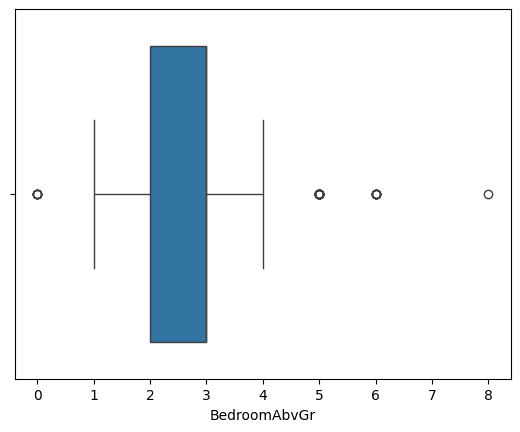

In [ ]:
# Boxplot of the outliers.
sns.boxplot(x = housing_data['BedroomAbvGr'])

plt.show()

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(housing_data['BedroomAbvGr'])
housing_data = housing_data[(housing_data.BedroomAbvGr > lower_range) & (housing_data.BedroomAbvGr <upper_range)]

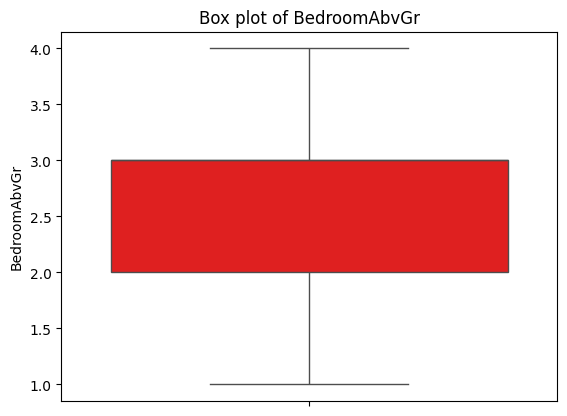

In [ ]:
# Check that the outliers are removed.
sns.boxplot(data = housing_data, y ='BedroomAbvGr',color = 'red')
plt.title('Box plot of BedroomAbvGr')
plt.show()

In [ ]:
housing_data.describe()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,...,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000,1425.000000
mean,728.576140,6.138246,3.025965,57.670877,10463.143860,0.995789,0.027368,1.936842,2.785965,0.000702,...,2.462456,2.992281,3.504561,1.065965,41.925614,5.450526,2007.819649,7.508772,3.783158,180920.936140
std,421.520385,3.491942,0.634915,34.696585,9987.857251,0.064775,0.163212,1.410812,0.693934,0.026491,...,38.294507,0.132275,1.081711,0.361216,498.374755,3.125058,1.325699,1.557002,1.090690,79646.101633
min,0.000000,0.000000,0.000000,0.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,0.000000,0.000000,34900.000000
25%,366.000000,4.000000,3.000000,42.000000,7540.000000,1.000000,0.000000,0.000000,3.000000,0.000000,...,0.000000,3.000000,4.000000,1.000000,0.000000,3.000000,2007.000000,8.000000,4.000000,129900.000000
50%,727.000000,4.000000,3.000000,63.000000,9450.000000,1.000000,0.000000,3.000000,3.000000,0.000000,...,0.000000,3.000000,4.000000,1.000000,0.000000,6.000000,2008.000000,8.000000,4.000000,163500.000000
75%,1094.000000,9.000000,3.000000,79.000000,11512.000000,1.000000,0.000000,3.000000,3.000000,0.000000,...,0.000000,3.000000,4.000000,1.000000,0.000000,8.000000,2009.000000,8.000000,4.000000,214000.000000
max,1459.000000,14.000000,4.000000,313.000000,215245.000000,1.000000,1.000000,3.000000,3.000000,1.000000,...,738.000000,3.000000,4.000000,3.000000,15500.000000,11.000000,2010.000000,8.000000,5.000000,755000.000000


In [ ]:
housing_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,1425.0,728.576140,421.520385,0.0,366.0,727.0,1094.0,1459.0
MSSubClass,1425.0,6.138246,3.491942,0.0,4.0,4.0,9.0,14.0
MSZoning,1425.0,3.025965,0.634915,0.0,3.0,3.0,3.0,4.0
LotFrontage,1425.0,57.670877,34.696585,0.0,42.0,63.0,79.0,313.0
LotArea,1425.0,10463.143860,9987.857251,1300.0,7540.0,9450.0,11512.0,215245.0
...,...,...,...,...,...,...,...,...
MoSold,1425.0,5.450526,3.125058,0.0,3.0,6.0,8.0,11.0
YrSold,1425.0,2007.819649,1.325699,2006.0,2007.0,2008.0,2009.0,2010.0
SaleType,1425.0,7.508772,1.557002,0.0,8.0,8.0,8.0,8.0
SaleCondition,1425.0,3.783158,1.090690,0.0,4.0,4.0,4.0,5.0


(1425, 81)


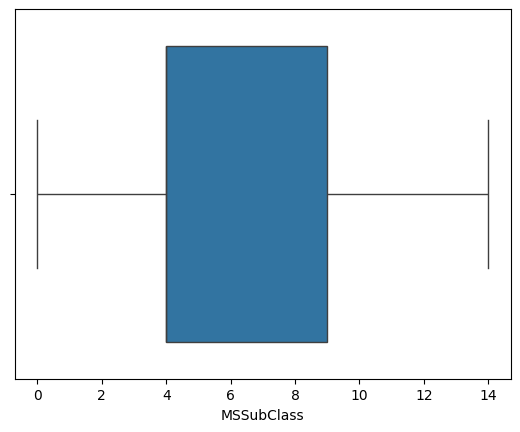

In [ ]:
# Check that the outliers.
sns.boxplot(x = housing_data['MSSubClass'])
print(housing_data.shape)

(1425, 81)


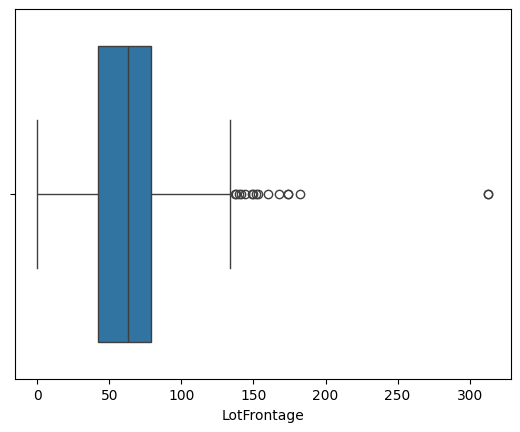

In [ ]:
# Check that the outliers.
sns.boxplot(x = housing_data['LotFrontage'])
print(housing_data.shape)

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(housing_data['LotFrontage'])
housing_data = housing_data[(housing_data.LotFrontage > lower_range) & (housing_data.LotFrontage <upper_range)]

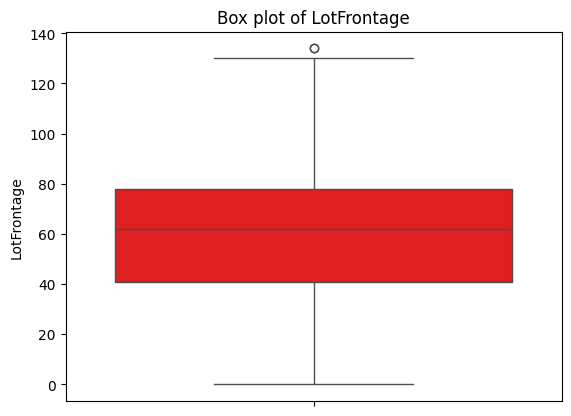

In [ ]:
# Check that the outliers are removed.
sns.boxplot(data = housing_data, y ='LotFrontage',color = 'red')
plt.title('Box plot of LotFrontage')
plt.show()

(1409, 81)


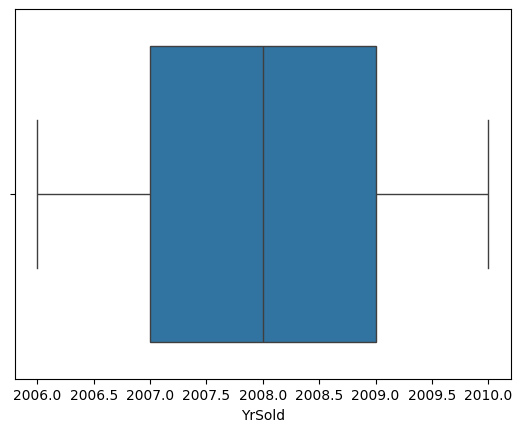

In [ ]:
# Check that the outliers are removed.
sns.boxplot(x = housing_data['YrSold'])
print(housing_data.shape)

(1409, 81)


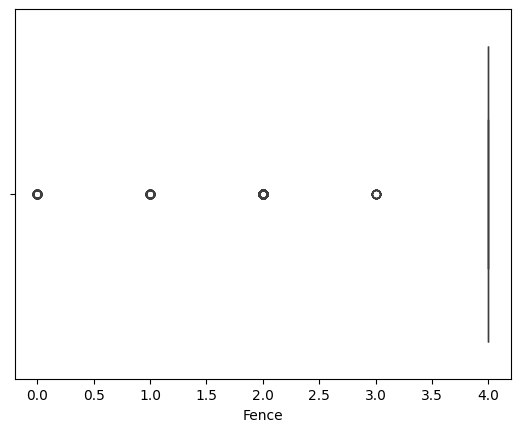

In [ ]:
# Check that the outliers .
sns.boxplot(x = housing_data['Fence'])
print(housing_data.shape)

(1409, 81)


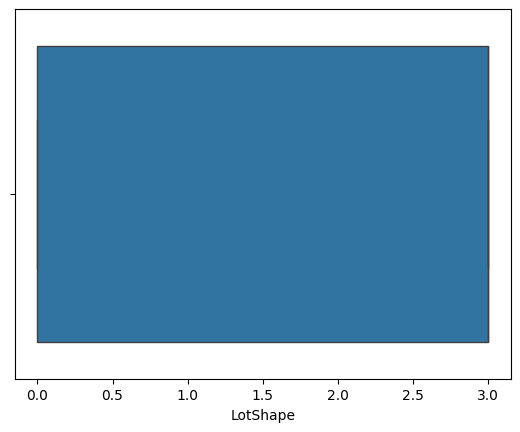

In [ ]:
# Check that the outliers are removed.
sns.boxplot(x = housing_data['LotShape'])
print(housing_data.shape)

(1409, 81)


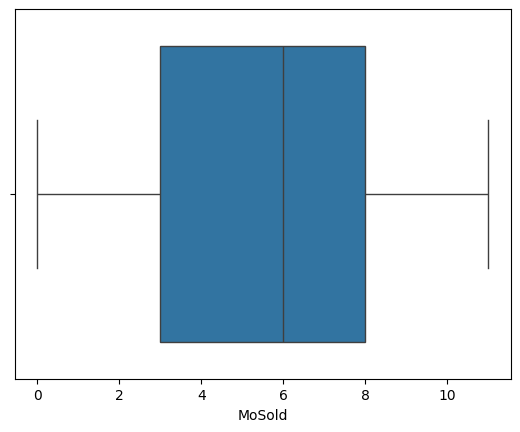

In [ ]:
# Check that the outliers.
sns.boxplot(x = housing_data['MoSold'])
print(housing_data.shape)

(1409, 81)


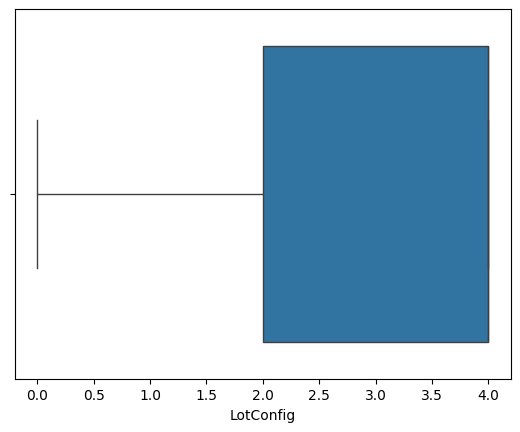

In [ ]:
# Check that the outliers are removed.
sns.boxplot(x = housing_data['LotConfig'])
print(housing_data.shape)

(1409, 81)


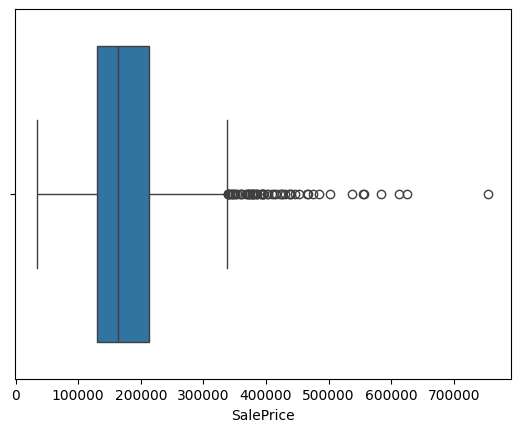

In [ ]:
# Check that the outliers .
sns.boxplot(x = housing_data['SalePrice'])
print(housing_data.shape)

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(housing_data['SalePrice'])
housing_data = housing_data[(housing_data.SalePrice > lower_range) & (housing_data.SalePrice <upper_range)]

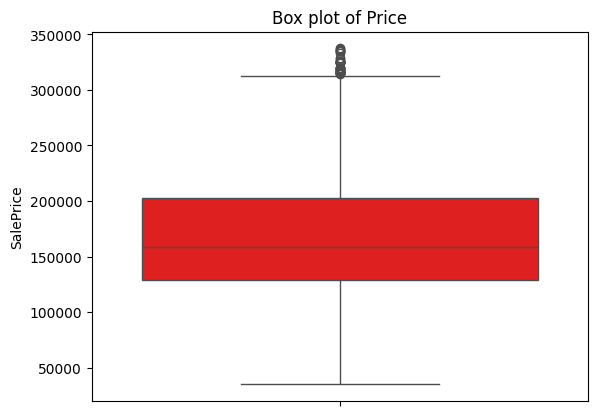

In [ ]:
# Check that the outliers are removed.
sns.boxplot(data = housing_data, y ='SalePrice',color = 'red')
plt.title('Box plot of Price')
plt.show()

(1349, 81)


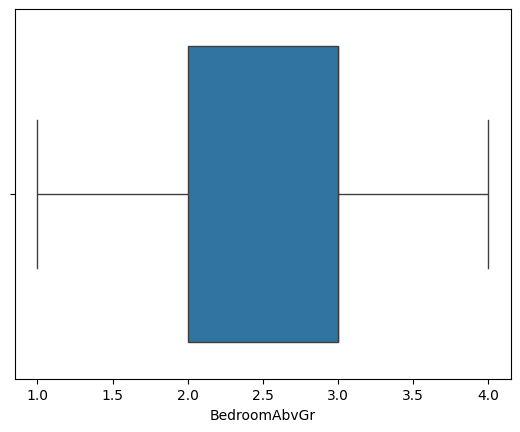

In [ ]:
# Check that the outliers .
sns.boxplot(x = housing_data['BedroomAbvGr'])
print(housing_data.shape)

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(housing_data['BedroomAbvGr'])
housing_data = housing_data[(housing_data.BedroomAbvGr > lower_range) & (housing_data.BedroomAbvGr <upper_range)]

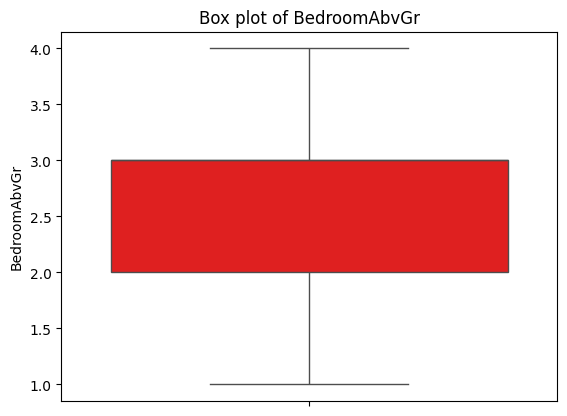

In [ ]:
# Check that the outliers are removed.
sns.boxplot(data = housing_data, y ='BedroomAbvGr',color = 'red')
plt.title('Box plot of BedroomAbvGr')
plt.show()

(1349, 81)


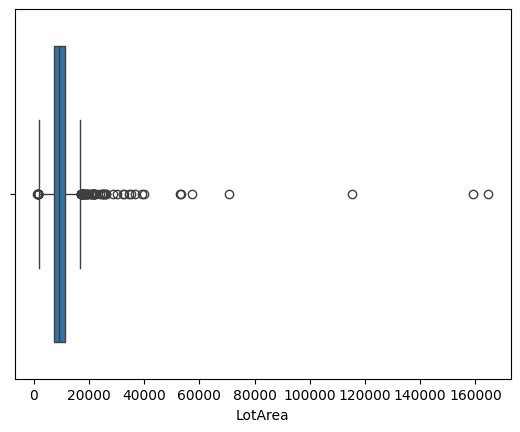

In [ ]:
# Check that the outliers .
sns.boxplot(x = housing_data['LotArea'])
print(housing_data.shape)

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(housing_data['LotArea'])
housing_data = housing_data[(housing_data.LotArea > lower_range) & (housing_data.LotArea <upper_range)]

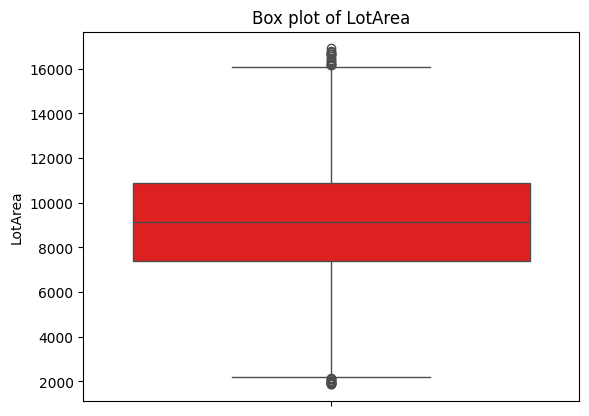

In [ ]:
# Check that the outliers are removed.
sns.boxplot(data = housing_data, y ='LotArea',color = 'red')
plt.title('Box plot of LotArea')
plt.show()

In [ ]:
# Feature Scaling
# Scale the features to have a mean of 0 and std of 1
scaler = StandardScaler()

In [ ]:
numerical_columns

['Unnamed: 0',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'YrSold',
 'SalePrice']

In [ ]:
housing_data[numerical_columns]= scaler.fit_transform(housing_data[numerical_columns])

In [ ]:
housing_data[numerical_columns]

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
0,-1.723005,0.287274,-0.223328,0.778212,-0.544167,1.069274,0.897119,0.682191,0.749413,-0.287321,...,0.458899,-0.738733,0.290762,-0.375373,-0.106103,-0.271256,-0.0396,-0.082586,0.134955,0.675498
1,-1.720636,0.775264,0.164842,0.000000,2.190271,0.171372,-0.405965,-0.563944,1.434440,-0.287321,...,0.013633,1.787010,-0.700220,-0.375373,-0.106103,-0.271256,-0.0396,-0.082586,-0.621863,0.210145
2,-1.718267,0.384872,0.721781,0.778212,-0.544167,1.002763,0.848857,0.466025,0.195348,-0.287321,...,0.762489,-0.738733,-0.017905,-0.375373,-0.106103,-0.271256,-0.0396,-0.082586,0.134955,0.934028
3,-1.715898,0.124611,0.147965,0.778212,-0.544167,-1.857220,-0.695539,-0.563944,-0.484643,-0.287321,...,0.934523,-0.738733,-0.131624,4.154958,-0.106103,-0.271256,-0.0396,-0.082586,-1.378680,-0.505120
4,-1.713529,0.905395,1.737773,1.556424,-0.544167,0.969507,0.752332,1.661297,0.620971,-0.287321,...,1.916130,0.888591,0.664411,-0.375373,-0.106103,-0.271256,-0.0396,-0.082586,0.134955,1.390763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.723975,0.189676,-0.403237,0.000000,-0.544167,0.936251,0.752332,-0.563944,-1.028635,-0.287321,...,0.013633,-0.738733,-0.050396,-0.375373,-0.106103,-0.271256,-0.0396,-0.082586,-0.621863,0.098116
1456,1.726344,0.937928,1.371544,0.000000,0.367312,0.237883,0.173183,0.192638,0.960966,0.771383,...,0.216027,2.219268,-0.700220,-0.375373,-0.106103,-0.271256,-0.0396,-0.082586,1.648590,0.701351
1457,1.728713,0.319807,-0.023505,0.778212,3.101750,-0.992574,1.041906,-0.563944,-0.336052,-0.287321,...,-1.038812,-0.738733,0.274516,-0.375373,-0.106103,-0.271256,-0.0396,5.207430,1.648590,1.675145
1458,1.731082,0.384872,0.204334,-0.778212,0.367312,-0.693274,0.559282,-0.563944,-0.905229,6.396149,...,-1.099530,2.363354,-0.700220,1.490057,-0.106103,-0.271256,-0.0396,-0.082586,1.648590,-0.468495


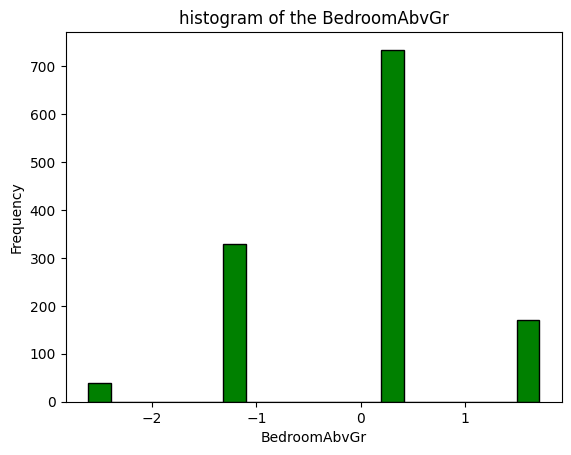

In [ ]:
# histogram
plt.hist(housing_data['BedroomAbvGr'], bins = 20, color = 'green', edgecolor = 'black')
plt.xlabel('BedroomAbvGr')
plt.ylabel('Frequency')
plt.title('histogram of the BedroomAbvGr')
plt.show()

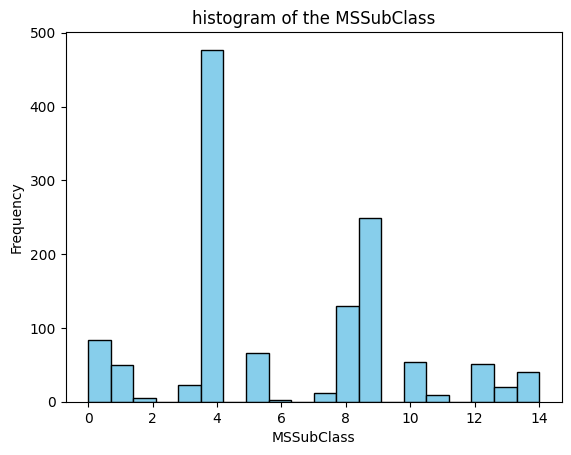

In [ ]:
# histogram
plt.hist(housing_data['MSSubClass'], bins = 20, color = 'skyblue', edgecolor = 'black')
plt.xlabel('MSSubClass')
plt.ylabel('Frequency')
plt.title('histogram of the MSSubClass')
plt.show()

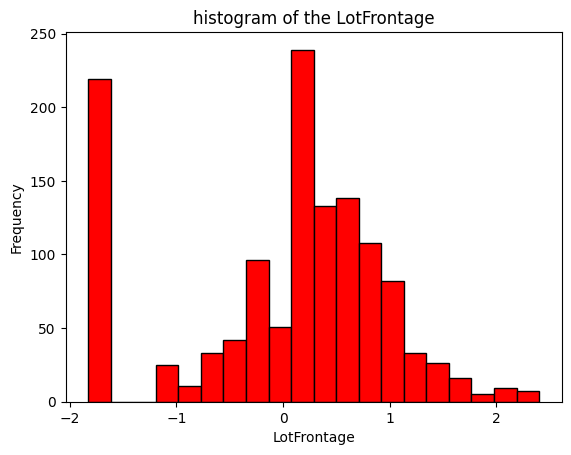

In [ ]:
# histogram
plt.hist(housing_data['LotFrontage'], bins = 20, color = 'red', edgecolor = 'black')
plt.xlabel('LotFrontage')
plt.ylabel('Frequency')
plt.title('histogram of the LotFrontage')
plt.show()

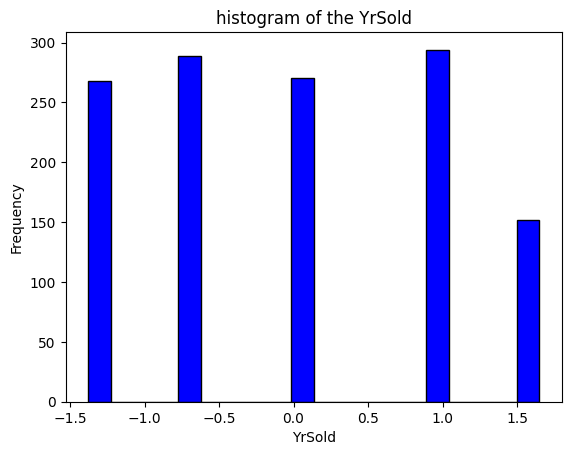

In [ ]:
# histogram
plt.hist(housing_data['YrSold'], bins = 20, color = 'blue', edgecolor = 'black')
plt.xlabel('YrSold')
plt.ylabel('Frequency')
plt.title('histogram of the YrSold')
plt.show()

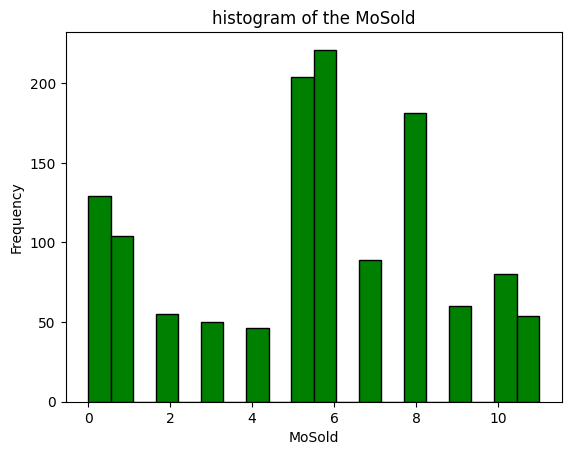

In [ ]:
# histogram
plt.hist(housing_data['MoSold'], bins = 20, color = 'green', edgecolor = 'black')
plt.xlabel('MoSold')
plt.ylabel('Frequency')
plt.title('histogram of the MoSold')
plt.show()

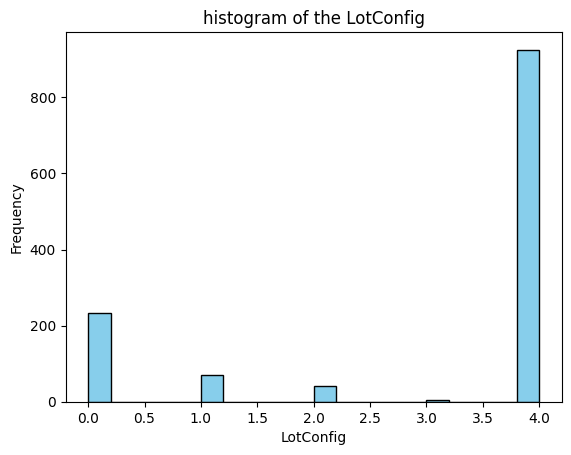

In [ ]:
# histogram
plt.hist(housing_data['LotConfig'], bins = 20, color = 'skyblue', edgecolor = 'black')
plt.xlabel('LotConfig')
plt.ylabel('Frequency')
plt.title('histogram of the LotConfig')
plt.show()

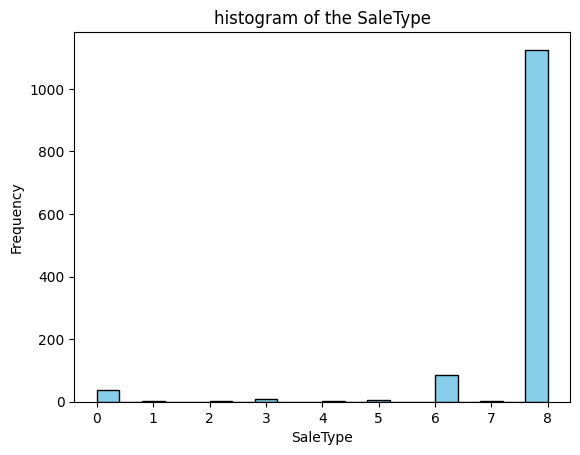

In [ ]:
# histogram
plt.hist(housing_data['SaleType'], bins = 20, color = 'skyblue', edgecolor = 'black')
plt.xlabel('SaleType')
plt.ylabel('Frequency')
plt.title('histogram of the SaleType')
plt.show()

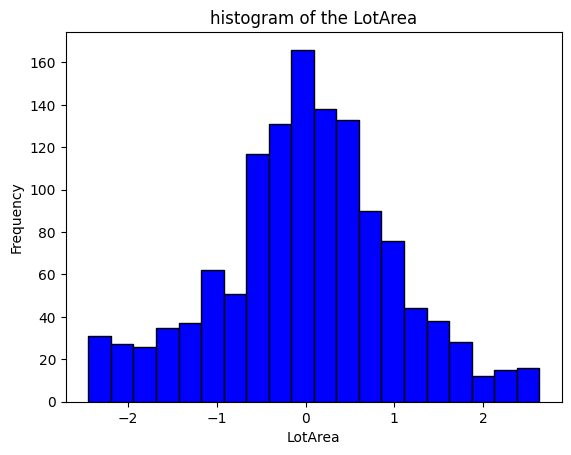

In [ ]:
# histogram
plt.hist(housing_data['LotArea'], bins = 20, color = 'blue', edgecolor = 'black')
plt.xlabel('LotArea')
plt.ylabel('Frequency')
plt.title('histogram of the LotArea')
plt.show()

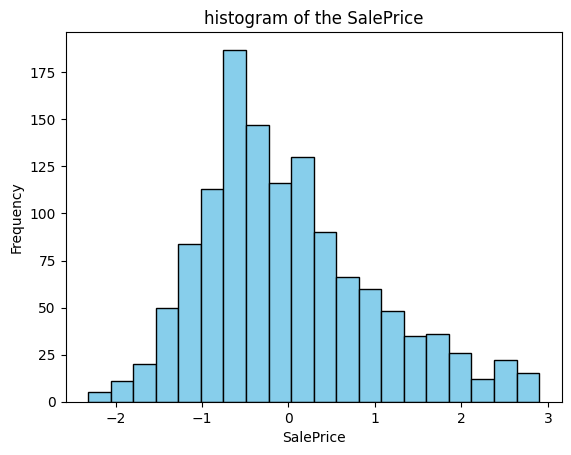

In [ ]:
# histogram
plt.hist(housing_data['SalePrice'], bins = 20, color = 'skyblue', edgecolor = 'black')
plt.xlabel('SalePrice')
plt.ylabel('Frequency')
plt.title('histogram of the SalePrice')
plt.show()

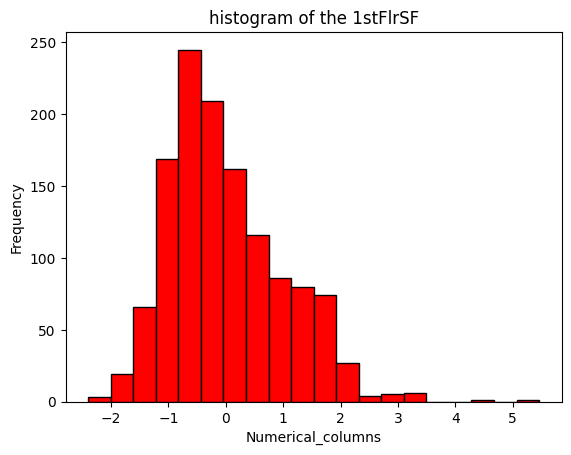

In [ ]:
# histogram
plt.hist(housing_data['1stFlrSF'], bins = 20, color = 'red', edgecolor = 'black')
plt.xlabel('Numerical_columns')
plt.ylabel('Frequency')
plt.title('histogram of the 1stFlrSF')
plt.show()

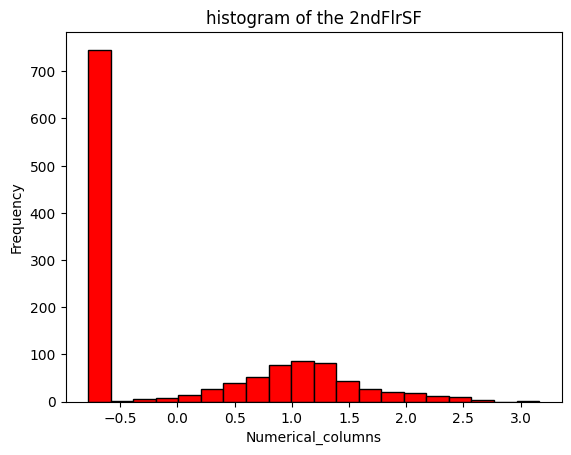

In [ ]:
# histogram
plt.hist(housing_data['2ndFlrSF'], bins = 20, color = 'red', edgecolor = 'black')
plt.xlabel('Numerical_columns')
plt.ylabel('Frequency')
plt.title('histogram of the 2ndFlrSF')
plt.show()

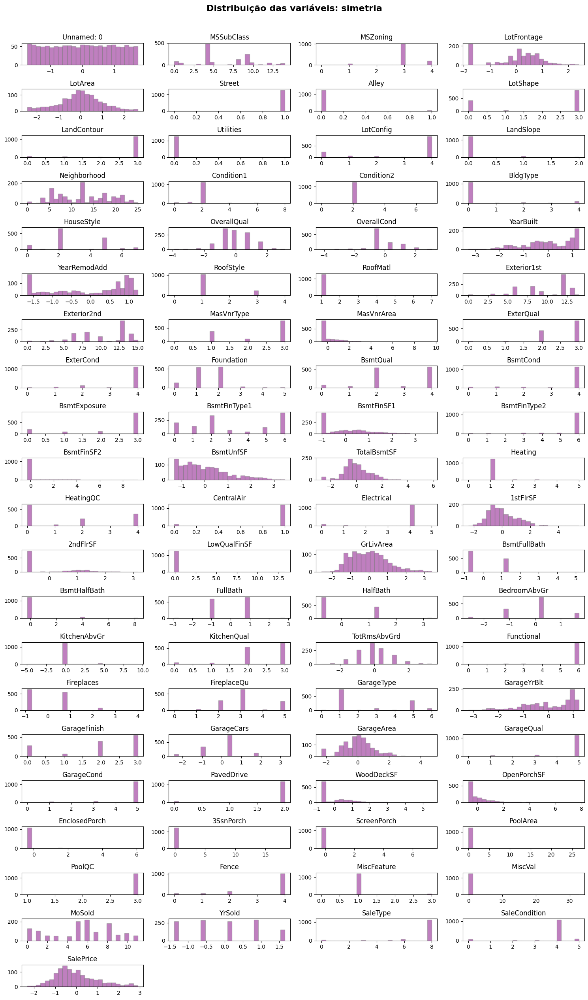

In [ ]:
housing_data.hist(bins=25, figsize=(15, 25), layout=(-1, 4), edgecolor="gray", color = 'purple', alpha = 0.5, grid = False)
plt.suptitle('Distribuição das variáveis: simetria', y = 1.01, fontsize = 16, fontweight = 'bold')
plt.tight_layout()
plt.show()

<ipython-input-102-d288bbbd9236>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['BedroomAbvGr'],shade = True, color = 'blue')


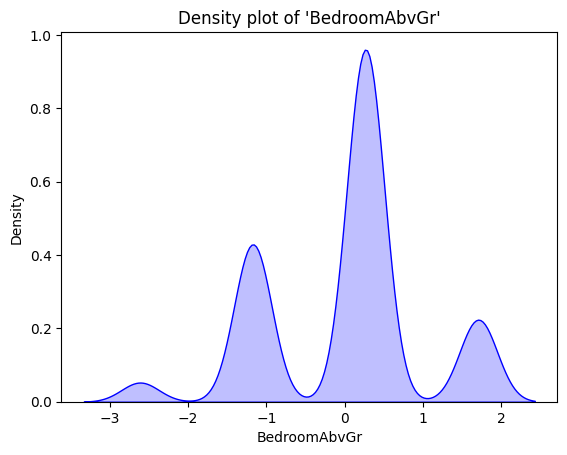

In [ ]:
# Density plot
sns.kdeplot(housing_data['BedroomAbvGr'],shade = True, color = 'blue')
plt.xlabel ('BedroomAbvGr')
plt.ylabel ('Density')
plt.title ("Density plot of 'BedroomAbvGr'")
plt.show()

<ipython-input-103-4a53ed168ebc>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['MSSubClass'],shade = True, color = 'skyblue')


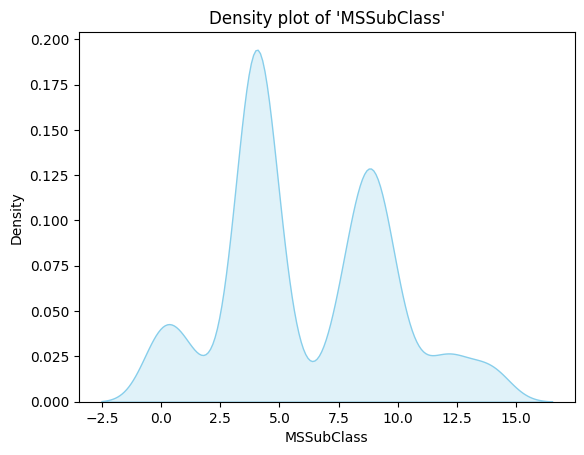

In [ ]:
# Density plot
sns.kdeplot(housing_data['MSSubClass'],shade = True, color = 'skyblue')
plt.xlabel ('MSSubClass')
plt.ylabel ('Density')
plt.title ("Density plot of 'MSSubClass'")
plt.show()

<ipython-input-104-4d9e43b13179>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['LotFrontage'],shade = True, color = 'red')


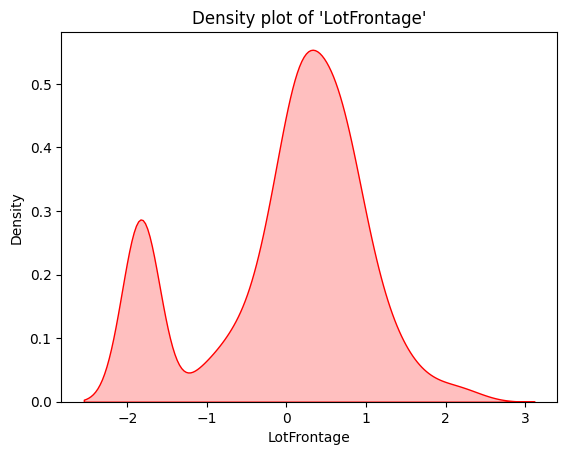

In [ ]:
# Density plot
sns.kdeplot(housing_data['LotFrontage'],shade = True, color = 'red')
plt.xlabel ('LotFrontage')
plt.ylabel ('Density')
plt.title ("Density plot of 'LotFrontage'")
plt.show()

<ipython-input-105-328919176919>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['LotArea'],shade = True, color = 'skyblue')


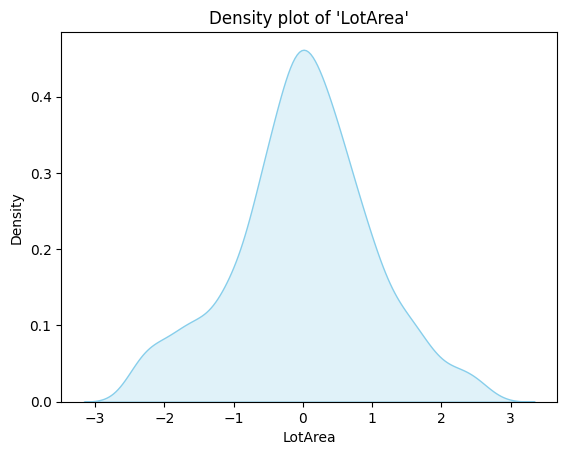

In [ ]:
# Density plot
sns.kdeplot(housing_data['LotArea'],shade = True, color = 'skyblue')
plt.xlabel ('LotArea')
plt.ylabel ('Density')
plt.title ("Density plot of 'LotArea'")
plt.show()

<ipython-input-106-4e1a51a0028f>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['1stFlrSF'],shade = True, color = 'skyblue')


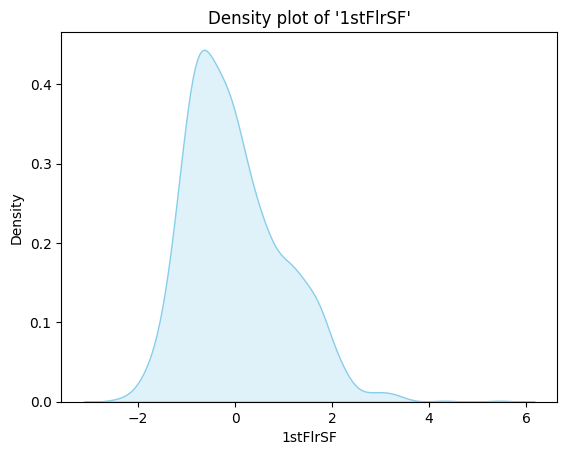

In [ ]:
# Density plot
sns.kdeplot(housing_data['1stFlrSF'],shade = True, color = 'skyblue')
plt.xlabel ('1stFlrSF')
plt.ylabel ('Density')
plt.title ("Density plot of '1stFlrSF'")
plt.show()

<ipython-input-107-8c55778b6d0e>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['PoolArea'],shade = True, color = 'blue')


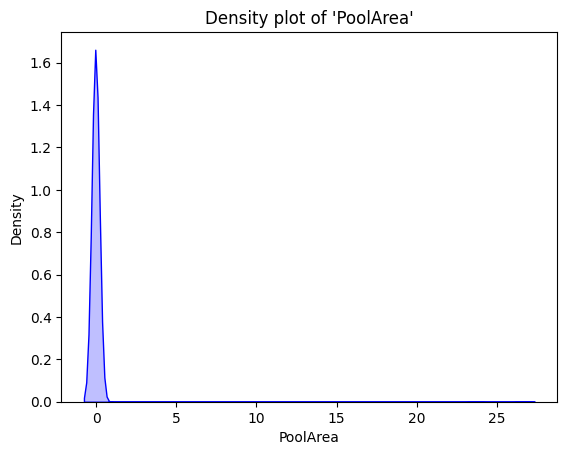

In [ ]:
# Density plot
sns.kdeplot(housing_data['PoolArea'],shade = True, color = 'blue')
plt.xlabel ('PoolArea')
plt.ylabel ('Density')
plt.title ("Density plot of 'PoolArea'")
plt.show()

<ipython-input-108-27c43683fa72>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['2ndFlrSF'],shade = True, color = 'skyblue')


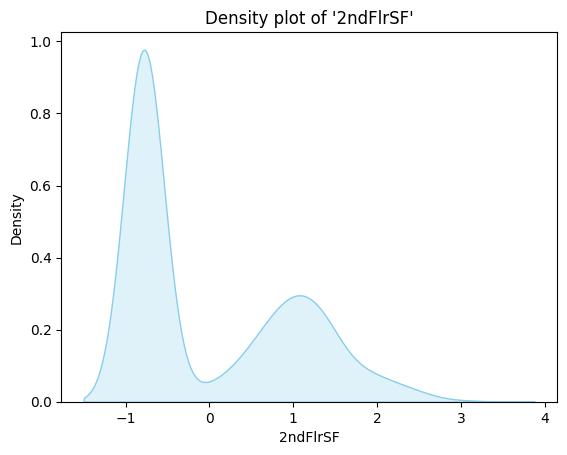

In [ ]:
# Density plot
sns.kdeplot(housing_data['2ndFlrSF'],shade = True, color = 'skyblue')
plt.xlabel ('2ndFlrSF')
plt.ylabel ('Density')
plt.title ("Density plot of '2ndFlrSF'")
plt.show()

<ipython-input-109-d433f8b229ed>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['SalePrice'],shade = True, color = 'red')


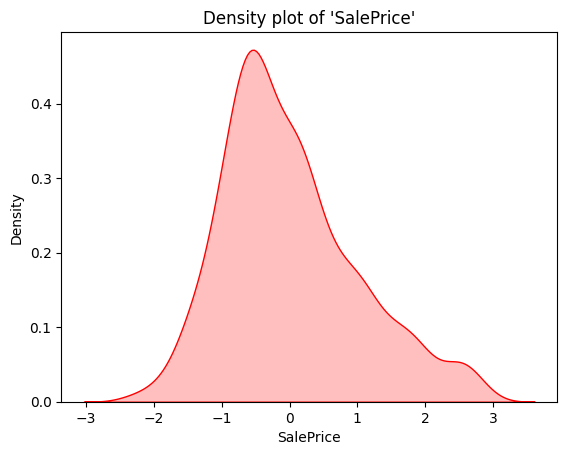

In [ ]:
# Density plot
sns.kdeplot(housing_data['SalePrice'],shade = True, color = 'red')
plt.xlabel ('SalePrice')
plt.ylabel ('Density')
plt.title ("Density plot of 'SalePrice'")
plt.show()

<ipython-input-110-d1fdde54058b>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(housing_data['OverallCond'],shade = True, color = 'red')


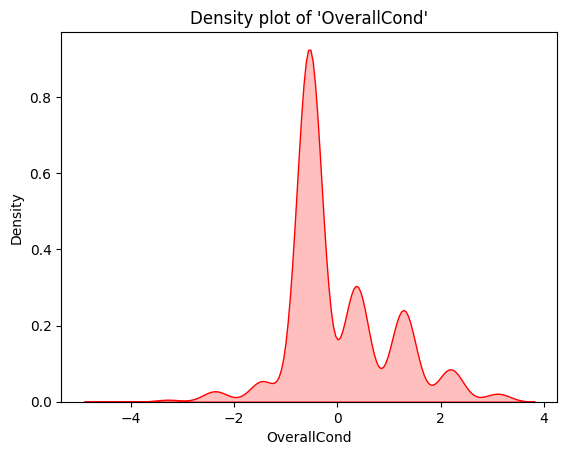

In [ ]:
# Density plot
sns.kdeplot(housing_data['OverallCond'],shade = True, color = 'red')
plt.xlabel ('OverallCond')
plt.ylabel ('Density')
plt.title ("Density plot of 'OverallCond'")
plt.show()

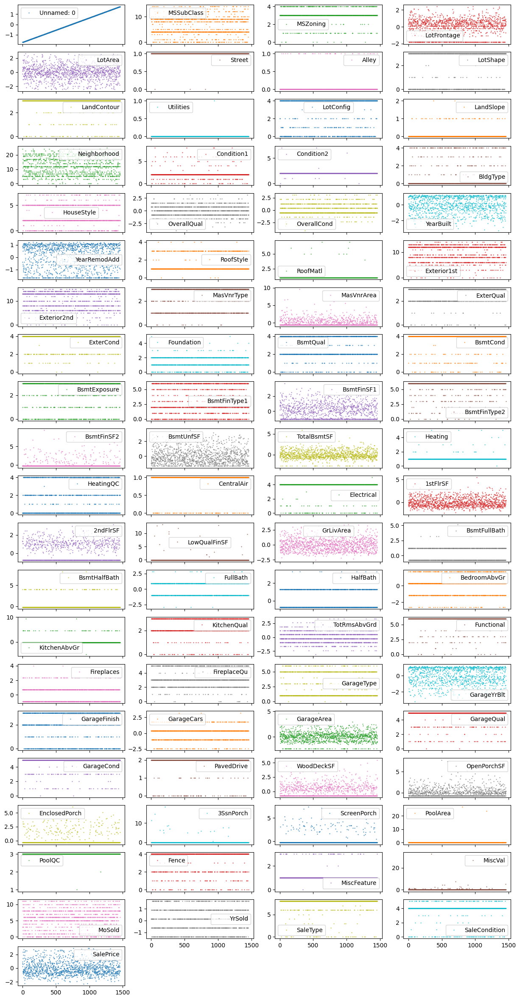

In [ ]:
housing_data.plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
          figsize=(15, 30), markersize=1);

<ipython-input-112-217082b1d139>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_data['BedroomAbvGr'], color= 'red')


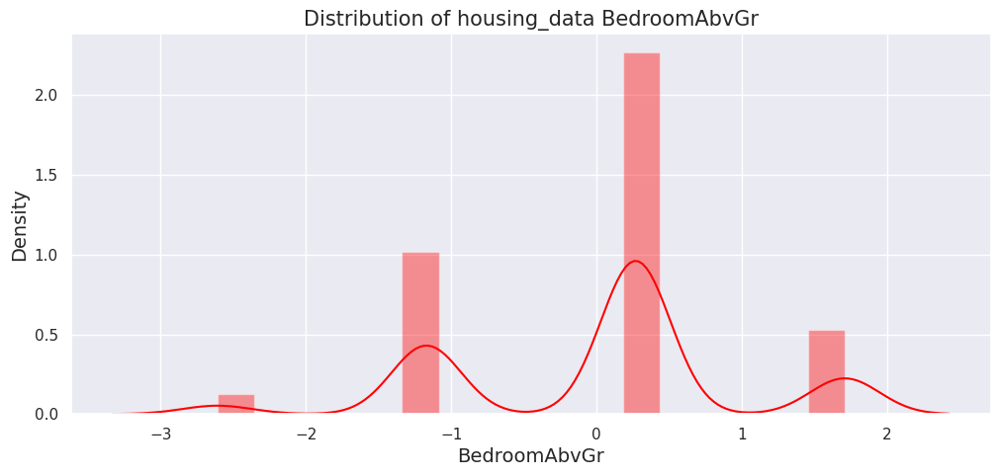

In [ ]:
# Distribution of the SalePrice
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(housing_data['BedroomAbvGr'], color= 'red')
plt.xlabel("BedroomAbvGr", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of housing_data BedroomAbvGr", fontsize = 15)
plt.show()

<ipython-input-113-bfc7a63a2b12>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_data['PoolArea'], color= 'green')


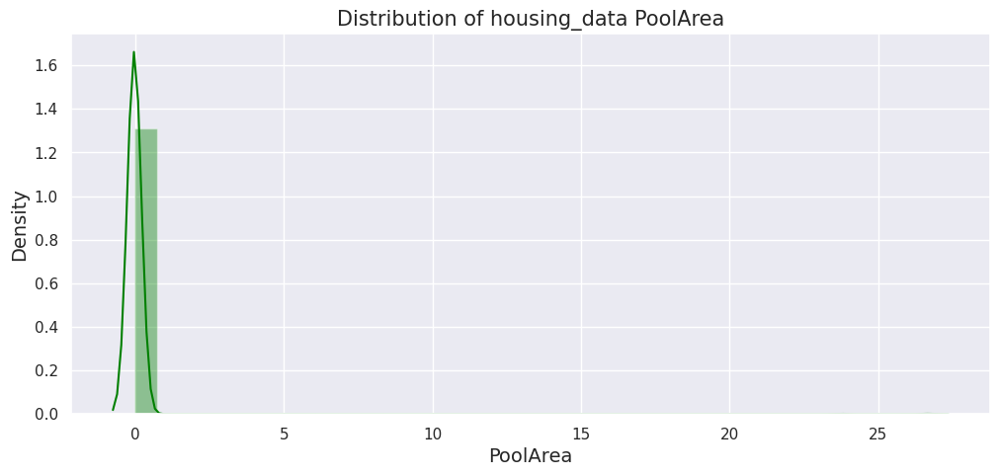

In [ ]:
# Distribution of the PoolArea
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(housing_data['PoolArea'], color= 'green')
plt.xlabel("PoolArea", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of housing_data PoolArea", fontsize = 15)
plt.show()

<ipython-input-114-a41378d15883>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_data['1stFlrSF'], color= 'red')


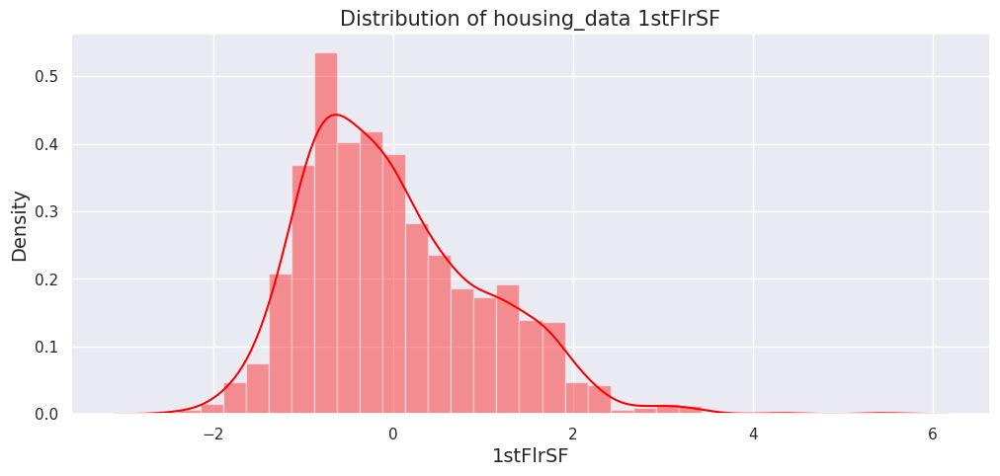

In [ ]:
# Distribution of the SalePrice
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(housing_data['1stFlrSF'], color= 'red')
plt.xlabel("1stFlrSF", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of housing_data 1stFlrSF", fontsize = 15)
plt.show()

<ipython-input-115-dea346001620>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_data['MoSold'], color= 'yellow')


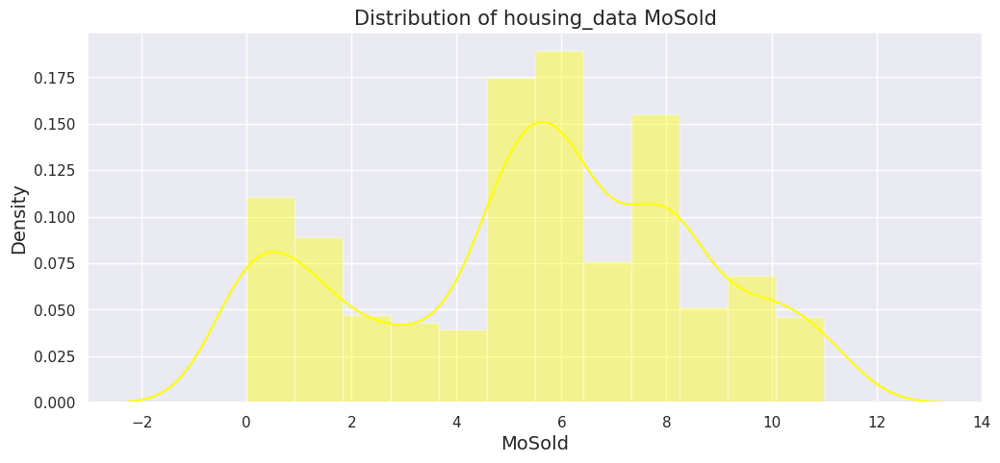

In [ ]:
# Distribution of the SalePrice
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(housing_data['MoSold'], color= 'yellow')
plt.xlabel("MoSold", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of housing_data MoSold", fontsize = 15)
plt.show()

<ipython-input-116-f1aa93aa8535>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_data['SalePrice'], color= 'blue')


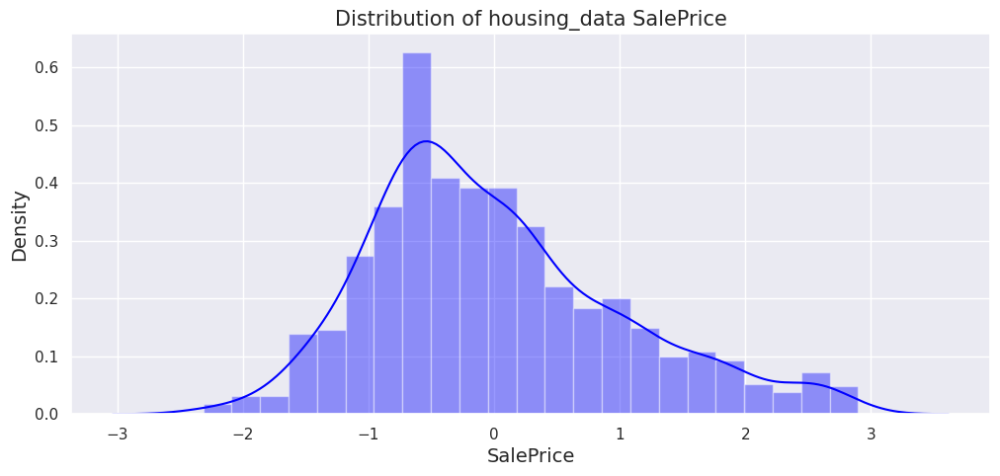

In [ ]:
# Distribution of the SalePrice
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(housing_data['SalePrice'], color= 'blue')
plt.xlabel("SalePrice", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of housing_data SalePrice", fontsize = 15)
plt.show()

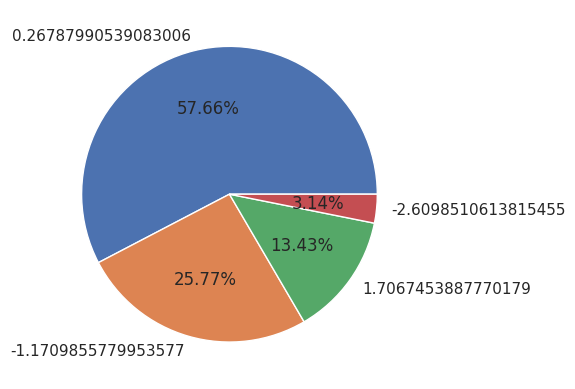

In [ ]:
plt.pie(labels=housing_data["BedroomAbvGr"].value_counts().index,
        x=housing_data["BedroomAbvGr"].value_counts().values, autopct = '%1.2f%%')
plt.show();

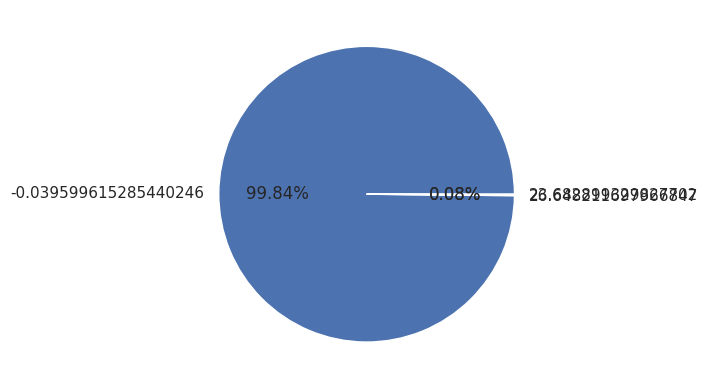

In [ ]:
plt.pie(labels=housing_data["PoolArea"].value_counts().index,
        x=housing_data["PoolArea"].value_counts().values, autopct = '%1.2f%%')
plt.show();

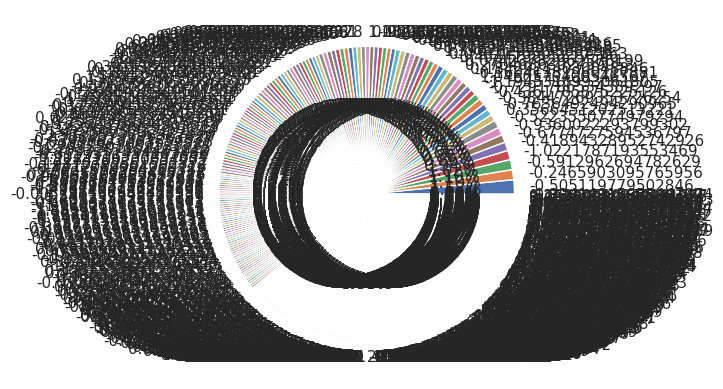

In [ ]:
plt.pie(labels=housing_data["SalePrice"].value_counts().index,
        x=housing_data["SalePrice"].value_counts().values, autopct = '%1.2f%%')
plt.show();

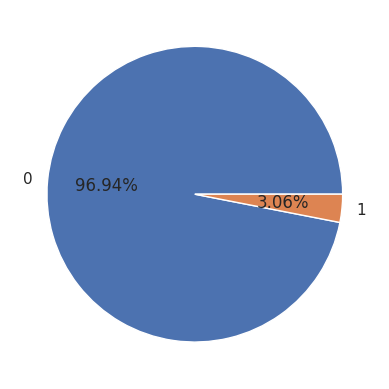

In [ ]:
plt.pie(labels=housing_data["Alley"].value_counts().index,
        x=housing_data["Alley"].value_counts().values, autopct = '%1.2f%%')
plt.show();

In [ ]:
# Feature Engineering
# import the libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler


In [ ]:
path = ('/content/housing_data.csv')

In [ ]:
data = pd.read_csv(path)

In [ ]:
# Group the Airbnb dataset by BedroomAbvGr and calculate the mean of each group
#grouped = Airbnb_df.groupby("BedroomAbvGr").mean()
grouped = housing_data.groupby("BedroomAbvGr")["SalePrice"].mean()
# Reset the indes of the grouped data so that the BedroomAbvGr becomes a column
BedroomAbvGr = grouped.reset_index()

#Rename the price to 'avg_price'
BedroomAbvGr = round(BedroomAbvGr.rename(columns={"SalePrice": 'avg_price'}), 2)


# Select only the 'BedroomAbvGr', and the avg_price
BedroomAbvGr[['BedroomAbvGr', 'avg_price']].head()


,BedroomAbvGr,avg_price
0,-2.61,-0.20
1,-1.17,-0.38
2,0.27,0.10
3,1.71,0.33


Text(0.5, 1.0, 'Average Price by the Neighborhood')

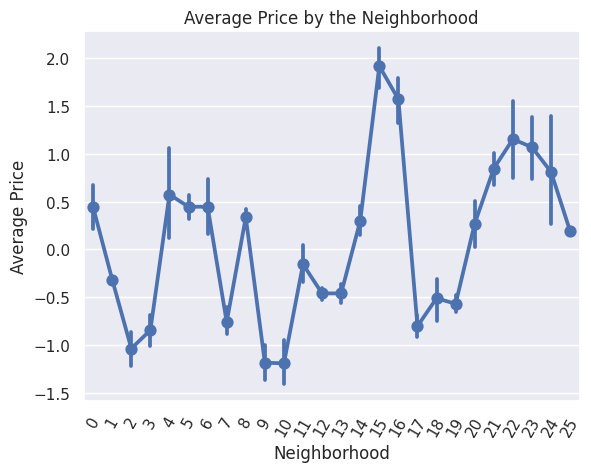

In [ ]:
# Import mean from the statistics module
from statistics import mean

# Create the pointplot
sns.pointplot(x = 'Neighborhood', y = 'SalePrice', data=housing_data, estimator=np.mean)

# Add axis and labels
plt.xlabel("Neighborhood")
plt.ylabel('Average Price')
plt.xticks(rotation = 60)
plt.title('Average Price by the Neighborhood')

Text(0.5, 1.0, 'SalePrice by the BedroomAbvGr')

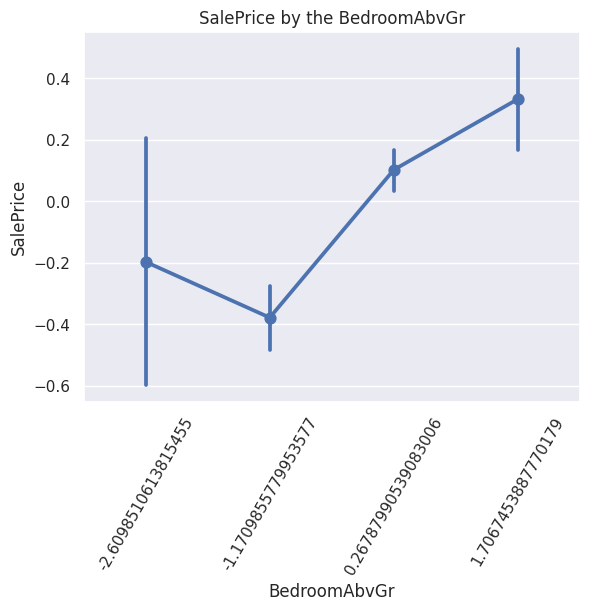

In [ ]:
# Import mean from the statistics module
from statistics import mean

# Create the pointplot
sns.pointplot(x = 'BedroomAbvGr', y = 'SalePrice', data=housing_data, estimator=np.mean)

# Add axis and labels
plt.xlabel("BedroomAbvGr")
plt.ylabel('SalePrice')
plt.xticks(rotation = 60)
plt.title('SalePrice by the BedroomAbvGr')

([0, 1, 2, 3],
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

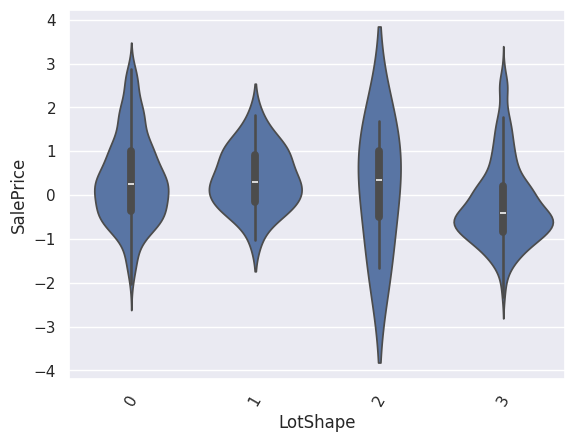

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'LotShape', y = 'SalePrice', data = housing_data)
plt.xticks(rotation = 60)

([0, 1, 2, 3],
 [Text(0, 0, '-2.6098510613815455'),
  Text(1, 0, '-1.1709855779953577'),
  Text(2, 0, '0.26787990539083006'),
  Text(3, 0, '1.7067453887770179')])

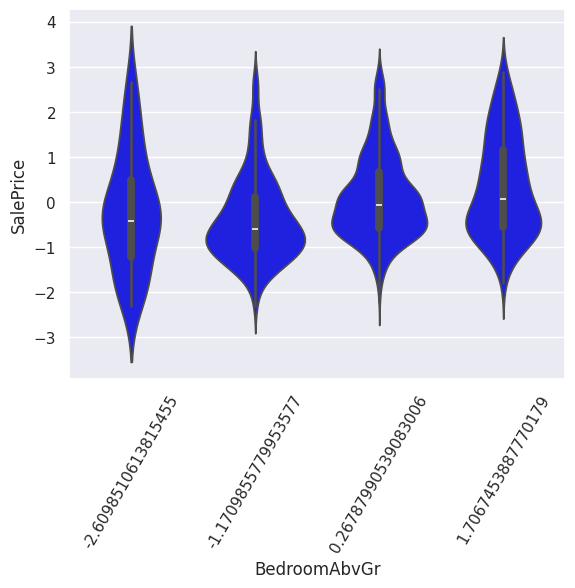

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'BedroomAbvGr', y = 'SalePrice',color = 'blue', data = housing_data)
plt.xticks(rotation = 60)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11')])

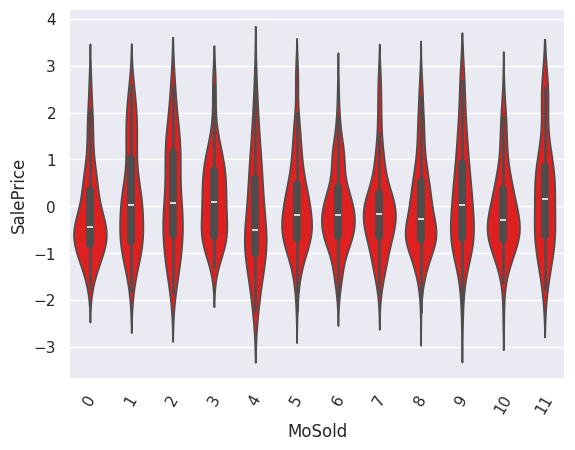

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'MoSold', y = 'SalePrice',color = 'red', data = housing_data)
plt.xticks(rotation = 60)

([0, 1, 2],
 [Text(0, 0, '-0.039599615285440246'),
  Text(1, 0, '23.682899329827702'),
  Text(2, 0, '26.648211697966847')])

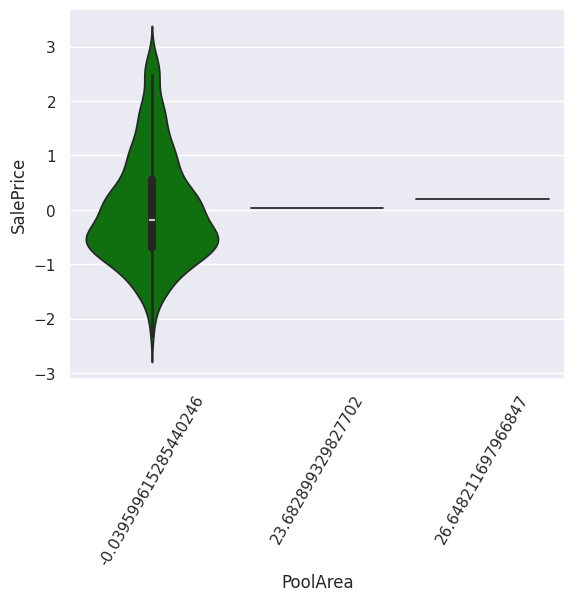

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'PoolArea', y = 'SalePrice',color = 'green', data = housing_data)
plt.xticks(rotation = 60)

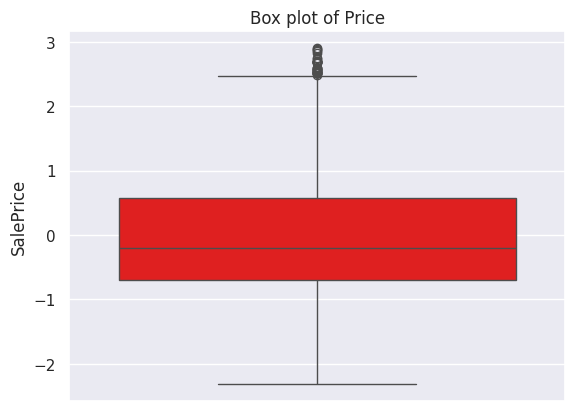

In [ ]:
# Check that the outliers
sns.boxplot(data = housing_data, y ='SalePrice',color = 'red')
plt.title('Box plot of Price')
plt.show()

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
#lower_limit_iqr,upper_limit_iqr = iqr_technique(housing_data['SalePrice'])

In [ ]:
lower_range, upper_range = iqr_technique(housing_data['SalePrice'])
housing_data = housing_data[(housing_data.SalePrice > lower_range) & (housing_data.SalePrice <upper_range)]

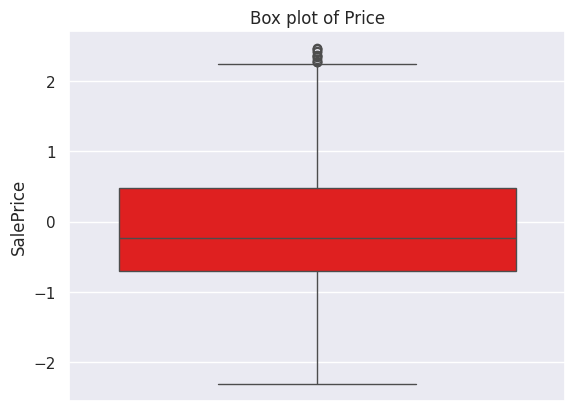

In [ ]:
# Check that the outliers are removed.
sns.boxplot(data = housing_data, y ='SalePrice',color = 'red')
plt.title('Box plot of Price')
plt.show()

In [ ]:
# Import the neccesary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
concatenate_df=pd.concat([housing_data],axis=0) #Data ko concatenate karna
concatenate_df

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,-1.723005,9,3,0.287274,-0.223328,1,0,3,3,0,...,-0.0396,3,4,1,-0.082586,3,0.134955,8,4,0.675498
1,-1.720636,4,3,0.775264,0.164842,1,0,3,3,0,...,-0.0396,3,4,1,-0.082586,8,-0.621863,8,4,0.210145
2,-1.718267,9,3,0.384872,0.721781,1,0,0,3,0,...,-0.0396,3,4,1,-0.082586,11,0.134955,8,4,0.934028
3,-1.715898,10,3,0.124611,0.147965,1,0,0,3,0,...,-0.0396,3,4,1,-0.082586,3,-1.378680,8,0,-0.505120
4,-1.713529,9,3,0.905395,1.737773,1,0,0,3,0,...,-0.0396,3,4,1,-0.082586,2,0.134955,8,4,1.390763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.723975,9,3,0.189676,-0.403237,1,0,3,3,0,...,-0.0396,3,4,1,-0.082586,1,-0.621863,8,4,0.098116
1456,1.726344,4,3,0.937928,1.371544,1,0,3,3,0,...,-0.0396,3,2,1,-0.082586,3,1.648590,8,4,0.701351
1457,1.728713,10,3,0.319807,-0.023505,1,0,3,3,0,...,-0.0396,3,0,3,5.207430,8,1.648590,8,4,1.675145
1458,1.731082,4,3,0.384872,0.204334,1,0,3,3,0,...,-0.0396,3,4,1,-0.082586,0,1.648590,8,4,-0.468495


<Axes: >

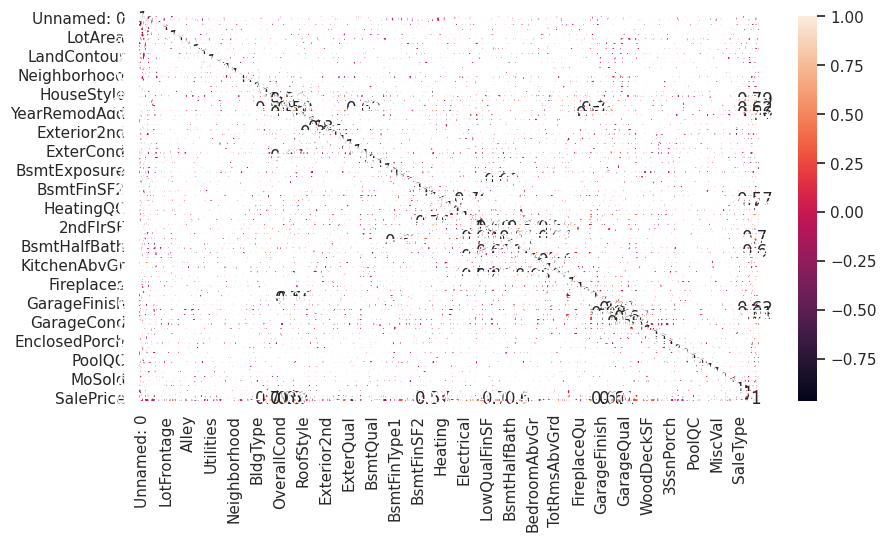

In [ ]:
plt.figure(figsize=[10,5])
sns.heatmap(housing_data.corr(),annot= True)

In [ ]:
from scipy.stats import skew

In [ ]:
skewness = skew(concatenate_df['SalePrice'])
skewness

0.5084662633091288

In [ ]:
numeric_columns =concatenate_df .select_dtypes(include=["number"]) # skewed data of every column
numeric_columns.skew()


Unnamed: 0      -0.014718
MSSubClass       0.280140
MSZoning        -1.719125
LotFrontage     -0.616151
LotArea         -0.090871
                   ...   
MoSold          -0.240082
YrSold           0.097617
SaleType        -4.036045
SaleCondition   -2.899539
SalePrice        0.509082
Length: 81, dtype: float64

In [ ]:
corelation_of_data = pd.DataFrame(concatenate_df)

# Calculate correlation
correlation_matrix = corelation_of_data.corr()

print(correlation_matrix)

               Unnamed: 0  MSSubClass  MSZoning  LotFrontage   LotArea  \
Unnamed: 0       1.000000    0.025174 -0.010372    -0.013565 -0.027006   
MSSubClass       0.025174    1.000000  0.038413     0.129094  0.304761   
MSZoning        -0.010372    0.038413  1.000000    -0.040017 -0.053565   
LotFrontage     -0.013565    0.129094 -0.040017     1.000000  0.223031   
LotArea         -0.027006    0.304761 -0.053565     0.223031  1.000000   
...                   ...         ...       ...          ...       ...   
MoSold           0.040901    0.011003 -0.006033     0.002129 -0.003257   
YrSold          -0.005719   -0.008434 -0.024705    -0.015874 -0.032848   
SaleType         0.001208    0.065241  0.097475    -0.042976 -0.019170   
SaleCondition    0.002013   -0.053418  0.026470     0.015431  0.024404   
SalePrice       -0.002212    0.033184 -0.226651     0.107681  0.360901   

                 Street     Alley  LotShape  LandContour  Utilities  ...  \
Unnamed: 0     0.028710  0.003921  

In [ ]:
# Convert the non-numeric column to a numeric data type
corelation_of_data['SalePrice'] = pd.to_datetime(corelation_of_data['SalePrice'])

# Calculate correlation
correlation_matrix = corelation_of_data.corr()

print(correlation_matrix)


               Unnamed: 0  MSSubClass  MSZoning  LotFrontage   LotArea  \
Unnamed: 0       1.000000    0.025174 -0.010372    -0.013565 -0.027006   
MSSubClass       0.025174    1.000000  0.038413     0.129094  0.304761   
MSZoning        -0.010372    0.038413  1.000000    -0.040017 -0.053565   
LotFrontage     -0.013565    0.129094 -0.040017     1.000000  0.223031   
LotArea         -0.027006    0.304761 -0.053565     0.223031  1.000000   
...                   ...         ...       ...          ...       ...   
MoSold           0.040901    0.011003 -0.006033     0.002129 -0.003257   
YrSold          -0.005719   -0.008434 -0.024705    -0.015874 -0.032848   
SaleType         0.001208    0.065241  0.097475    -0.042976 -0.019170   
SaleCondition    0.002013   -0.053418  0.026470     0.015431  0.024404   
SalePrice        0.026200    0.021230 -0.137050     0.110626  0.306967   

                 Street     Alley  LotShape  LandContour  Utilities  ...  \
Unnamed: 0     0.028710  0.003921  

In [ ]:
concatenate_df.head()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,-1.723005,9,3,0.287274,-0.223328,1,0,3,3,0,...,-0.0396,3,4,1,-0.082586,3,0.134955,8,4,0.675498
1,-1.720636,4,3,0.775264,0.164842,1,0,3,3,0,...,-0.0396,3,4,1,-0.082586,8,-0.621863,8,4,0.210145
2,-1.718267,9,3,0.384872,0.721781,1,0,0,3,0,...,-0.0396,3,4,1,-0.082586,11,0.134955,8,4,0.934028
3,-1.715898,10,3,0.124611,0.147965,1,0,0,3,0,...,-0.0396,3,4,1,-0.082586,3,-1.378680,8,0,-0.505120
4,-1.713529,9,3,0.905395,1.737773,1,0,0,3,0,...,-0.0396,3,4,1,-0.082586,2,0.134955,8,4,1.390763


In [ ]:
# prompt: Using dataframe concatenate_df: generate code for corelation matrix

import pandas as pd
correlation_matrix = concatenate_df.corr()
print(correlation_matrix)


               Unnamed: 0  MSSubClass  MSZoning  LotFrontage   LotArea  \
Unnamed: 0       1.000000    0.025174 -0.010372    -0.013565 -0.027006   
MSSubClass       0.025174    1.000000  0.038413     0.129094  0.304761   
MSZoning        -0.010372    0.038413  1.000000    -0.040017 -0.053565   
LotFrontage     -0.013565    0.129094 -0.040017     1.000000  0.223031   
LotArea         -0.027006    0.304761 -0.053565     0.223031  1.000000   
...                   ...         ...       ...          ...       ...   
MoSold           0.040901    0.011003 -0.006033     0.002129 -0.003257   
YrSold          -0.005719   -0.008434 -0.024705    -0.015874 -0.032848   
SaleType         0.001208    0.065241  0.097475    -0.042976 -0.019170   
SaleCondition    0.002013   -0.053418  0.026470     0.015431  0.024404   
SalePrice       -0.002212    0.033184 -0.226651     0.107681  0.360901   

                 Street     Alley  LotShape  LandContour  Utilities  ...  \
Unnamed: 0     0.028710  0.003921  

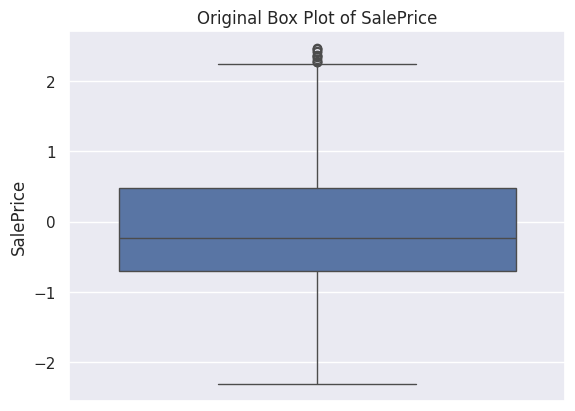

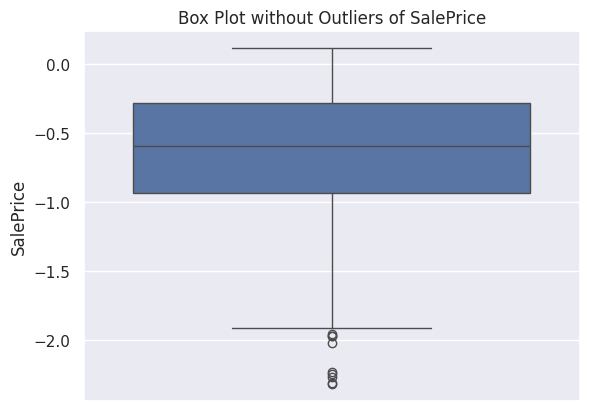

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


def removal_box_plot(df, column, threshold):
    sns.boxplot(df[column])
    plt.title(f'Original Box Plot of {column}')
    plt.show()

    removed_outliers = df[df[column] <= threshold]

    sns.boxplot(removed_outliers[column])
    plt.title(f'Box Plot without Outliers of {column}')
    plt.show()
    return removed_outliers


threshold_value = 0.12

no_outliers = removal_box_plot(concatenate_df, 'SalePrice', threshold_value)


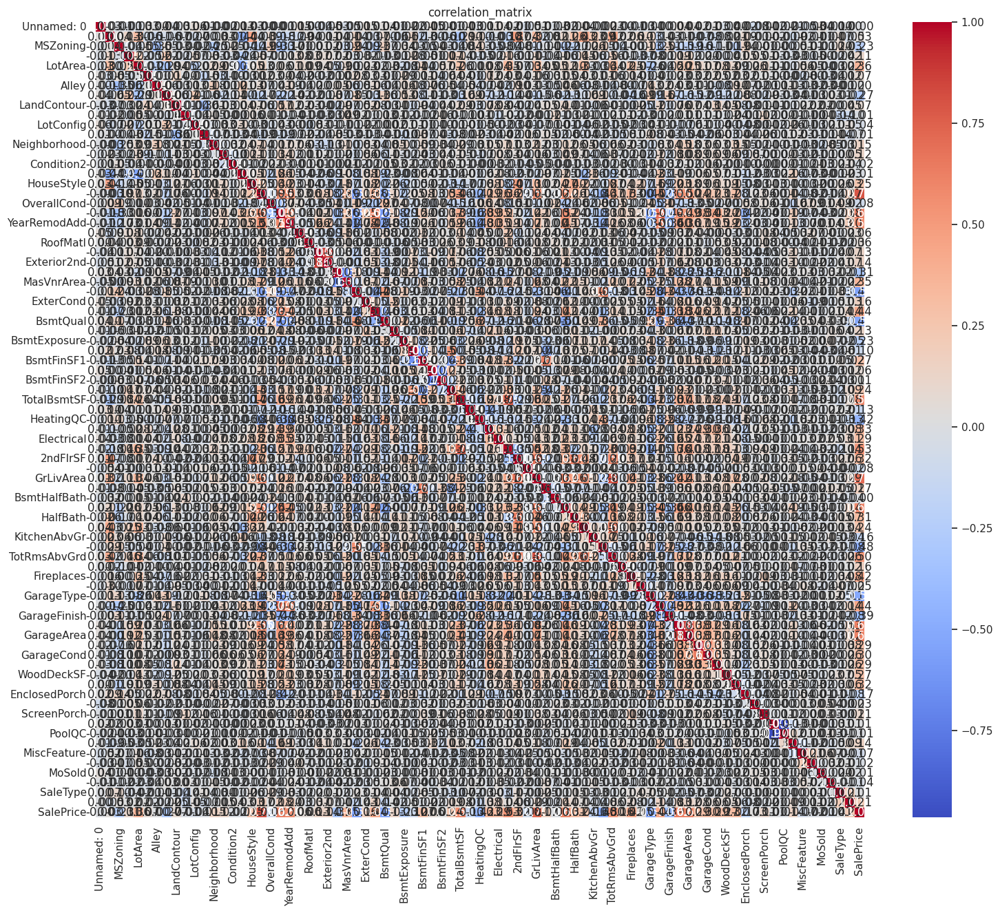

In [ ]:
#correlation_matrix = 'column'.corr()
plt.figure(figsize = (18,15))
sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title('correlation_matrix')
plt.show()

# HOUSING DATA ##

In [ ]:
# Feature Engineering
# import the libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
Path = ('/content/housing_data.csv')

In [ ]:
House_data = pd.read_csv(Path) #uploading data_set_

Data Exploration

In [ ]:
House_data

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data.head()# Assuming 'Data' is your DataFrame top five

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000


In [ ]:
House_data.head().T

,0,1,2,3,4
Unnamed: 0,0,1,2,3,4
MSSubClass,SC60,SC20,SC60,SC70,SC60
MSZoning,RL,RL,RL,RL,RL
LotFrontage,65,80,68,60,84
LotArea,8450,9600,11250,9550,14260
...,...,...,...,...,...
MoSold,Feb,May,Sep,Feb,Dec
YrSold,2008,2007,2008,2006,2008
SaleType,WD,WD,WD,WD,WD
SaleCondition,Normal,Normal,Normal,Abnorml,Normal


In [ ]:
House_data.tail()# Assuming 'Data' is your DataFrame botam five

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125
1459,1459,SC20,RL,75,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2008,WD,Normal,147500


In [ ]:
House_data.tail().T

,1455,1456,1457,1458,1459
Unnamed: 0,1455,1456,1457,1458,1459
MSSubClass,SC60,SC20,SC70,SC20,SC20
MSZoning,RL,RL,RL,RL,RL
LotFrontage,62,85,66,68,75
LotArea,7917,13175,9042,9717,9937
...,...,...,...,...,...
MoSold,Aug,Feb,May,Apr,Jun
YrSold,2007,2010,2010,2010,2008
SaleType,WD,WD,WD,WD,WD
SaleCondition,Normal,Normal,Normal,Normal,Normal


In [ ]:
House_data.shape # number or row and columns

(1460, 81)

In [ ]:
House_data.shape[0] # number or Columns

1460

In [ ]:
House_data.shape[1] #number of Row

81

In [ ]:
House_data.info() # check the info about dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
House_data.dtypes # check the Data types

Unnamed: 0        int64
MSSubClass       object
MSZoning         object
LotFrontage       int64
LotArea           int64
                  ...  
MoSold           object
YrSold            int64
SaleType         object
SaleCondition    object
SalePrice         int64
Length: 81, dtype: object

In [ ]:
House_data.isnull().sum() # check the null values

Unnamed: 0       0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64

In [ ]:
House_data.isnull().sum().sum() # Total null values of the Data

2323

In [ ]:
House_data.isna() #Each element is a missing value (NaN)

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1456,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1457,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1458,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
House_data.ndim # Dimenation of data

2

In [ ]:
House_data.isnull().sum()/House_data.shape[0]*100   #percentage of missing value

Unnamed: 0       0.0
MSSubClass       0.0
MSZoning         0.0
LotFrontage      0.0
LotArea          0.0
                ... 
MoSold           0.0
YrSold           0.0
SaleType         0.0
SaleCondition    0.0
SalePrice        0.0
Length: 81, dtype: float64

In [ ]:
House_data.describe() # Summary of the data

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,729.500000,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,...,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,2007.815753,180921.195890
std,421.610009,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,...,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,1.328095,79442.502883
min,0.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000
25%,364.750000,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129975.000000
50%,729.500000,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,163000.000000
75%,1094.250000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,...,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000,214000.000000
max,1459.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,2010.000000,755000.000000


In [ ]:
House_data.describe().T # Summary of the data table

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,1460.0,729.500000,421.610009,0.0,364.75,729.5,1094.25,1459.0
LotFrontage,1460.0,57.623288,34.664304,0.0,42.00,63.0,79.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1460.0,103.117123,180.731373,0.0,0.00,0.0,164.25,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


In [ ]:
columns = House_data.columns # Total columns of the Data Set

In [ ]:
columns

Index(['Unnamed: 0', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'Pa

In [ ]:
House_data.drop(['Unnamed: 0'],axis = 1) # Drop the column

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data.drop_duplicates()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data.dropna() # Cleaned data where rows containing any missing values have been remove

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
56,56,SC160,FV,24,2645,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2009,WD,Abnorml,172500
87,87,SC160,FV,40,3951,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2009,New,Partial,164500
115,115,SC160,FV,34,3230,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2007,WD,Normal,176000
281,281,SC20,FV,60,7200,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2006,New,Partial,185000
297,297,SC60,FV,66,7399,Pave,Pave,IR1,Lvl,AllPub,...,0,No,No,No,0,Jun,2007,WD,Normal,239000
505,505,SC90,RM,60,7596,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,Jul,2009,COD,Normal,124500
579,579,SC50,RM,81,12150,Pave,Grvl,Reg,Lvl,AllPub,...,0,No,No,No,0,Nov,2008,WD,Normal,131500
755,755,SC160,FV,34,3230,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Mar,2009,WD,Normal,172500
758,758,SC160,FV,24,2280,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2008,WD,Normal,179400
914,914,SC160,FV,30,3000,Pave,Pave,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2009,New,Partial,173733


## MSSub Class: Identifies type of the dwelling involved in the Sale ##



### SC20 = 1 - STORY 1946 & NEWER ALL STYLES

In [ ]:
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC20':'1-STORY 1946 & NEWER ALL STYLES'})
House_data

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


## SC30 = 1 - STORY 1945 & OLDER ##
## SC40 = 1 - STORY W/FINISHED ATTICL ALL AGES ##
## SC45 = 1-1/2 STORY UNFINISHED ALL AGE ##
## SC50 = 1-1/2 STORY FINISHED ALL AGE ##
## SC60 = 2 - STORY 1946 $ NEWER

## SC70 = 2 - STORY 1945 $ ODER
## SC75 = 2-1/2 STORY ALL AGE
## SC80 = SPLIT OR MULTI-LEVEL
## SC90 = DUPLEX-ALL STYLES AND AGES
## SC120 = 1-STORY PUD (Planned unit Devloprment)- 1946 & VEWER


In [ ]:
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC30':'1 - STORY 1945 & OLDER'})
House_data

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC40':'1 - STORY W/FINISHED ATTICL ALL AGES'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC45':'1-1/2 STORY UNFINISHED ALL AGE'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC50':'1-1/2 STORY FINISHED ALL AGE'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC60':'2-STORY 1946 $ NEWER'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC70':'2 - STORY 1945 $ ODER'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC75':'2-1/2 STORY ALL AGE'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC80':' SPLIT OR MULTI-LEVEL'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC90':' DUPLEX-ALL STYLES AND AGES'})
House_data['MSSubClass'] = House_data['MSSubClass'].replace({'SC120':'1-STORY PUD (Planned unit Devloprment)- 1946 & VEWER'})


In [ ]:
House_data

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


## RENAME OF THE COLUMN MSSubClass TO MS SUB CLASS

In [ ]:
House_data.rename(columns={'MSSubClass':'Type of Dwelling'}, inplace = True)

In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


## UNIQUE VALUES OF TYPE OF DWELLING

In [ ]:
House_data['Type of Dwelling'].unique()

array(['2-STORY 1946 $ NEWER', '1-STORY 1946 & NEWER ALL STYLES',
       '2 - STORY 1945 $ ODER', '1-1/2 STORY FINISHED ALL AGE', 'SC190',
       '1-1/2 STORY UNFINISHED ALL AGE', ' DUPLEX-ALL STYLES AND AGES',
       '1-STORY PUD (Planned unit Devloprment)- 1946 & VEWER',
       '1 - STORY 1945 & OLDER', 'SC85', ' SPLIT OR MULTI-LEVEL', 'SC160',
       '2-1/2 STORY ALL AGE', 'SC180',
       '1 - STORY W/FINISHED ATTICL ALL AGES'], dtype=object)

In [ ]:
House_data['Type of Dwelling'].nunique()

15

## TYPE OF DWELLING VALUES COUNTS AND PLOT

In [ ]:
House_data['Type of Dwelling'].value_counts()

Type of Dwelling
1-STORY 1946 & NEWER ALL STYLES                         536
2-STORY 1946 $ NEWER                                    299
1-1/2 STORY FINISHED ALL AGE                            144
1-STORY PUD (Planned unit Devloprment)- 1946 & VEWER     87
1 - STORY 1945 & OLDER                                   69
SC160                                                    63
2 - STORY 1945 $ ODER                                    60
 SPLIT OR MULTI-LEVEL                                    58
 DUPLEX-ALL STYLES AND AGES                              52
SC190                                                    30
SC85                                                     20
2-1/2 STORY ALL AGE                                      16
1-1/2 STORY UNFINISHED ALL AGE                           12
SC180                                                    10
1 - STORY W/FINISHED ATTICL ALL AGES                      4
Name: count, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, '1-STORY 1946 & NEWER ALL STYLES'),
  Text(1, 0, '2-STORY 1946 $ NEWER'),
  Text(2, 0, '1-1/2 STORY FINISHED ALL AGE'),
  Text(3, 0, '1-STORY PUD (Planned unit Devloprment)- 1946 & VEWER'),
  Text(4, 0, '1 - STORY 1945 & OLDER'),
  Text(5, 0, 'SC160'),
  Text(6, 0, '2 - STORY 1945 $ ODER'),
  Text(7, 0, ' SPLIT OR MULTI-LEVEL'),
  Text(8, 0, ' DUPLEX-ALL STYLES AND AGES'),
  Text(9, 0, 'SC190'),
  Text(10, 0, 'SC85'),
  Text(11, 0, '2-1/2 STORY ALL AGE'),
  Text(12, 0, '1-1/2 STORY UNFINISHED ALL AGE'),
  Text(13, 0, 'SC180'),
  Text(14, 0, '1 - STORY W/FINISHED ATTICL ALL AGES')])

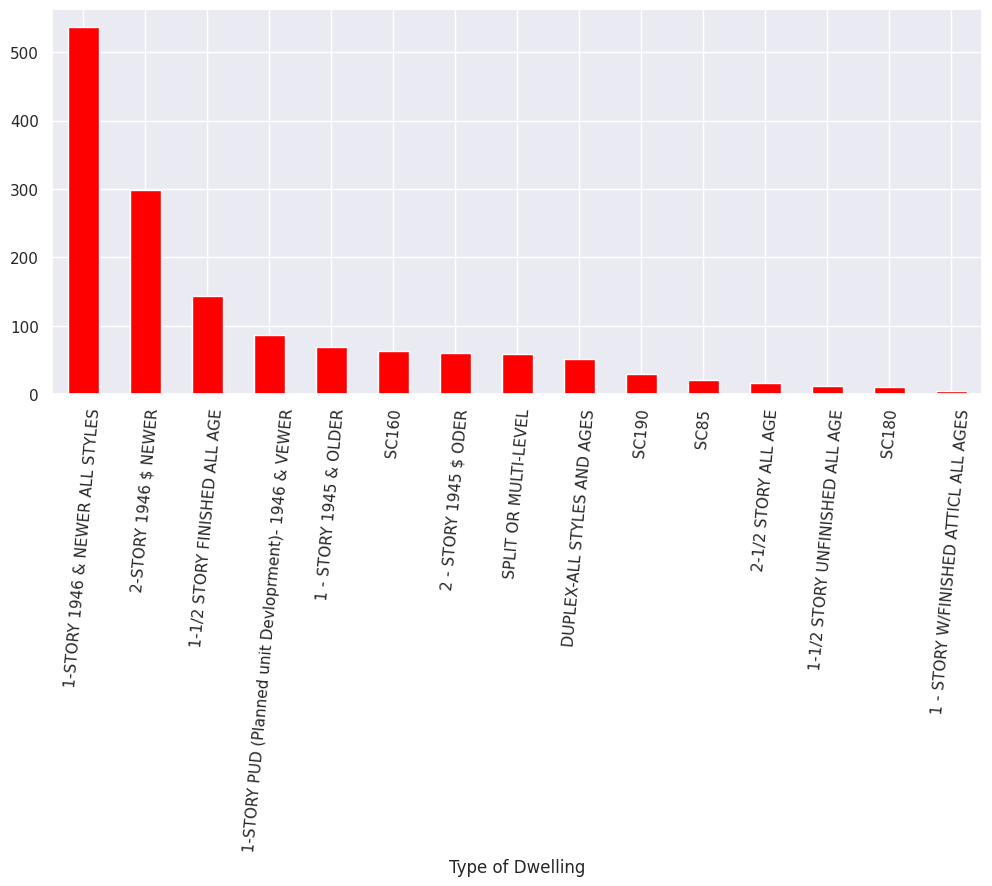

In [ ]:
plt.figure(figsize=(12,5))
House_data['Type of Dwelling'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

## MSZoning : Identifies the General Zoning classification of the sale.
##VALUE COUNTS OF MSZONING TO CHECK ZONES

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'RL'),
  Text(1, 0, 'RM'),
  Text(2, 0, 'FV'),
  Text(3, 0, 'RH'),
  Text(4, 0, 'C (all)')])

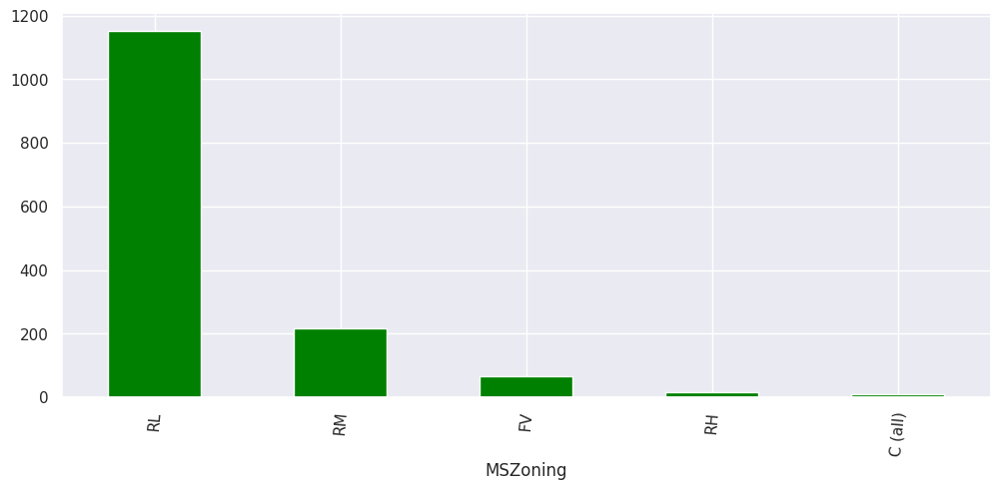

In [ ]:
plt.figure(figsize=(12,5))
House_data['MSZoning'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

##VALUE COUNTS OF LotFrontage TO CHECK ZONES

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110]),
 [Text(0, 0, '0'),
  Text(1, 0, '60'),
  Text(2, 0, '70'),
  Text(3, 0, '80'),
  Text(4, 0, '50'),
  Text(5, 0, '75'),
  Text(6, 0, '65'),
  Text(7, 0, '85'),
  Text(8, 0, '78'),
  Text(9, 0, '90'),
  Text(10, 0, '21'),
  Text(11, 0, '24'),
  Text(12, 0, '68'),
  Text(13, 0, '64'),
  Text(14, 0, '73'),
  Text(15, 0, '63'),
  Text(16, 0, '55'),
  Text(17, 0, '72'),
  Te

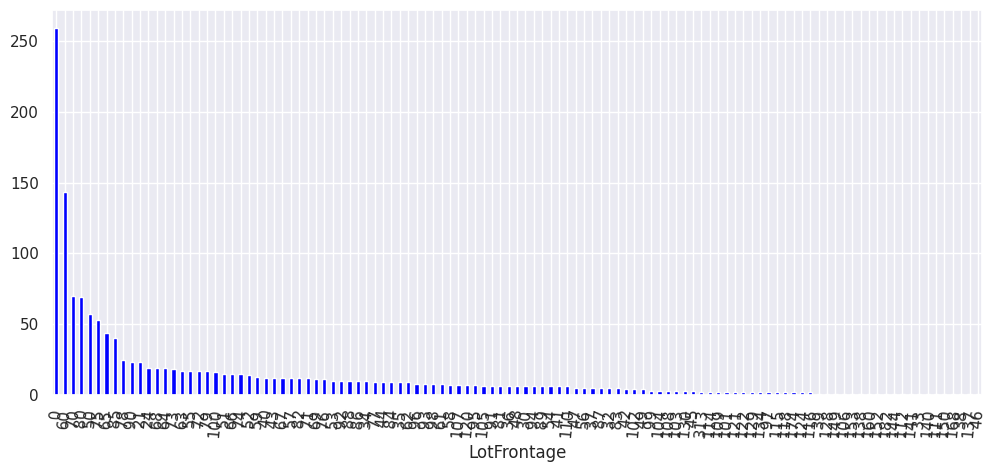

In [ ]:
plt.figure(figsize=(12,5))
House_data['LotFrontage'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

In [ ]:
columns

Index(['Unnamed: 0', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'Pa

##VALUE COUNTS AND CHECK PLOTS

(array([   0,    1,    2, ..., 1070, 1071, 1072]),
 [Text(0, 0, '7200'),
  Text(1, 0, '9600'),
  Text(2, 0, '6000'),
  Text(3, 0, '10800'),
  Text(4, 0, '8400'),
  Text(5, 0, '9000'),
  Text(6, 0, '1680'),
  Text(7, 0, '7500'),
  Text(8, 0, '6240'),
  Text(9, 0, '6120'),
  Text(10, 0, '9100'),
  Text(11, 0, '8125'),
  Text(12, 0, '3182'),
  Text(13, 0, '7800'),
  Text(14, 0, '8450'),
  Text(15, 0, '4500'),
  Text(16, 0, '9750'),
  Text(17, 0, '10400'),
  Text(18, 0, '10000'),
  Text(19, 0, '5400'),
  Text(20, 0, '4435'),
  Text(21, 0, '10140'),
  Text(22, 0, '5000'),
  Text(23, 0, '10625'),
  Text(24, 0, '8520'),
  Text(25, 0, '9900'),
  Text(26, 0, '7000'),
  Text(27, 0, '8544'),
  Text(28, 0, '8500'),
  Text(29, 0, '8640'),
  Text(30, 0, '9375'),
  Text(31, 0, '11250'),
  Text(32, 0, '6600'),
  Text(33, 0, '7018'),
  Text(34, 0, '11700'),
  Text(35, 0, '8750'),
  Text(36, 0, '8800'),
  Text(37, 0, '13125'),
  Text(38, 0, '9200'),
  Text(39, 0, '11500'),
  Text(40, 0, '2280'),
  Text(

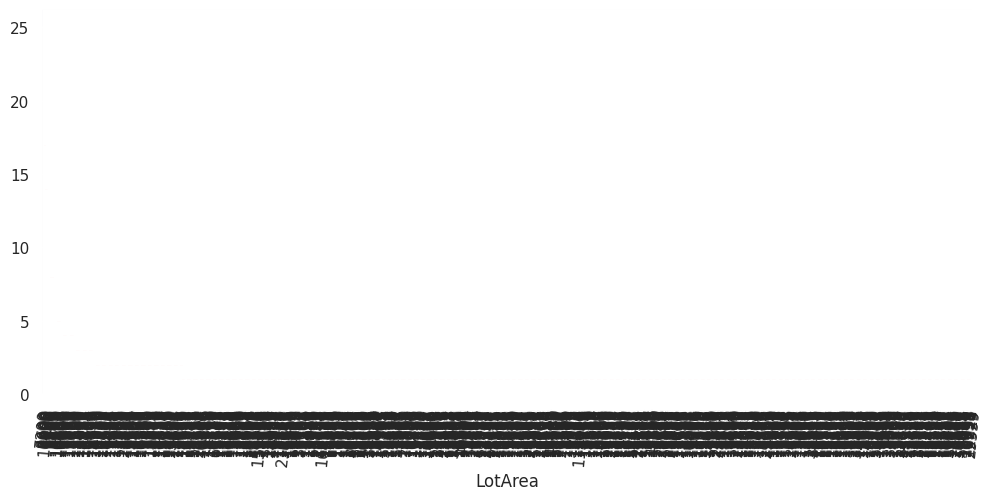

In [ ]:
plt.figure(figsize=(12,5))
House_data['LotArea'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

(array([0, 1]), [Text(0, 0, 'Pave'), Text(1, 0, 'Grvl')])

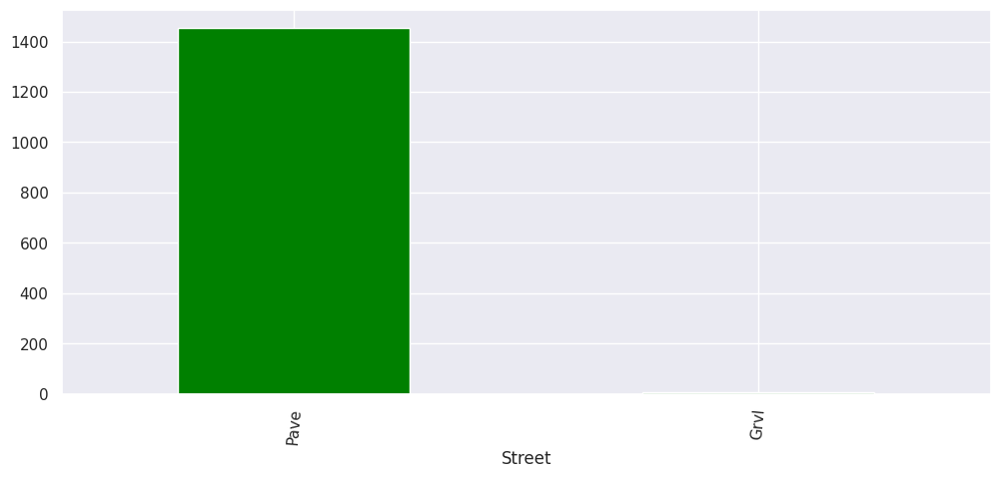

In [ ]:
plt.figure(figsize=(12,5))
House_data['Street'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

(array([0, 1]), [Text(0, 0, 'Grvl'), Text(1, 0, 'Pave')])

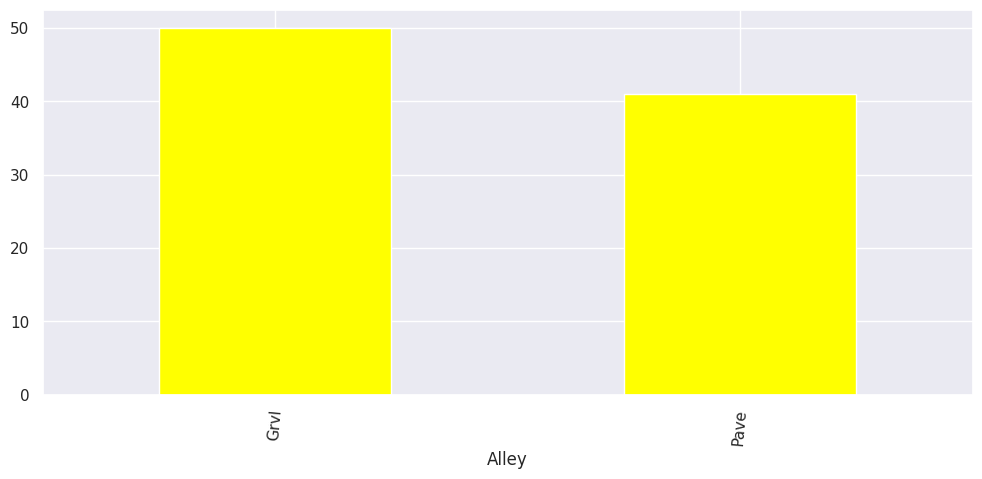

In [ ]:
plt.figure(figsize=(12,5))
House_data['Alley'].value_counts().plot(kind='bar',color ='yellow')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Reg'), Text(1, 0, 'IR1'), Text(2, 0, 'IR2'), Text(3, 0, 'IR3')])

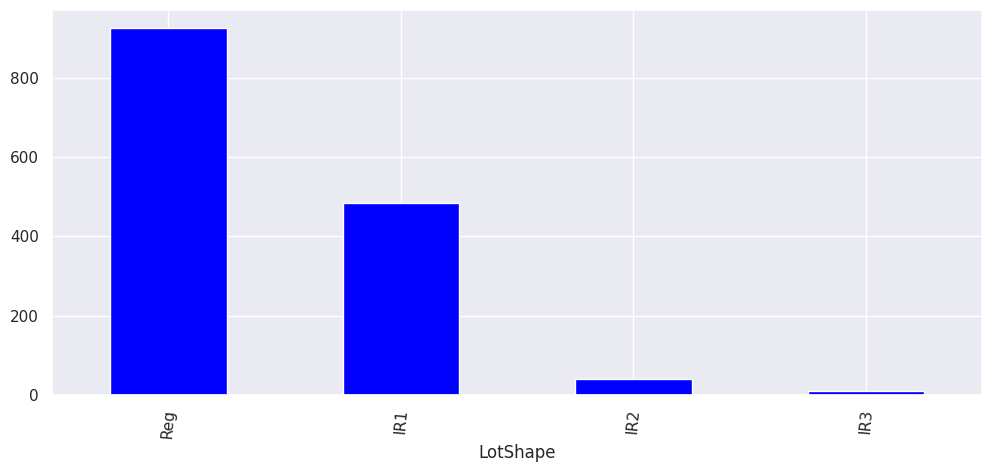

In [ ]:
plt.figure(figsize=(12,5))
House_data['LotShape'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

(array([0, 1]), [Text(0, 0, 'AllPub'), Text(1, 0, 'NoSeWa')])

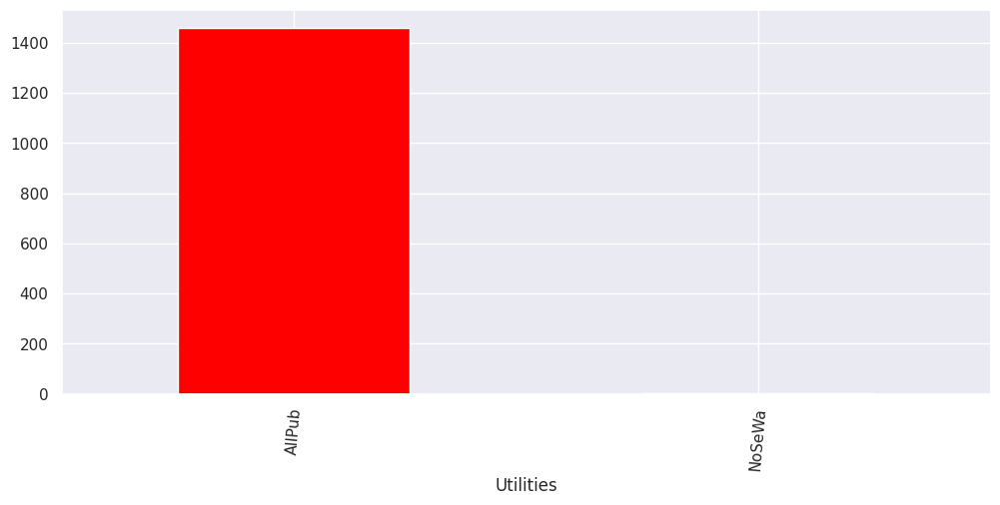

In [ ]:
plt.figure(figsize=(12,5))
House_data['Utilities'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Inside'),
  Text(1, 0, 'Corner'),
  Text(2, 0, 'CulDSac'),
  Text(3, 0, 'FR2'),
  Text(4, 0, 'FR3')])

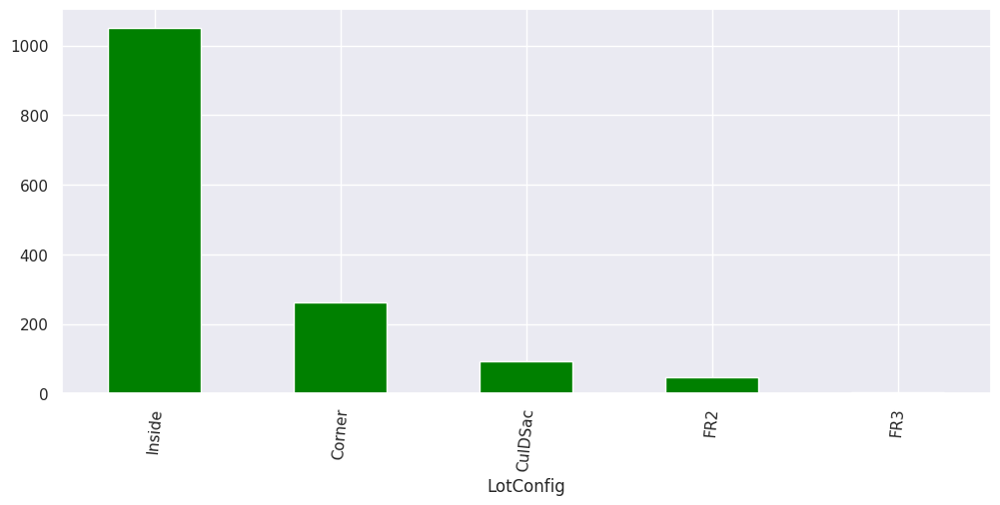

In [ ]:
plt.figure(figsize=(12,5))
House_data['LotConfig'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

(array([0, 1, 2]), [Text(0, 0, 'Gtl'), Text(1, 0, 'Mod'), Text(2, 0, 'Sev')])

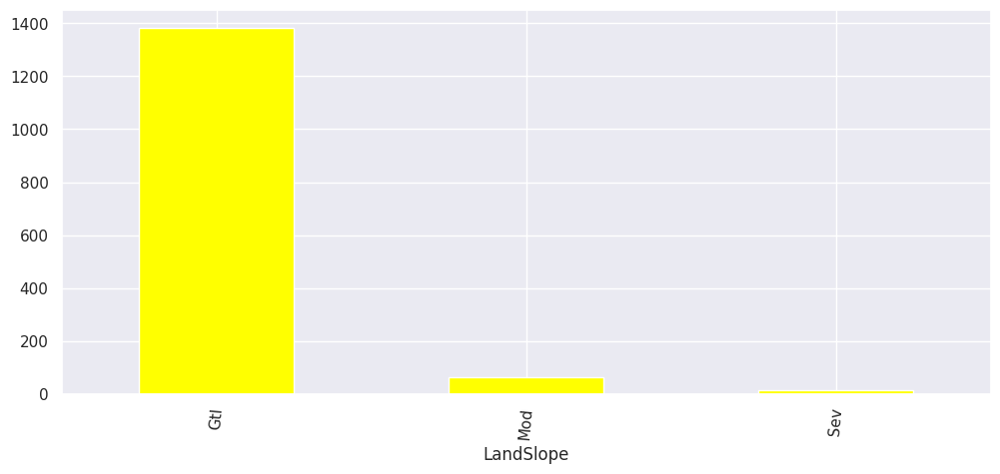

In [ ]:
plt.figure(figsize=(12,5))
House_data['LandSlope'].value_counts().plot(kind='bar',color ='yellow')
plt.xticks(rotation = 85)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25]),
 [Text(0, 0, 'NAmes'),
  Text(1, 0, 'CollgCr'),
  Text(2, 0, 'OldTown'),
  Text(3, 0, 'Edwards'),
  Text(4, 0, 'Somerst'),
  Text(5, 0, 'Gilbert'),
  Text(6, 0, 'NridgHt'),
  Text(7, 0, 'Sawyer'),
  Text(8, 0, 'NWAmes'),
  Text(9, 0, 'SawyerW'),
  Text(10, 0, 'BrkSide'),
  Text(11, 0, 'Crawfor'),
  Text(12, 0, 'Mitchel'),
  Text(13, 0, 'NoRidge'),
  Text(14, 0, 'Timber'),
  Text(15, 0, 'IDOTRR'),
  Text(16, 0, 'ClearCr'),
  Text(17, 0, 'SWISU'),
  Text(18, 0, 'StoneBr'),
  Text(19, 0, 'MeadowV'),
  Text(20, 0, 'Blmngtn'),
  Text(21, 0, 'BrDale'),
  Text(22, 0, 'Veenker'),
  Text(23, 0, 'NPkVill'),
  Text(24, 0, 'Blueste'),
  Text(25, 0, 'stoneBr')])

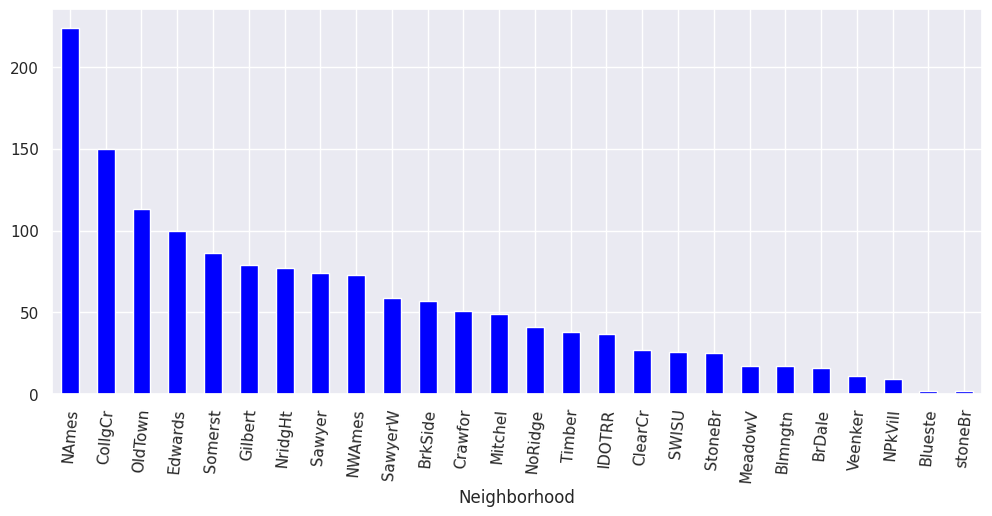

In [ ]:
plt.figure(figsize=(12,5))
House_data['Neighborhood'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Norm'),
  Text(1, 0, 'Feedr'),
  Text(2, 0, 'Artery'),
  Text(3, 0, 'RRAn'),
  Text(4, 0, 'PosN'),
  Text(5, 0, 'RRAe'),
  Text(6, 0, 'PosA'),
  Text(7, 0, 'RRNn'),
  Text(8, 0, 'RRNe')])

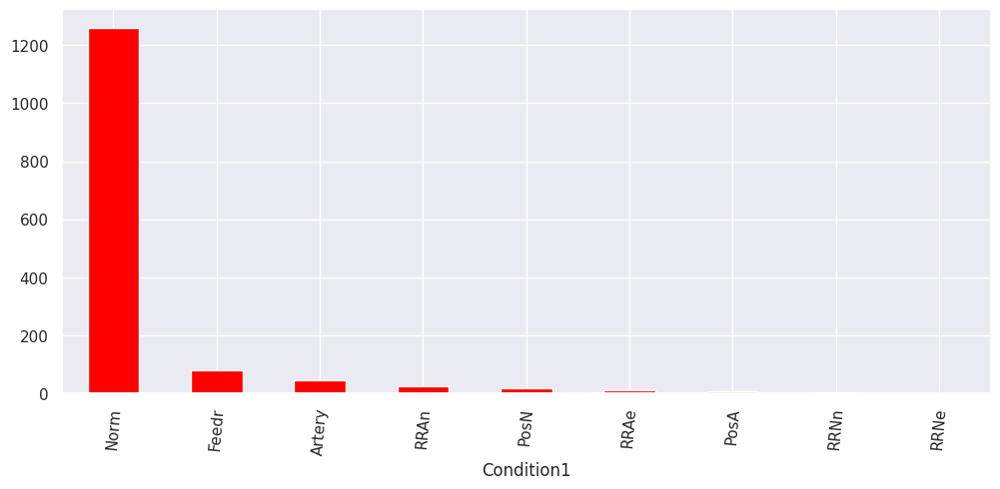

In [ ]:
plt.figure(figsize=(12,5))
House_data['Condition1'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Norm'),
  Text(1, 0, 'Feedr'),
  Text(2, 0, 'Artery'),
  Text(3, 0, 'RRNn'),
  Text(4, 0, 'PosN'),
  Text(5, 0, 'PosA'),
  Text(6, 0, 'RRAn'),
  Text(7, 0, 'RRAe')])

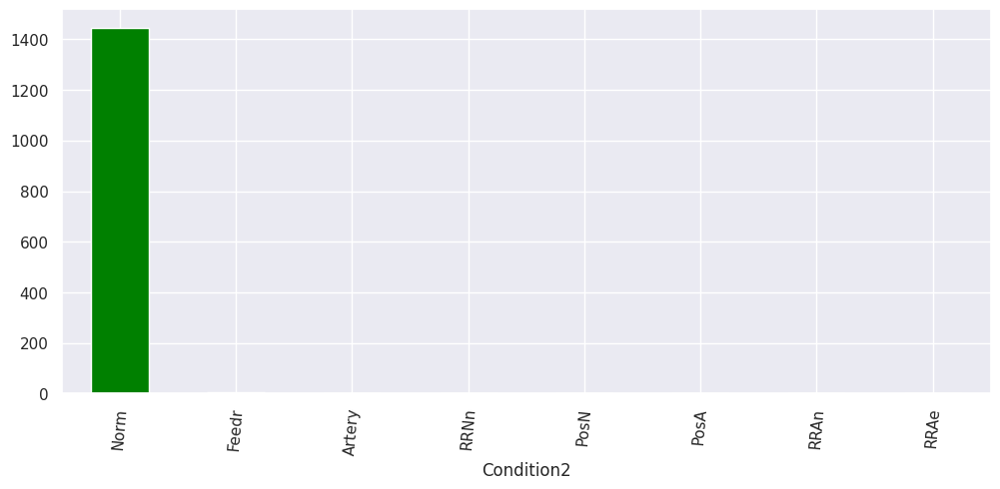

In [ ]:
plt.figure(figsize=(12,5))
House_data['Condition2'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '1Fam'),
  Text(1, 0, 'TwnhsE'),
  Text(2, 0, 'Duplex'),
  Text(3, 0, 'Twnhs'),
  Text(4, 0, '2fmCon')])

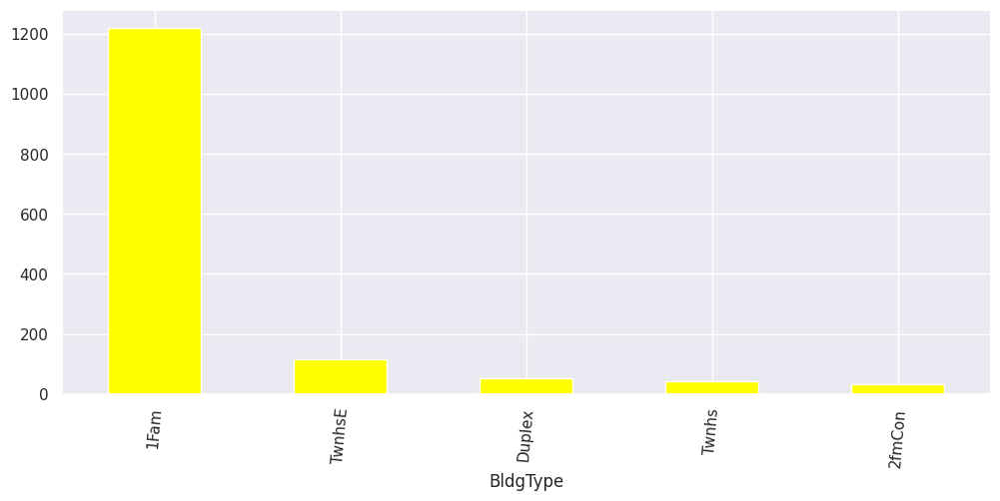

In [ ]:
plt.figure(figsize=(12,5))
House_data['BldgType'].value_counts().plot(kind='bar',color ='yellow')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '1Story'),
  Text(1, 0, '2Story'),
  Text(2, 0, '1.5Fin'),
  Text(3, 0, 'SLvl'),
  Text(4, 0, 'SFoyer'),
  Text(5, 0, '1.5Unf'),
  Text(6, 0, '2.5Unf'),
  Text(7, 0, '2.5Fin')])

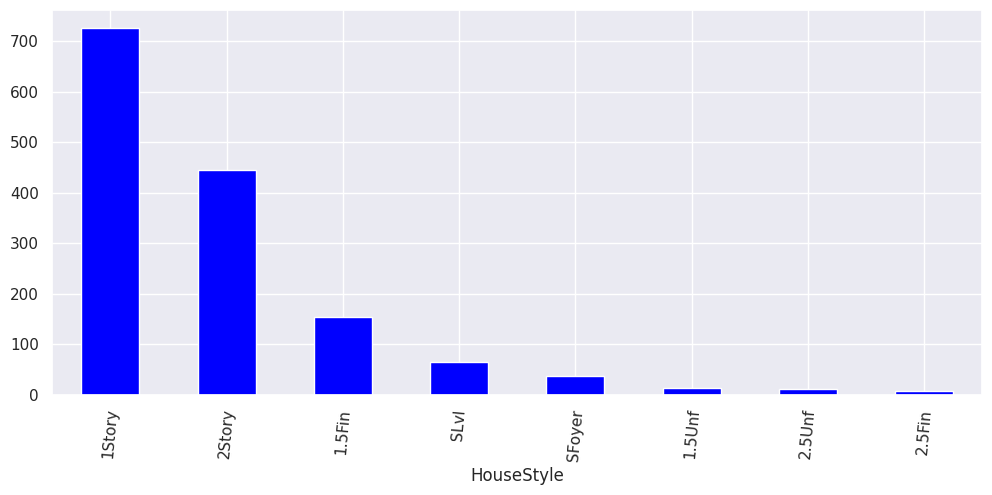

In [ ]:
plt.figure(figsize=(12,5))
House_data['HouseStyle'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '5'),
  Text(1, 0, '6'),
  Text(2, 0, '7'),
  Text(3, 0, '8'),
  Text(4, 0, '4'),
  Text(5, 0, '9'),
  Text(6, 0, '3'),
  Text(7, 0, '10'),
  Text(8, 0, '2'),
  Text(9, 0, '1')])

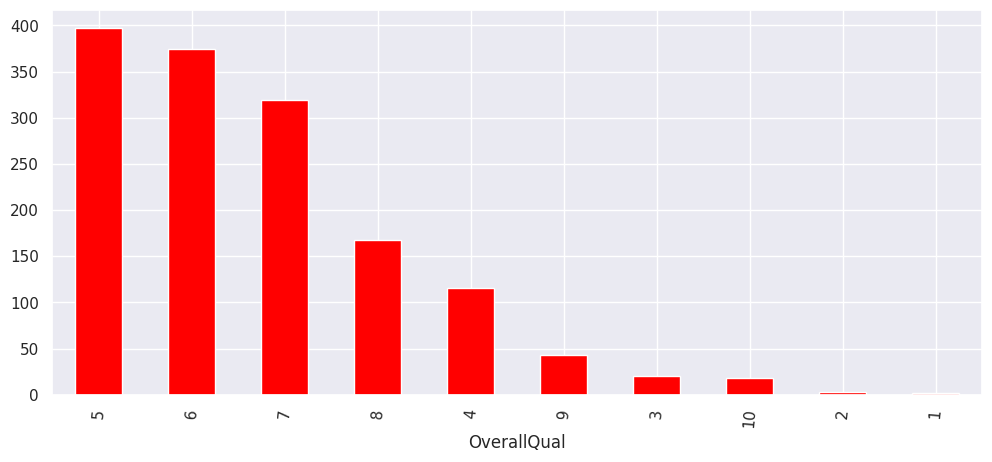

In [ ]:
plt.figure(figsize=(12,5))
House_data['OverallQual'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

(array([0, 1]), [Text(0, 0, 'Y'), Text(1, 0, 'N')])

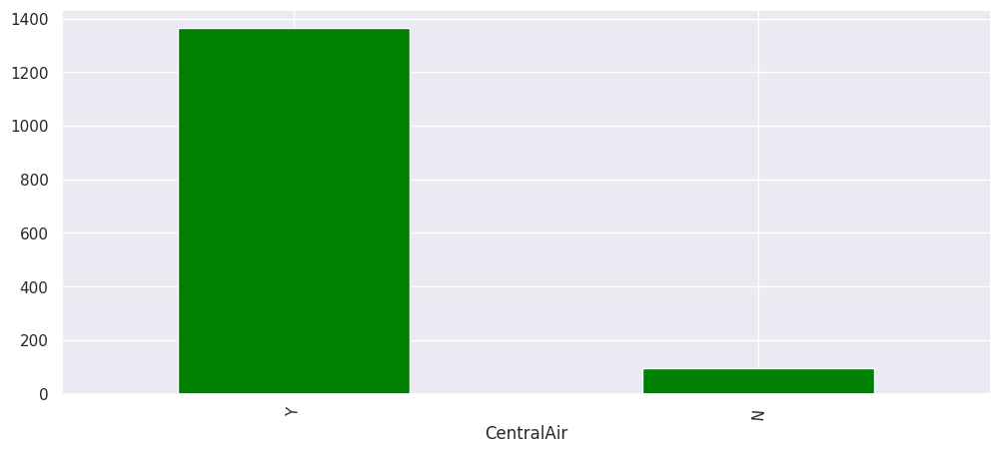

In [ ]:
plt.figure(figsize=(12,5))
House_data['CentralAir'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '3'),
  Text(1, 0, '2'),
  Text(2, 0, '4'),
  Text(3, 0, '1'),
  Text(4, 0, '5'),
  Text(5, 0, '6'),
  Text(6, 0, '0'),
  Text(7, 0, '8')])

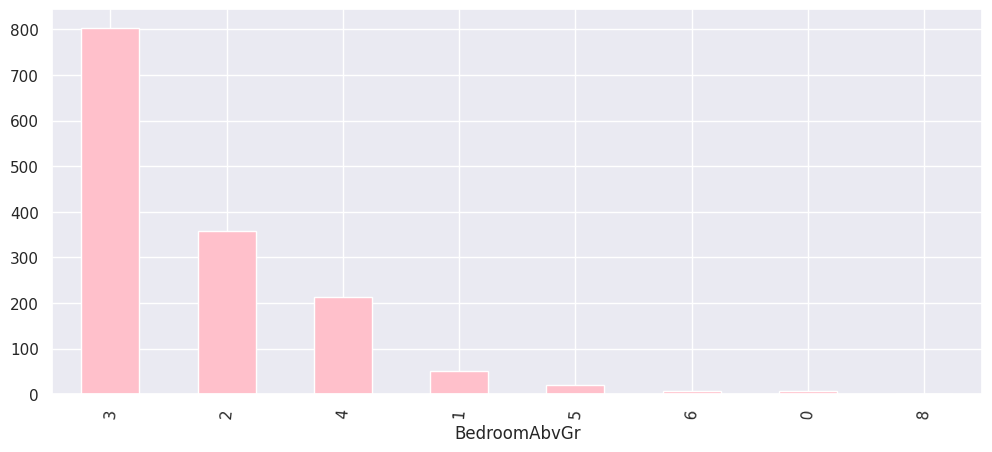

In [ ]:
plt.figure(figsize=(12,5))
House_data['BedroomAbvGr'].value_counts().plot(kind='bar',color ='pink')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3]),
 [Text(0, 0, '1'), Text(1, 0, '2'), Text(2, 0, '3'), Text(3, 0, '0')])

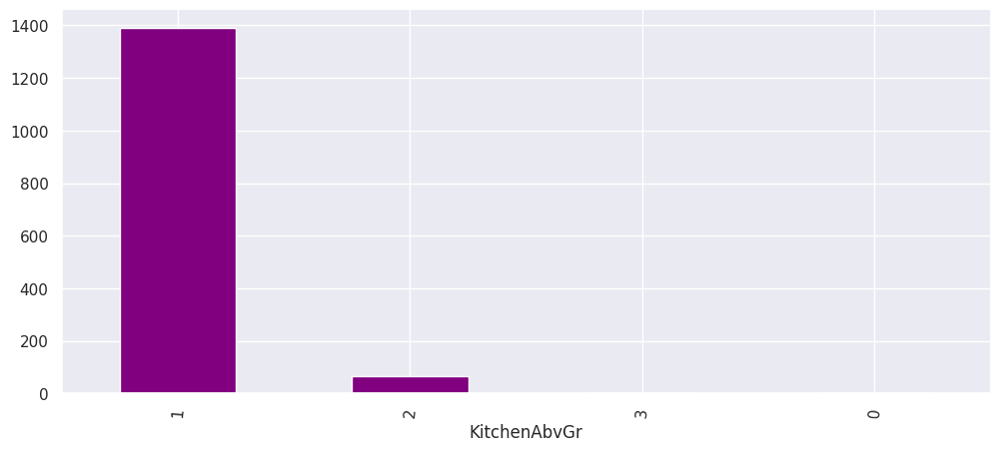

In [ ]:
plt.figure(figsize=(12,5))
House_data['KitchenAbvGr'].value_counts().plot(kind='bar',color ='purple')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '0'),
  Text(1, 0, '512'),
  Text(2, 0, '648'),
  Text(3, 0, '576'),
  Text(4, 0, '555'),
  Text(5, 0, '480'),
  Text(6, 0, '519'),
  Text(7, 0, '738')])

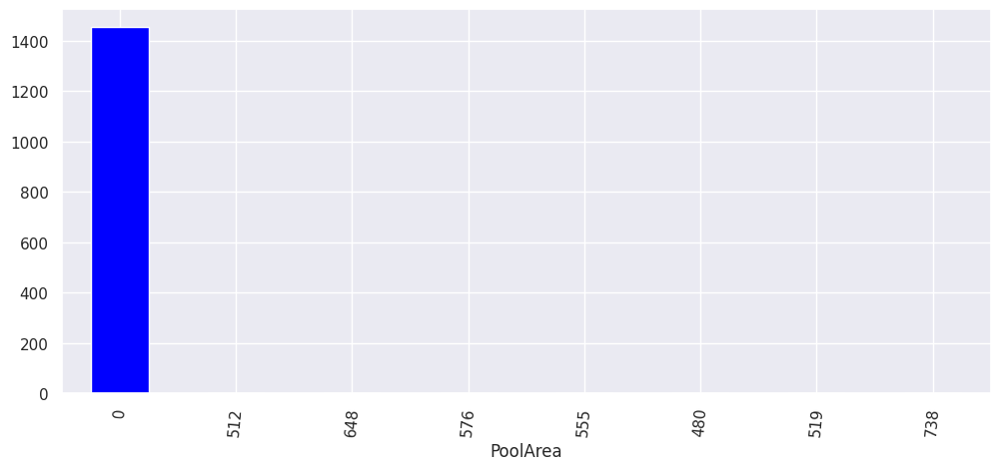

In [ ]:
plt.figure(figsize=(12,5))
House_data['PoolArea'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Jun'),
  Text(1, 0, 'Jul'),
  Text(2, 0, 'May'),
  Text(3, 0, 'Apr'),
  Text(4, 0, 'Aug'),
  Text(5, 0, 'Mar'),
  Text(6, 0, 'Oct'),
  Text(7, 0, 'Nov'),
  Text(8, 0, 'Sep'),
  Text(9, 0, 'Dec'),
  Text(10, 0, 'Jan'),
  Text(11, 0, 'Feb')])

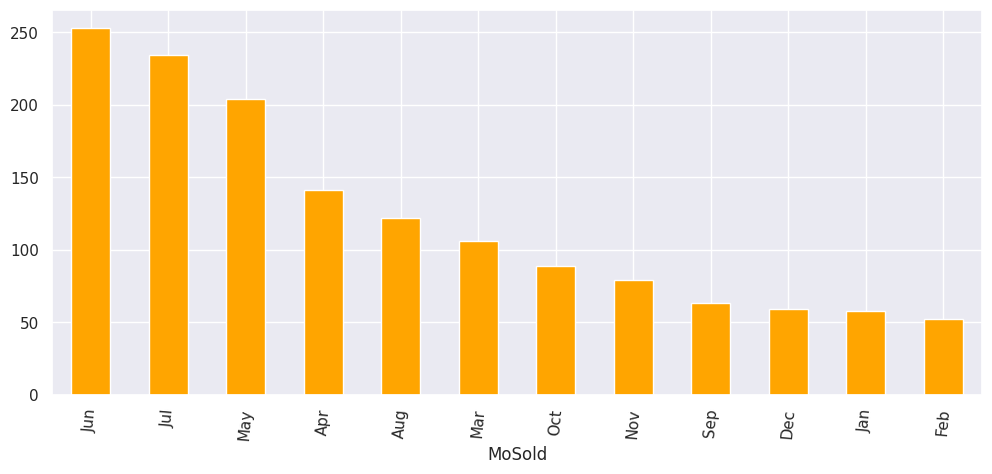

In [ ]:
plt.figure(figsize=(12,5))
House_data['MoSold'].value_counts().plot(kind='bar',color ='orange')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '2009'),
  Text(1, 0, '2007'),
  Text(2, 0, '2006'),
  Text(3, 0, '2008'),
  Text(4, 0, '2010')])

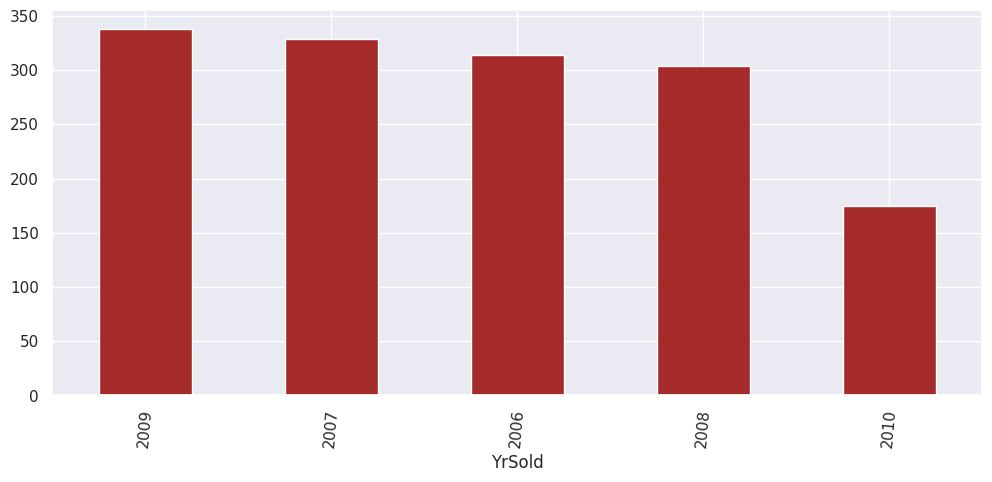

In [ ]:
plt.figure(figsize=(12,5))
House_data['YrSold'].value_counts().plot(kind='bar',color ='brown')
plt.xticks(rotation = 85)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Normal'),
  Text(1, 0, 'Partial'),
  Text(2, 0, 'Abnorml'),
  Text(3, 0, 'Family'),
  Text(4, 0, 'Alloca'),
  Text(5, 0, 'AdjLand')])

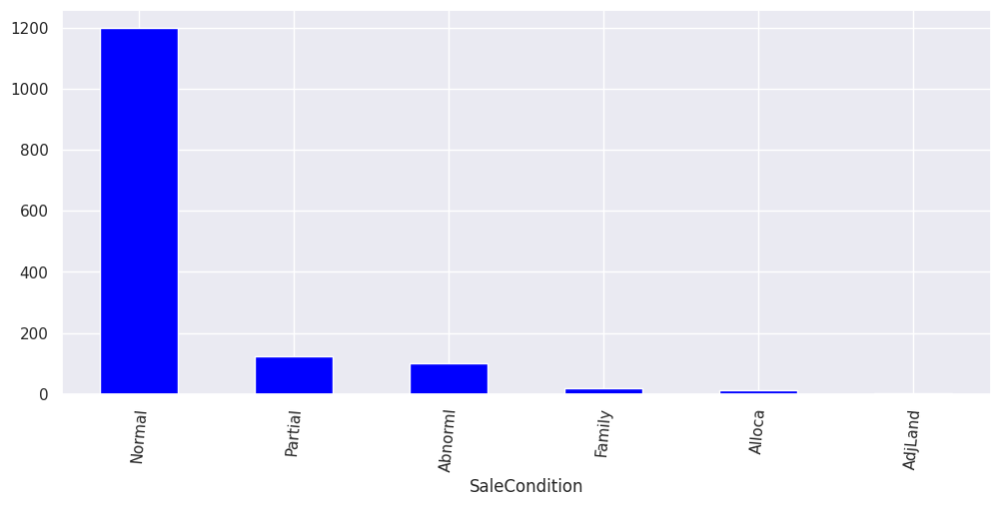

In [ ]:
plt.figure(figsize=(12,5))
House_data['SaleCondition'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

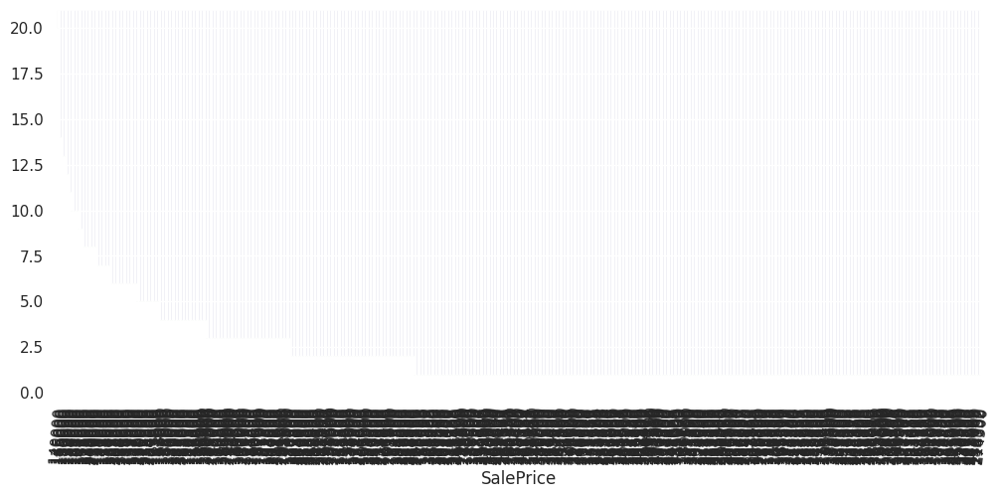

In [ ]:
plt.figure(figsize=(12,5))
House_data['SalePrice'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


## RL = Residential Low-Density
## RM = Residential Medium Density
## FV = Floating Village Residential
## RH = Residential High-Density
## C = Commercial

In [ ]:
House_data['MSZoning'] = House_data['MSZoning'].replace({'RL':'Residential Low-Density'})
House_data['MSZoning'] = House_data['MSZoning'].replace({'RM':'Residential Medium Density'})
House_data['MSZoning'] = House_data['MSZoning'].replace({'FV':'Floating Village Residential'})
House_data['MSZoning'] = House_data['MSZoning'].replace({'RH':'Residential High-Density'})
House_data['MSZoning'] = House_data['MSZoning'].replace({'C':'Commercial'})


In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,Residential Low-Density,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,Residential Low-Density,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


## RENAME OF THE COLUMN MSZoning TO GENERAL ZONE CLASSIFICATION

In [ ]:
House_data.rename(columns={'MSZoning':'General Zone Classification'}, inplace = True)

In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,General Zone Classification,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,Residential Low-Density,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,Residential Low-Density,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


## UNIQUE VALUES

In [ ]:
House_data['General Zone Classification'].nunique()

5

In [ ]:
House_data['General Zone Classification'].unique()

array(['Residential Low-Density', 'Residential Medium Density', 'C (all)',
       'Floating Village Residential', 'Residential High-Density'],
      dtype=object)

In [ ]:
House_data['General Zone Classification'].value_counts()

General Zone Classification
Residential Low-Density         1151
Residential Medium Density       218
Floating Village Residential      65
Residential High-Density          16
C (all)                           10
Name: count, dtype: int64

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Residential Low-Density'),
  Text(1, 0, 'Residential Medium Density'),
  Text(2, 0, 'Floating Village Residential'),
  Text(3, 0, 'Residential High-Density'),
  Text(4, 0, 'C (all)')])

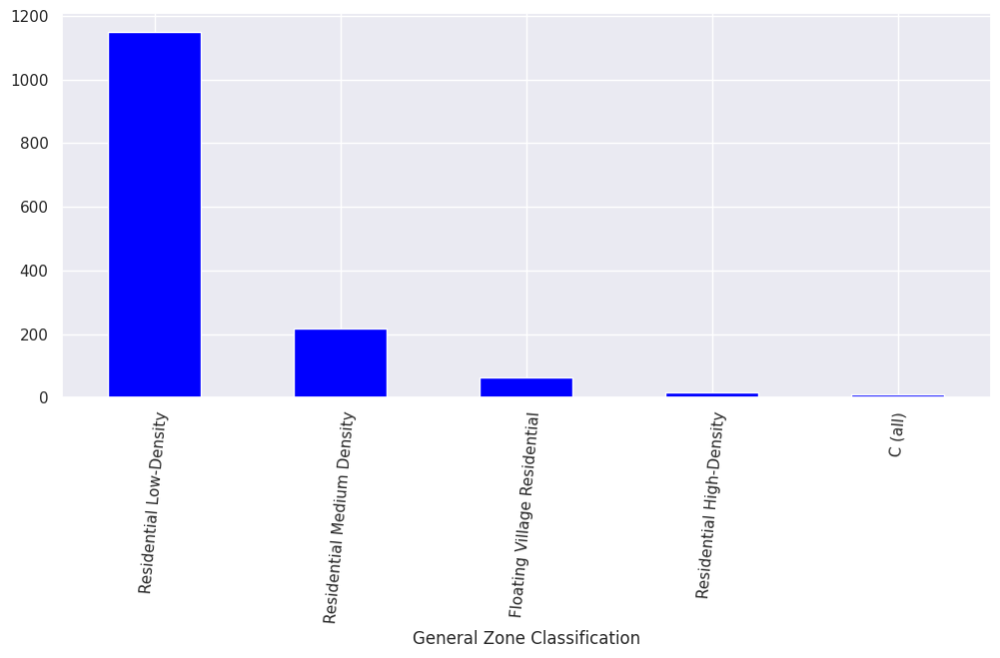

In [ ]:
plt.figure(figsize=(12,5))
House_data['General Zone Classification'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

## RENAME OF THE COLUNMS

In [ ]:
House_data.rename(columns={'LotFrontage':'Linear Feet of Street'}, inplace = True)

In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,Residential Low-Density,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,Residential Low-Density,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data['Linear Feet of Street'].unique()

array([ 65,  80,  68,  60,  84,  85,  75,   0,  51,  50,  70,  91,  72,
        66, 101,  57,  44, 110,  98,  47, 108, 112,  74, 115,  61,  48,
        33,  52, 100,  24,  89,  63,  76,  81,  95,  69,  21,  32,  78,
       121, 122,  40, 105,  73,  77,  64,  94,  34,  90,  55,  88,  82,
        71, 120, 107,  92, 134,  62,  86, 141,  97,  54,  41,  79, 174,
        99,  67,  83,  43, 103,  93,  30, 129, 140,  35,  37, 118,  87,
       116, 150, 111,  49,  96,  59,  36,  56, 102,  58,  38, 109, 130,
        53, 137,  45, 106, 104,  42,  39, 144, 114, 128, 149, 313, 168,
       182, 138, 160, 152, 124, 153,  46])

In [ ]:
House_data['Linear Feet of Street'].nunique()

111

In [ ]:
House_data['Linear Feet of Street'].value_counts()

Linear Feet of Street
0      259
60     143
70      70
80      69
50      57
      ... 
150      1
168      1
38       1
137      1
46       1
Name: count, Length: 111, dtype: int64

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110]),
 [Text(0, 0, '0'),
  Text(1, 0, '60'),
  Text(2, 0, '70'),
  Text(3, 0, '80'),
  Text(4, 0, '50'),
  Text(5, 0, '75'),
  Text(6, 0, '65'),
  Text(7, 0, '85'),
  Text(8, 0, '78'),
  Text(9, 0, '90'),
  Text(10, 0, '21'),
  Text(11, 0, '24'),
  Text(12, 0, '68'),
  Text(13, 0, '64'),
  Text(14, 0, '73'),
  Text(15, 0, '63'),
  Text(16, 0, '55'),
  Text(17, 0, '72'),
  Te

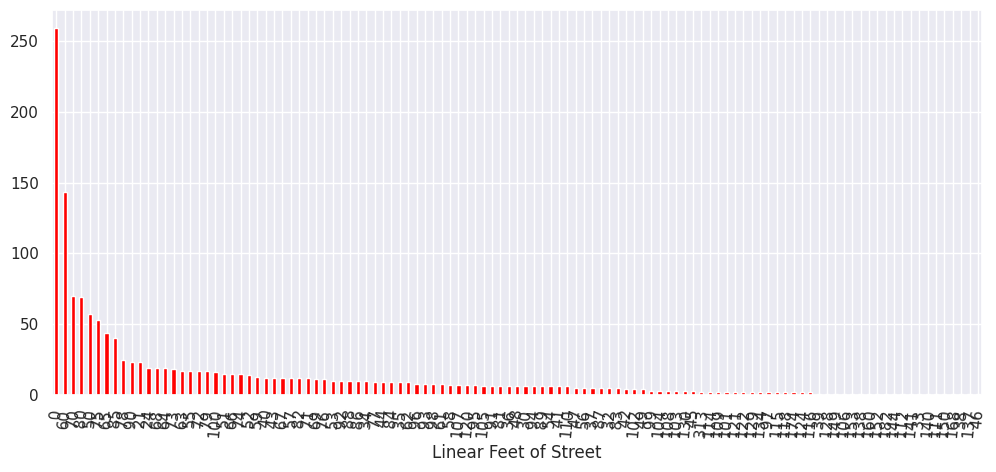

In [ ]:
plt.figure(figsize=(12,5))
House_data['Linear Feet of Street'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

In [ ]:
House_data.rename(columns={'LotArea':'Plot size in Square feet'}, inplace = True)

In [ ]:
House_data['Plot size in Square feet'].nunique()

1073

In [ ]:
House_data['Plot size in Square feet'].unique()

array([ 8450,  9600, 11250, ..., 17217, 13175,  9717])

In [ ]:
House_data['Plot size in Square feet'].value_counts()

Plot size in Square feet
7200     25
9600     24
6000     17
10800    14
8400     14
         ..
1953      1
9735      1
8212      1
12925     1
25339     1
Name: count, Length: 1073, dtype: int64

(array([   0,    1,    2, ..., 1070, 1071, 1072]),
 [Text(0, 0, '7200'),
  Text(1, 0, '9600'),
  Text(2, 0, '6000'),
  Text(3, 0, '10800'),
  Text(4, 0, '8400'),
  Text(5, 0, '9000'),
  Text(6, 0, '1680'),
  Text(7, 0, '7500'),
  Text(8, 0, '6240'),
  Text(9, 0, '6120'),
  Text(10, 0, '9100'),
  Text(11, 0, '8125'),
  Text(12, 0, '3182'),
  Text(13, 0, '7800'),
  Text(14, 0, '8450'),
  Text(15, 0, '4500'),
  Text(16, 0, '9750'),
  Text(17, 0, '10400'),
  Text(18, 0, '10000'),
  Text(19, 0, '5400'),
  Text(20, 0, '4435'),
  Text(21, 0, '10140'),
  Text(22, 0, '5000'),
  Text(23, 0, '10625'),
  Text(24, 0, '8520'),
  Text(25, 0, '9900'),
  Text(26, 0, '7000'),
  Text(27, 0, '8544'),
  Text(28, 0, '8500'),
  Text(29, 0, '8640'),
  Text(30, 0, '9375'),
  Text(31, 0, '11250'),
  Text(32, 0, '6600'),
  Text(33, 0, '7018'),
  Text(34, 0, '11700'),
  Text(35, 0, '8750'),
  Text(36, 0, '8800'),
  Text(37, 0, '13125'),
  Text(38, 0, '9200'),
  Text(39, 0, '11500'),
  Text(40, 0, '2280'),
  Text(

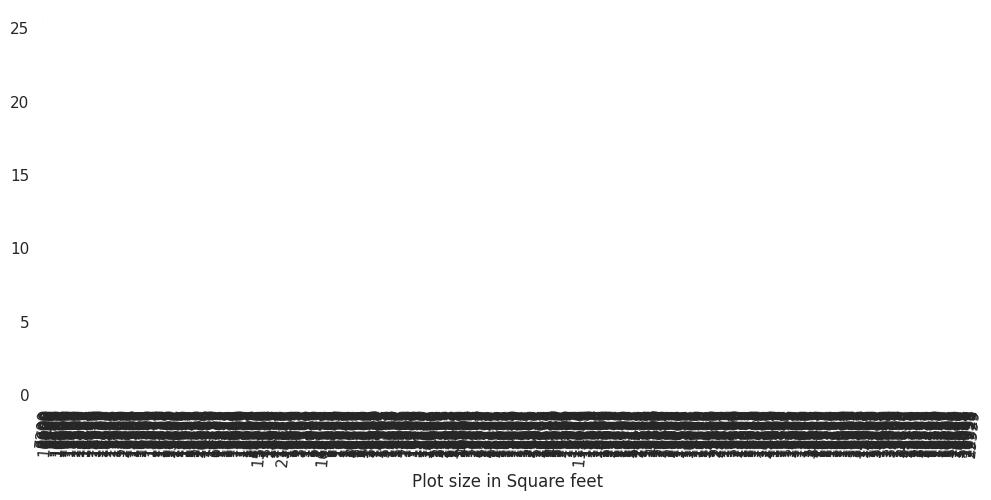

In [ ]:
plt.figure(figsize=(12,5))
House_data['Plot size in Square feet'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

In [ ]:
House_data.head(4)

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000


## Street : Type of road access to property

Grvl = Gravel
Pave = Paved

In [ ]:
House_data['Street'] = House_data['Street'].replace({'Grvl': 'Gravel','Pave':'Paved'})

## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Street'].nunique()

2

In [ ]:
House_data['Street'].unique()

array(['Paved', 'Gravel'], dtype=object)

In [ ]:
House_data['Street'].value_counts()

Street
Paved     1454
Gravel       6
Name: count, dtype: int64

(array([0, 1]), [Text(0, 0, 'Paved'), Text(1, 0, 'Gravel')])

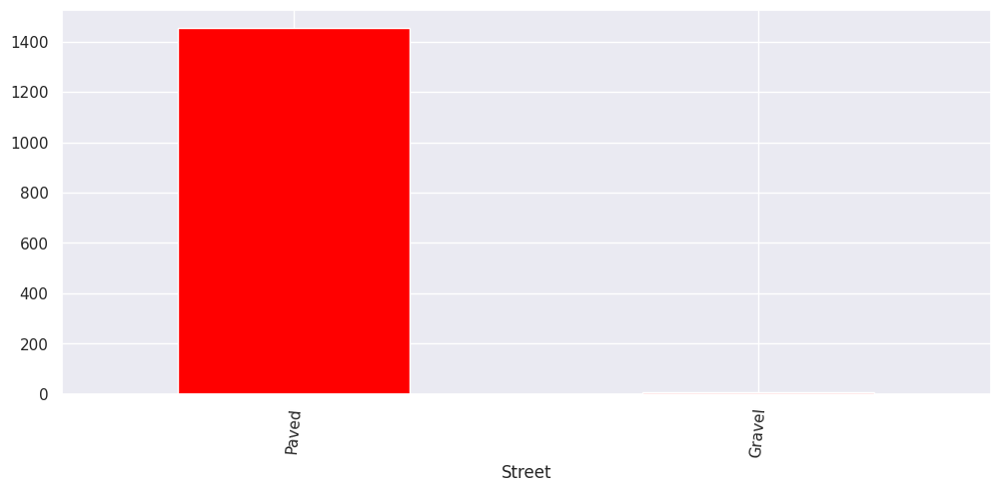

In [ ]:
plt.figure(figsize=(12,5))
House_data['Street'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

In [ ]:
House_data.rename(columns={'Street':'Type of road'}, inplace = True)

In [ ]:
House_data.columns

Index(['Unnamed: 0', 'Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', '

In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,Residential Low-Density,62,7917,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,85,13175,Paved,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,Residential Low-Density,66,9042,Paved,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,68,9717,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data[0:10] # Data Slicing

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
5,5,1-1/2 STORY FINISHED ALL AGE,Residential Low-Density,85,14115,Paved,NaN,IR1,Lvl,AllPub,...,0,No,MnPrv,Shed,700,Oct,2009,WD,Normal,143000
6,6,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,75,10084,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,307000
7,7,2-STORY 1946 $ NEWER,Residential Low-Density,0,10382,Paved,NaN,IR1,Lvl,AllPub,...,0,No,No,Shed,350,Nov,2009,WD,Normal,200000
8,8,1-1/2 STORY FINISHED ALL AGE,Residential Medium Density,51,6120,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2008,WD,Abnorml,129900
9,9,SC190,Residential Low-Density,50,7420,Paved,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Jan,2008,WD,Normal,118000


## RENAME OF THE COLUMNS

## Alley = Type of the Alley
## Grvl = Gravel
## Pave = Paved
## NA = No alley access

In [ ]:
House_data['Alley'] = House_data['Alley'].replace({'Grvl':'Gravel','Pave':'Paved'})

In [ ]:
House_data['Alley'] = House_data['Alley'].fillna('No Alley Access')

In [ ]:
House_data.rename(columns={'Alley':'Type of Alley'}, inplace = True)

## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Type of Alley'].nunique()

3

In [ ]:
House_data['Type of Alley'].unique()

array(['No Alley Access', 'Gravel', 'Paved'], dtype=object)

In [ ]:
House_data['Type of Alley'].value_counts()

Type of Alley
No Alley Access    1369
Gravel               50
Paved                41
Name: count, dtype: int64

In [ ]:
House_data[0:4] # Data Slicing

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000


(array([0, 1, 2]),
 [Text(0, 0, 'No Alley Access'), Text(1, 0, 'Gravel'), Text(2, 0, 'Paved')])

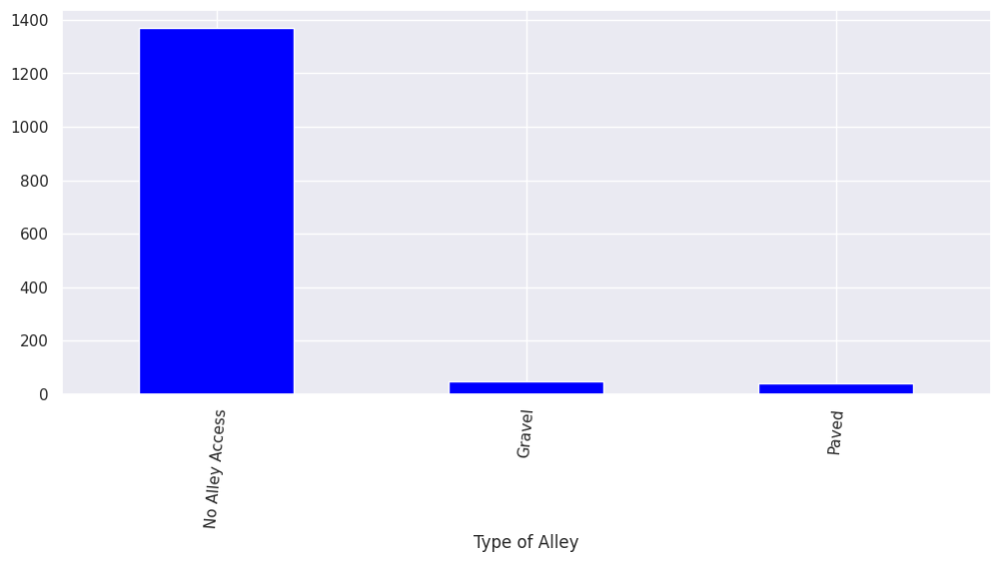

In [ ]:
plt.figure(figsize=(12,5))
House_data['Type of Alley'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

In [ ]:
House_data.columns

Index(['Unnamed: 0', 'Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Type of Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFi

In [ ]:
House_data.drop(['Type of Alley'],axis = 1) # Drop the column

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,Reg,Lvl,AllPub,FR2,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,IR1,Lvl,AllPub,Inside,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,IR1,Lvl,AllPub,Corner,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,IR1,Lvl,AllPub,FR2,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,Residential Low-Density,62,7917,Paved,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,85,13175,Paved,Reg,Lvl,AllPub,Inside,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,Residential Low-Density,66,9042,Paved,Reg,Lvl,AllPub,Inside,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,68,9717,Paved,Reg,Lvl,AllPub,Inside,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data[0:6] # Data Slicing

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
5,5,1-1/2 STORY FINISHED ALL AGE,Residential Low-Density,85,14115,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,MnPrv,Shed,700,Oct,2009,WD,Normal,143000


In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,Residential Low-Density,62,7917,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,85,13175,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,Residential Low-Density,66,9042,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,68,9717,Paved,No Alley Access,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


##RENAME OF THE COLUMNS

## LotShape = General shape of property
## Reg = Regular
## IR1 = Slightly irregular
## IR2 = Moderately Irrergular
## IR3 = Irrergular

In [ ]:
House_data.rename(columns={'LotShape':'General shape of property'}, inplace = True)

In [ ]:
House_data['General shape of property'] = House_data['General shape of property'].replace({'Reg':'Regular','IR1':'Slightly irregular','IR2':'Moderately Irrergular','IR3':'Irrergular'})

## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['General shape of property'].nunique()

4

In [ ]:
House_data['General shape of property'].unique()

array(['Regular', 'Slightly irregular', 'Moderately Irrergular',
       'Irrergular'], dtype=object)

In [ ]:
House_data['General shape of property'].value_counts()

General shape of property
Regular                  925
Slightly irregular       484
Moderately Irrergular     41
Irrergular                10
Name: count, dtype: int64

In [ ]:
House_data[0:3] # Data Slicing

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500


(array([0, 1, 2, 3]),
 [Text(0, 0, 'Regular'),
  Text(1, 0, 'Slightly irregular'),
  Text(2, 0, 'Moderately Irrergular'),
  Text(3, 0, 'Irrergular')])

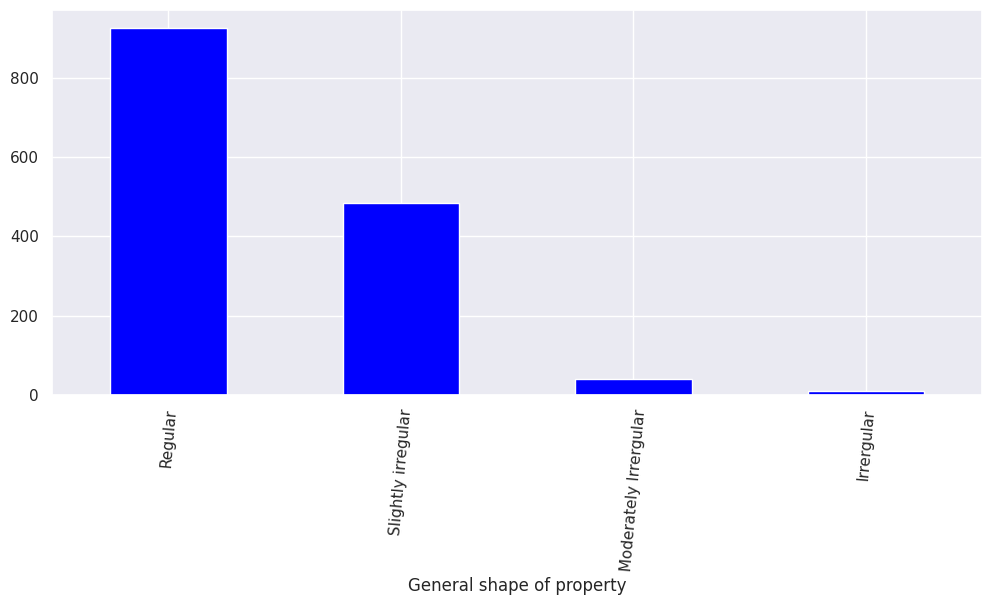

In [ ]:
plt.figure(figsize=(12,5))
House_data['General shape of property'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

## RENAME OF THE COLUMNS

## LandContour = Flatness of the property
## Lvl = Near Flat/Level
## Bnk = Banked Quick and significant rise from street grade to building
## HLS = Hillside Significant slop from side to side
## Low = Depression

In [ ]:
House_data.rename(columns={'LandContour':'Flatness of the property'}, inplace = True)

In [ ]:
House_data['Flatness of the property'] = House_data['Flatness of the property'].replace({'Lvl':'Near Flat/Level','Bnk':'Banked Quick and significant rise from street grade to building','HLS':'Hillside Significant slop from side to side','Low':'Depression'})

## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Flatness of the property'].nunique()

4

In [ ]:
House_data['Flatness of the property'].unique()

array(['Near Flat/Level',
       'Banked Quick and significant rise from street grade to building',
       'Depression', 'Hillside Significant slop from side to side'],
      dtype=object)

In [ ]:
House_data['Flatness of the property'].value_counts()

Flatness of the property
Near Flat/Level                                                    1311
Banked Quick and significant rise from street grade to building      63
Hillside Significant slop from side to side                          50
Depression                                                           36
Name: count, dtype: int64

In [ ]:
House_data[0:15]

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,Slightly irregular,Near Flat/Level,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
5,5,1-1/2 STORY FINISHED ALL AGE,Residential Low-Density,85,14115,Paved,No Alley Access,Slightly irregular,Near Flat/Level,AllPub,...,0,No,MnPrv,Shed,700,Oct,2009,WD,Normal,143000
6,6,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,75,10084,Paved,No Alley Access,Regular,Near Flat/Level,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,307000
7,7,2-STORY 1946 $ NEWER,Residential Low-Density,0,10382,Paved,No Alley Access,Slightly irregular,Near Flat/Level,AllPub,...,0,No,No,Shed,350,Nov,2009,WD,Normal,200000
8,8,1-1/2 STORY FINISHED ALL AGE,Residential Medium Density,51,6120,Paved,No Alley Access,Regular,Near Flat/Level,AllPub,...,0,No,No,No,0,Apr,2008,WD,Abnorml,129900
9,9,SC190,Residential Low-Density,50,7420,Paved,No Alley Access,Regular,Near Flat/Level,AllPub,...,0,No,No,No,0,Jan,2008,WD,Normal,118000


## RENAME OF THE COLUMNS

## Utilities = Type of Utilites available
## AllPub = All public Utilities (E,G,W,&S)
## No Sewr = Electricity,Gas, and Water (Septic Tank)
## NoSeWa = Electricity and Gas Only
## ELO = Electricity only

In [ ]:
House_data.rename(columns={'Utilities':'Type of Utilites available'}, inplace = True)

In [ ]:
House_data['Type of Utilites available'] = House_data['Type of Utilites available'].replace({'AllPub':'All public Utilities (E,G,W,&S)','No Sewr':'Electricity,Gas, and Water (Septic Tank)','NoSeWa':'Electricity and Gas Only','ELO':'Electricity only'})

In [ ]:
House_data

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,2-STORY 1946 $ NEWER,Residential Low-Density,62,7917,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,85,13175,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,2 - STORY 1945 $ ODER,Residential Low-Density,66,9042,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,68,9717,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [ ]:
House_data.columns

Index(['Unnamed: 0', 'Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Type of Alley', 'General shape of property',
       'Flatness of the property', 'Type of Utilites available', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'Firep

## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Type of Utilites available'].nunique()

2

In [ ]:
House_data['Type of Utilites available'].unique()

array(['All public Utilities (E,G,W,&S)', 'Electricity and Gas Only'],
      dtype=object)

In [ ]:
House_data['Type of Utilites available'].value_counts()

Type of Utilites available
All public Utilities (E,G,W,&S)    1459
Electricity and Gas Only              1
Name: count, dtype: int64

In [ ]:
House_data.iloc[0:3,15:]

,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,...,0,No,No,No,0,Sep,2008,WD,Normal,223500


In [ ]:
House_data.iloc[0:2,9:]

,Type of Utilites available,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,"All public Utilities (E,G,W,&S)",Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,"All public Utilities (E,G,W,&S)",FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,...,0,No,No,No,0,May,2007,WD,Normal,181500


(array([0, 1]),
 [Text(0, 0, 'All public Utilities (E,G,W,&S)'),
  Text(1, 0, 'Electricity and Gas Only')])

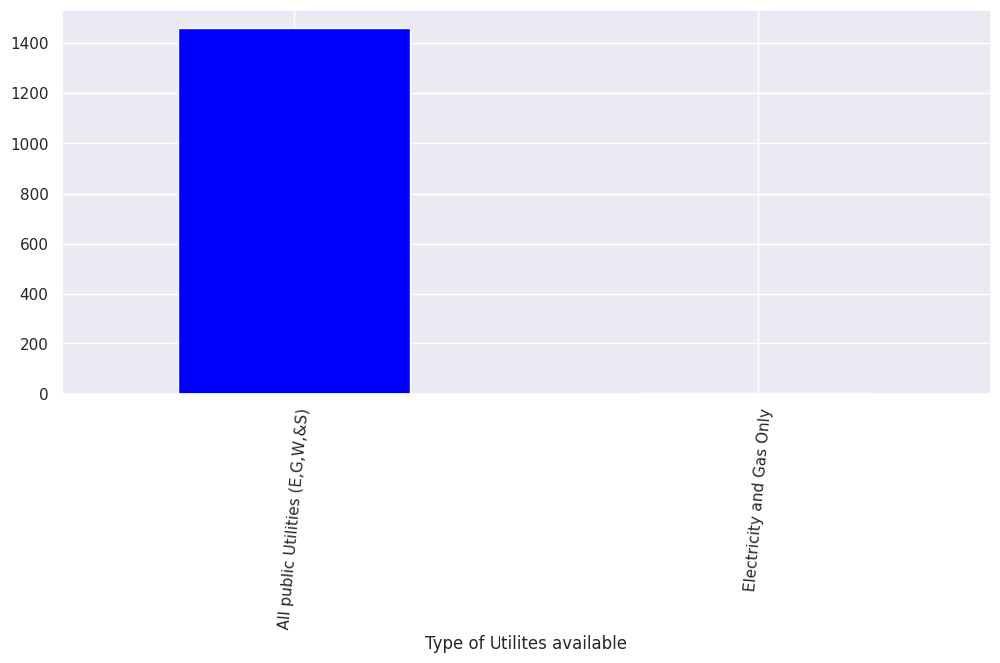

In [ ]:
plt.figure(figsize=(12,5))
House_data['Type of Utilites available'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

## RENAME OF THE COLUMNS
## LotConfig = Lot configuration
## Inside = Inside lot
## Corner = Corner lot
## CulDSac = Cul-de-sac
## FR2 = Frantage on 2 sides of the property
## FR3 = Frontage on 3 sides of the property

In [ ]:
House_data.rename(columns={'LotConfig':'Lot configuration'},inplace = True)

In [ ]:
House_data['Lot configuration'] = House_data['Lot configuration'].replace({'Inside':'Inside lot','Corner':'Corner lot','CulDSac':'Cul-de-sac','FR2':'Frantage on 2 sides of the property','FR3':'Frontage on 3 sides of the property'})

In [ ]:
House_data.columns

Index(['Unnamed: 0', 'Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Type of Alley', 'General shape of property',
       'Flatness of the property', 'Type of Utilites available',
       'Lot configuration', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces'

In [ ]:
House_data.columns[:12]

Index(['Unnamed: 0', 'Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Type of Alley', 'General shape of property',
       'Flatness of the property', 'Type of Utilites available',
       'Lot configuration', 'LandSlope'],
      dtype='object')

## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Lot configuration'].nunique()

5

In [ ]:
House_data['Lot configuration'].unique()

array(['Inside lot', 'Frantage on 2 sides of the property', 'Corner lot',
       'Cul-de-sac', 'Frontage on 3 sides of the property'], dtype=object)

In [ ]:
House_data['Lot configuration'].value_counts()

Lot configuration
Inside lot                             1052
Corner lot                              263
Cul-de-sac                               94
Frantage on 2 sides of the property      47
Frontage on 3 sides of the property       4
Name: count, dtype: int64

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Inside lot'),
  Text(1, 0, 'Corner lot'),
  Text(2, 0, 'Cul-de-sac'),
  Text(3, 0, 'Frantage on 2 sides of the property'),
  Text(4, 0, 'Frontage on 3 sides of the property')])

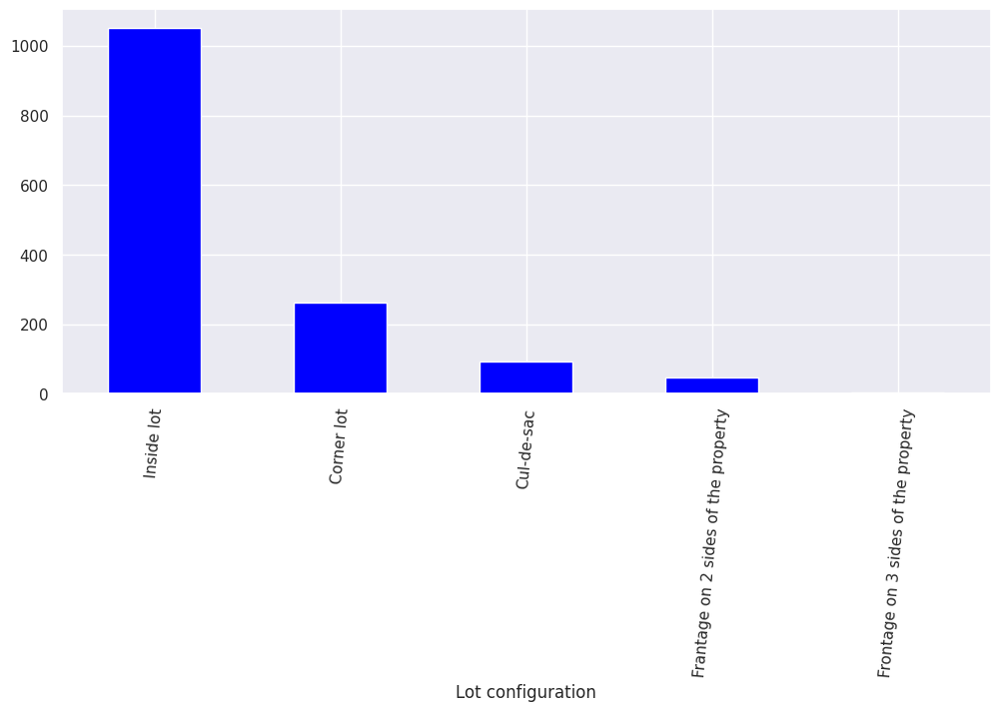

In [ ]:
plt.figure(figsize=(12,5))
House_data['Lot configuration'].value_counts().plot(kind='bar',color ='blue')
plt.xticks(rotation = 85)

## RENAME OF THE COLUMNS

## LandSlope  = Slope of the Property
## Gtl = Gentle Slope
## Mod = Moderate Slope
## Sev = Sever Slope

In [ ]:
House_data.rename(columns={'LandSlope':'Slope of the Property'},inplace = True)

In [ ]:
House_data['Slope of the Property'] = House_data['Slope of the Property'].replace({'Gtl':'Gentle Slope','Mod':'Moderate Slope','Sev':'Sever Slope'})

In [ ]:
House_data.columns

Index(['Unnamed: 0', 'Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Type of Alley', 'General shape of property',
       'Flatness of the property', 'Type of Utilites available',
       'Lot configuration', 'Slope of the Property', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 

In [ ]:
House_data.iloc[0:2,7:]

,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,CollgCr,Norm,Norm,1Fam,2Story,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Feedr,Norm,1Fam,1Story,...,0,No,No,No,0,May,2007,WD,Normal,181500


In [ ]:
House_data.iloc[0:2,8:]

,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,CollgCr,Norm,Norm,1Fam,2Story,7,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Feedr,Norm,1Fam,1Story,6,...,0,No,No,No,0,May,2007,WD,Normal,181500


In [ ]:
House_data.iloc[0:2,9:]

,Type of Utilites available,Lot configuration,Slope of the Property,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,CollgCr,Norm,Norm,1Fam,2Story,7,5,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Feedr,Norm,1Fam,1Story,6,8,...,0,No,No,No,0,May,2007,WD,Normal,181500


In [ ]:
House_data.iloc[0:2,10:]

,Lot configuration,Slope of the Property,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,Inside lot,Gentle Slope,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,Frantage on 2 sides of the property,Gentle Slope,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,...,0,No,No,No,0,May,2007,WD,Normal,181500


In [ ]:
House_data.iloc[0:20,:14] # Slicing Row and columns

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Neighborhood,Condition1
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,CollgCr,Norm
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Feedr
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,CollgCr,Norm
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,Crawfor,Norm
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,NoRidge,Norm
5,5,1-1/2 STORY FINISHED ALL AGE,Residential Low-Density,85,14115,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Mitchel,Norm
6,6,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,75,10084,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Somerst,Norm
7,7,2-STORY 1946 $ NEWER,Residential Low-Density,0,10382,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,NWAmes,PosN
8,8,1-1/2 STORY FINISHED ALL AGE,Residential Medium Density,51,6120,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,OldTown,Artery
9,9,SC190,Residential Low-Density,50,7420,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,BrkSide,Artery


## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Slope of the Property'].nunique()

3

In [ ]:
House_data['Slope of the Property'].unique()

array(['Gentle Slope', 'Moderate Slope', 'Sever Slope'], dtype=object)

In [ ]:
House_data['Slope of the Property'].value_counts()

Slope of the Property
Gentle Slope      1382
Moderate Slope      65
Sever Slope         13
Name: count, dtype: int64

(array([0, 1, 2]),
 [Text(0, 0, 'Gentle Slope'),
  Text(1, 0, 'Moderate Slope'),
  Text(2, 0, 'Sever Slope')])

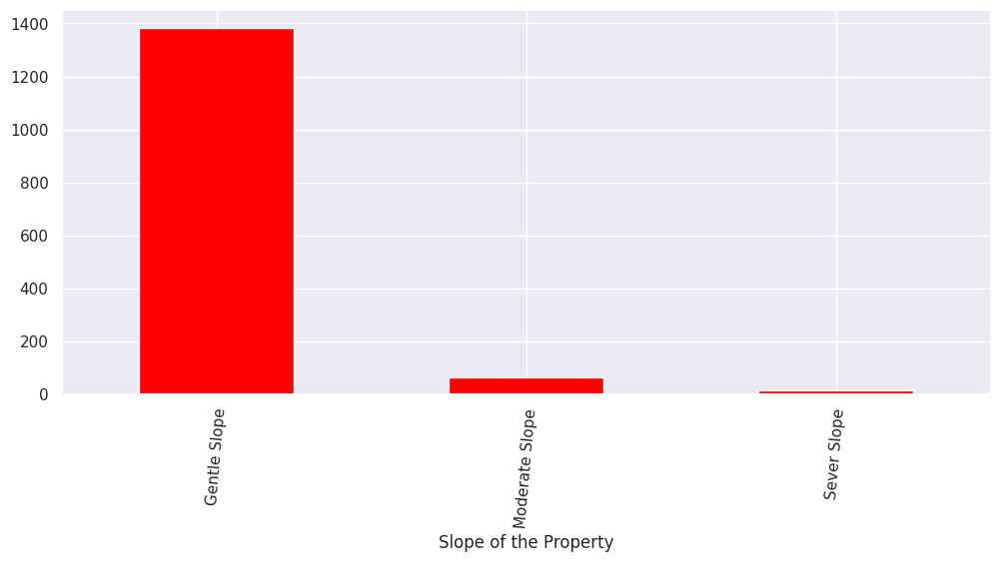

In [ ]:
plt.figure(figsize=(12,5))
House_data['Slope of the Property'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

## RENAME OF THE COLUMNS

## Neighborhood = Location Within Ames City limits

# NAmes = North Ames
# CollgCr = Collage Creek
# OldTown = Old Town
# Edwards = Edwards
# Somerst = Somerst
# Gilbert = Gilbert
# NridgHt = Northridge Heights
# Sawyer = Sawyer
# NWAmes = North west Ames
# SawyerW = Sawyer West
# BrkSide = Brack side
# Crawfor = Craw ford
# Mitchel = Mitchell
# NoRidge = North ridge
# Timber = Timber land
# IDOTRR = lowa DOT and Rail Road
# ClearCr = Clear Creek
# StoneBr = Stone Brook
# SWISU = South & West of lowa State University
# MeadowV = Meadow Village
# Blmngtn = Bloomington heights
# BrDale = Briaedale
# Veenker = Veenker
# NPkVill = North Park Villa
# Blmngtn = Bluestem

In [ ]:
House_data.rename(columns={'Neighborhood':'Location Within Ames City limits'},inplace = True)

In [ ]:
House_data['Location Within Ames City limits'] = House_data['Location Within Ames City limits'].replace({'NAmes':'North Ames','CollgCr':'Collage Creek','OldTown':'Old Town','Edwards':'Edwards','Somerst':'Somerst','Gilbert':'Gilbert','NridgHt':'Northridge Heights','Sawyer':'Sawyer','NWAmes':'North west Ames','SawyerW':'Sawyer West','BrkSide':'Brack side','Crawfor':'Craw ford','Mitchel':'Mitchell','NoRidge':'North ridge','Timber':'Timber land','IDOTRR':'lowa DOT and Rail Road','ClearCr':'Clear Creek','StoneBr':'Stone Brook','SWISU':'South & West of lowa State University','MeadowV':'Meadow Village','Blmngtn':'Bloomington heights','BrDale':'Briaedale','Veenker':'Veenker','NPkVill':'North Park Villa','Blmngtn':'Bluestem'})

In [ ]:
House_data.iloc[0:10,:14] # Slicing Row and columns

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Location Within Ames City limits,Condition1
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Norm
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Feedr
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Norm
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,Craw ford,Norm
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,North ridge,Norm
5,5,1-1/2 STORY FINISHED ALL AGE,Residential Low-Density,85,14115,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Mitchell,Norm
6,6,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,75,10084,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Somerst,Norm
7,7,2-STORY 1946 $ NEWER,Residential Low-Density,0,10382,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,North west Ames,PosN
8,8,1-1/2 STORY FINISHED ALL AGE,Residential Medium Density,51,6120,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Old Town,Artery
9,9,SC190,Residential Low-Density,50,7420,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,Brack side,Artery


## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Location Within Ames City limits'].nunique()

26

In [ ]:
House_data['Location Within Ames City limits'].unique()

array(['Collage Creek', 'Veenker', 'Craw ford', 'North ridge', 'Mitchell',
       'Somerst', 'North west Ames', 'Old Town', 'Brack side', 'Sawyer',
       'Northridge Heights', 'North Ames', 'Sawyer West',
       'lowa DOT and Rail Road', 'Meadow Village', 'Edwards',
       'Timber land', 'Gilbert', 'Stone Brook', 'Clear Creek',
       'North Park Villa', 'Bluestem', 'Briaedale',
       'South & West of lowa State University', 'Blueste', 'stoneBr'],
      dtype=object)

In [ ]:
House_data['Location Within Ames City limits'].value_counts()

Location Within Ames City limits
North Ames                               224
Collage Creek                            150
Old Town                                 113
Edwards                                  100
Somerst                                   86
Gilbert                                   79
Northridge Heights                        77
Sawyer                                    74
North west Ames                           73
Sawyer West                               59
Brack side                                57
Craw ford                                 51
Mitchell                                  49
North ridge                               41
Timber land                               38
lowa DOT and Rail Road                    37
Clear Creek                               27
South & West of lowa State University     26
Stone Brook                               25
Meadow Village                            17
Bluestem                                  17
Briaedale             

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25]),
 [Text(0, 0, 'North Ames'),
  Text(1, 0, 'Collage Creek'),
  Text(2, 0, 'Old Town'),
  Text(3, 0, 'Edwards'),
  Text(4, 0, 'Somerst'),
  Text(5, 0, 'Gilbert'),
  Text(6, 0, 'Northridge Heights'),
  Text(7, 0, 'Sawyer'),
  Text(8, 0, 'North west Ames'),
  Text(9, 0, 'Sawyer West'),
  Text(10, 0, 'Brack side'),
  Text(11, 0, 'Craw ford'),
  Text(12, 0, 'Mitchell'),
  Text(13, 0, 'North ridge'),
  Text(14, 0, 'Timber land'),
  Text(15, 0, 'lowa DOT and Rail Road'),
  Text(16, 0, 'Clear Creek'),
  Text(17, 0, 'South & West of lowa State University'),
  Text(18, 0, 'Stone Brook'),
  Text(19, 0, 'Meadow Village'),
  Text(20, 0, 'Bluestem'),
  Text(21, 0, 'Briaedale'),
  Text(22, 0, 'Veenker'),
  Text(23, 0, 'North Park Villa'),
  Text(24, 0, 'Blueste'),
  Text(25, 0, 'stoneBr')])

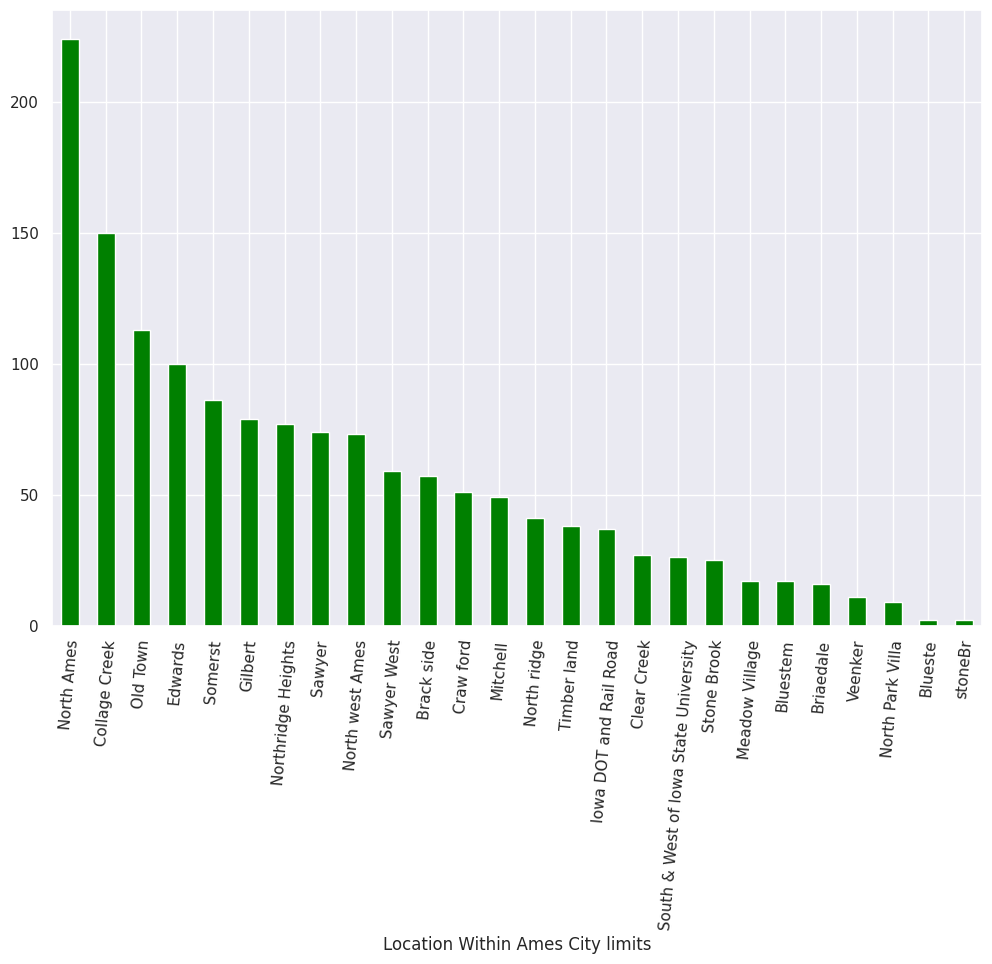

In [ ]:
plt.figure(figsize=(12,8))
House_data['Location Within Ames City limits'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

In [ ]:
House_data.iloc[0:5,12:] # Slicing Row and columns

,Location Within Ames City limits,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,Collage Creek,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,Collage Creek,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,Craw ford,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,North ridge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,...,0,No,No,No,0,Dec,2008,WD,Normal,250000


## RENAME OF THE COLUMNS

## Condition 1 and Condition 2 : proximity to various condition
## Artery = Adjacent to arterial street
## Feedr = Adjacent to feeder street
## Norm = Normal
## RRNn = Within 200' of North-South Railroad
## RRAn = Adjacent to North-South Railroad
## PosN = Near positive off-site feature park, greenbelt, etc.
## PosA =Adjacent to positive off site feature
## RRNe = Within 200' of East West Railroad
## RRAe = Adjacent to East West Railroad

In [ ]:
House_data['Condition1'] = House_data['Condition1'].replace({'Artery':'Adjacent to arterial street','Feedr':'Adjacent to feeder street','Norm':'Normal','RRNn':'Within 200 of North-South Railroad','RRAn':'Adjacent to North-South Railroad','PosN':'Near positive off-site feature park, greenbelt, etc.','PosA':'Adjacent to positive off site feature','RRNe':'Within 200 of East West Railroad','RRAe':'Adjacent to East West Railroad'})

In [ ]:
House_data['Condition2'] = House_data['Condition2'].replace({'Artery':'Adjacent to arterial street','Feedr':'Adjacent to feeder street','Norm':'Normal','RRNn':'Within 200 of North-South Railroad','RRAn':'Adjacent to North-South Railroad','PosN':'Near positive off-site feature park, greenbelt, etc.','PosA':'Adjacent to positive off site feature','RRNe':'Within 200 of East West Railroad','RRAe':'Adjacent to East West Railroad'})

In [ ]:
House_data.iloc[0:5,12:] # Slicing Row and columns

,Location Within Ames City limits,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,Collage Creek,Normal,Normal,1Fam,2Story,7,5,2003,2003,Gable,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,Veenker,Adjacent to feeder street,Normal,1Fam,1Story,6,8,1976,1976,Gable,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,Collage Creek,Normal,Normal,1Fam,2Story,7,5,2001,2002,Gable,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,Craw ford,Normal,Normal,1Fam,2Story,7,5,1915,1970,Gable,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,North ridge,Normal,Normal,1Fam,2Story,8,5,2000,2000,Gable,...,0,No,No,No,0,Dec,2008,WD,Normal,250000


## MAKE FUNCTION TO DO FEATURE ENGINEERING

In [ ]:
def column_add(x,y):
  if x != y:
    return (x + '&' + y)
  else:
    return x

In [ ]:
House_data['Condition1'] = House_data.apply(lambda a: column_add(a['Condition1'],a['Condition2']), axis = 1)

In [ ]:
House_data.head()

,Unnamed: 0,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",...,0,No,No,No,0,Dec,2008,WD,Normal,250000


In [ ]:
House_data.rename(columns={'Condition1':'proximity to various condition'},inplace = True)

## Drop Unnammed column and Condition2 column

In [ ]:
House_data.drop(['Unnamed: 0','Condition2'],axis = 1,inplace = True)

In [ ]:
House_data.shape

(1460, 79)

In [ ]:
House_data.iloc[0:4,2:15]

,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Location Within Ames City limits,proximity to various condition,BldgType,HouseStyle
0,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,1Fam,2Story
1,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Adjacent to feeder street&Normal,1Fam,1Story
2,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,1Fam,2Story
3,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,Craw ford,Normal,1Fam,2Story


In [ ]:
House_data.iloc[0:4,0:15]

,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Location Within Ames City limits,proximity to various condition,BldgType,HouseStyle
0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,1Fam,2Story
1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Adjacent to feeder street&Normal,1Fam,1Story
2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,1Fam,2Story
3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,Craw ford,Normal,1Fam,2Story


## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['proximity to various condition'].nunique()

18

In [ ]:
House_data['proximity to various condition'].unique()

array(['Normal', 'Adjacent to feeder street&Normal',
       'Near positive off-site feature park, greenbelt, etc.&Normal',
       'Adjacent to arterial street&Normal',
       'Adjacent to arterial street',
       'Adjacent to East West Railroad&Normal',
       'Adjacent to feeder street&Within 200 of North-South Railroad',
       'Within 200 of North-South Railroad&Normal',
       'Adjacent to North-South Railroad&Adjacent to feeder street',
       'Adjacent to positive off site feature&Normal',
       'Adjacent to feeder street',
       'Adjacent to North-South Railroad&Normal',
       'Within 200 of East West Railroad&Normal',
       'Near positive off-site feature park, greenbelt, etc.',
       'Within 200 of North-South Railroad&Adjacent to feeder street',
       'Adjacent to arterial street&Adjacent to positive off site feature',
       'Adjacent to feeder street&Adjacent to North-South Railroad',
       'Adjacent to feeder street&Adjacent to East West Railroad'],
      dtype=obje

In [ ]:
House_data['proximity to various condition'].value_counts()

proximity to various condition
Normal                                                               1260
Adjacent to feeder street&Normal                                       76
Adjacent to arterial street&Normal                                     45
Adjacent to North-South Railroad&Normal                                22
Near positive off-site feature park, greenbelt, etc.&Normal            17
Adjacent to East West Railroad&Normal                                  11
Adjacent to positive off site feature&Normal                            8
Adjacent to North-South Railroad&Adjacent to feeder street              4
Within 200 of North-South Railroad&Normal                               4
Adjacent to arterial street                                             2
Adjacent to feeder street&Within 200 of North-South Railroad            2
Within 200 of East West Railroad&Normal                                 2
Near positive off-site feature park, greenbelt, etc.                    2
Adjacen

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'Normal'),
  Text(1, 0, 'Adjacent to feeder street&Normal'),
  Text(2, 0, 'Adjacent to arterial street&Normal'),
  Text(3, 0, 'Adjacent to North-South Railroad&Normal'),
  Text(4, 0, 'Near positive off-site feature park, greenbelt, etc.&Normal'),
  Text(5, 0, 'Adjacent to East West Railroad&Normal'),
  Text(6, 0, 'Adjacent to positive off site feature&Normal'),
  Text(7, 0, 'Adjacent to North-South Railroad&Adjacent to feeder street'),
  Text(8, 0, 'Within 200 of North-South Railroad&Normal'),
  Text(9, 0, 'Adjacent to arterial street'),
  Text(10, 0, 'Adjacent to feeder street&Within 200 of North-South Railroad'),
  Text(11, 0, 'Within 200 of East West Railroad&Normal'),
  Text(12, 0, 'Near positive off-site feature park, greenbelt, etc.'),
  Text(13, 0, 'Adjacent to feeder street'),
  Text(14, 0, 'Within 200 of North-South Railroad&Adjacent to feeder street'),
  Text(15, 0, 'Adjacen

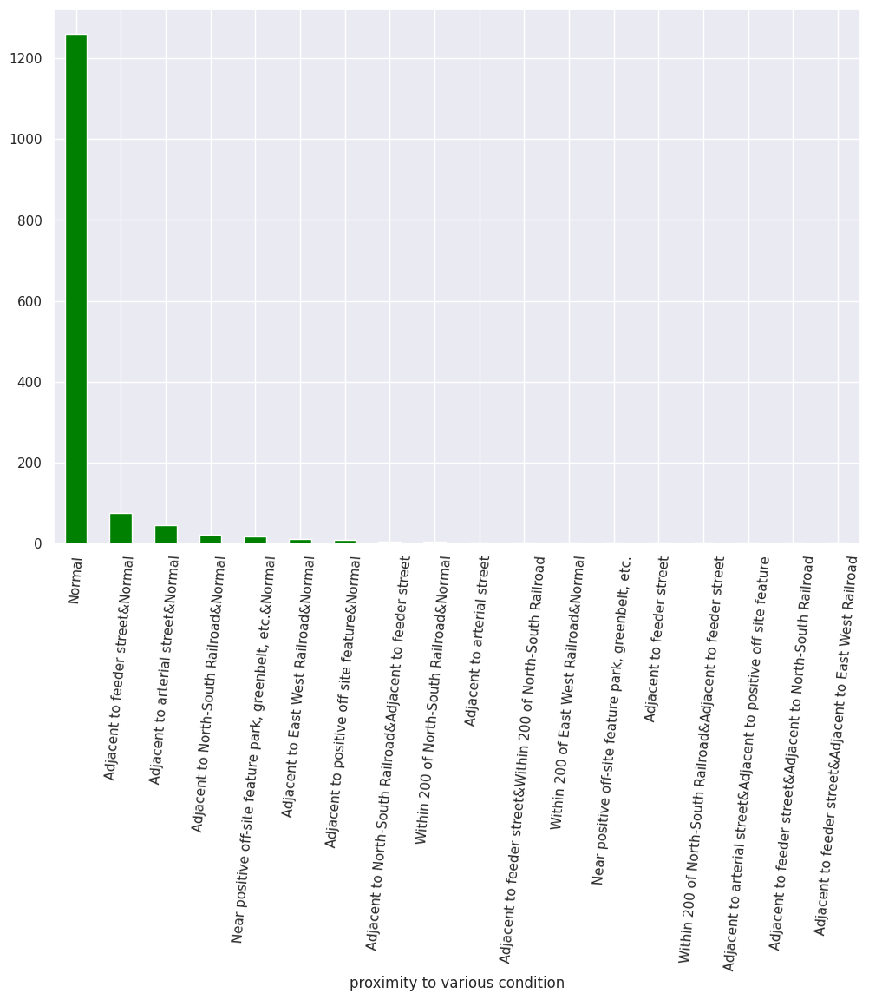

In [ ]:
plt.figure(figsize=(12,8))
House_data['proximity to various condition'].value_counts().plot(kind='bar',color ='green')
plt.xticks(rotation = 85)

## Drop both columns BldgType and HouseStyle

In [ ]:
House_data.drop(['BldgType','HouseStyle'],axis=1, inplace = True)

In [ ]:
House_data.shape

(1460, 77)

In [ ]:
House_data.iloc[0:5,0:15]

,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Location Within Ames City limits,proximity to various condition,OverallQual,OverallCond
0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,7,5
1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Adjacent to feeder street&Normal,6,8
2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,7,5
3,2 - STORY 1945 $ ODER,Residential Low-Density,60,9550,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Corner lot,Gentle Slope,Craw ford,Normal,7,5
4,2-STORY 1946 $ NEWER,Residential Low-Density,84,14260,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,North ridge,Normal,8,5


## RENAME OF THE COLUMN
## OverallQual = Rates the overall material and finish of the house
## 1 = Very Excellent
## 2 = Excellent
## 3 = Very Good
## 4 = Good
## 5 = Above Average
## 6 = Average
## 7 = Below Average
## 8 = Fair
## 9 = poor
## 10 = Very Poor


In [ ]:
House_data.rename(columns={'OverallQual':'Rates the overall material and finish of the house'},inplace = True)

In [ ]:
House_data['Rates the overall material and finish of the house'] = House_data['Rates the overall material and finish of the house'].replace({1:'Very Excellent',2:'Excellent',3:'Very Good',4:'Good',5:'Above Average',6:'Average',7:'Below Average',8:'Fair',9:'poor',10:'Very Poor'})

In [ ]:
House_data.columns

Index(['Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Type of Alley', 'General shape of property',
       'Flatness of the property', 'Type of Utilites available',
       'Lot configuration', 'Slope of the Property',
       'Location Within Ames City limits', 'proximity to various condition',
       'Rates the overall material and finish of the house', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
     

In [ ]:
House_data.iloc[0:3,0:16]

,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Location Within Ames City limits,proximity to various condition,Rates the overall material and finish of the house,OverallCond,YearBuilt
0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,Below Average,5,2003
1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Adjacent to feeder street&Normal,Average,8,1976
2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,Below Average,5,2001


## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Rates the overall material and finish of the house'].nunique()

10

In [ ]:
House_data['Rates the overall material and finish of the house'].unique()

array(['Below Average', 'Average', 'Fair', 'Above Average', 'poor',
       'Good', 'Very Poor', 'Very Good', 'Very Excellent', 'Excellent'],
      dtype=object)

In [ ]:
House_data['Rates the overall material and finish of the house'].value_counts()

Rates the overall material and finish of the house
Above Average     397
Average           374
Below Average     319
Fair              168
Good              116
poor               43
Very Good          20
Very Poor          18
Excellent           3
Very Excellent      2
Name: count, dtype: int64

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'Above Average'),
  Text(1, 0, 'Average'),
  Text(2, 0, 'Below Average'),
  Text(3, 0, 'Fair'),
  Text(4, 0, 'Good'),
  Text(5, 0, 'poor'),
  Text(6, 0, 'Very Good'),
  Text(7, 0, 'Very Poor'),
  Text(8, 0, 'Excellent'),
  Text(9, 0, 'Very Excellent')])

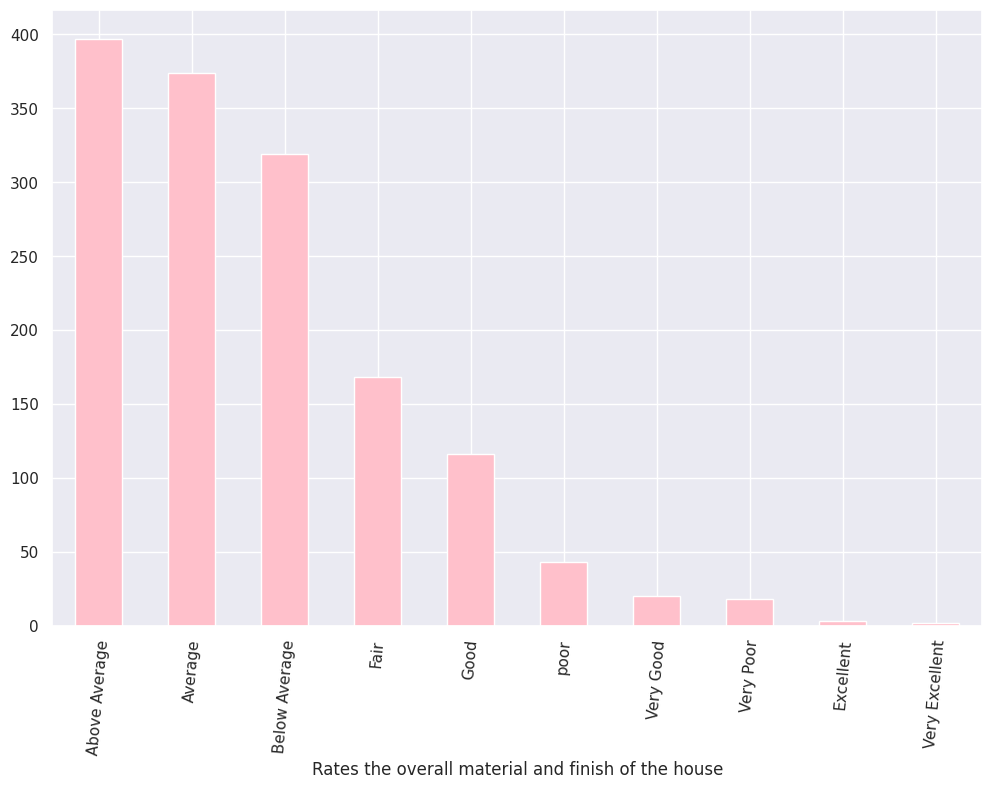

In [ ]:
plt.figure(figsize=(12,8))
House_data['Rates the overall material and finish of the house'].value_counts().plot(kind='bar',color ='pink')
plt.xticks(rotation = 85)

## RENAME OF THE COLUMN
## OverallCond = Rates the overall condition of the house
## 1 = Very Excellent
## 2 = Excellent
## 3 = Very Good
## 4 = Good
## 5 = Above Average
## 6 = Average
## 7 = Below Average
## 8 = Fair
## 9 = poor
## 10 = Very Poor


In [ ]:
House_data.rename(columns={'OverallCond':'Rates the overall condition of the house'},inplace = True)

In [ ]:
House_data['Rates the overall condition of the house'] = House_data['Rates the overall condition of the house'].replace({1:'Very Excellent',2:'Excellent',3:'Very Good',4:'Good',5:'Above Average',6:'Average',7:'Below Average',8:'Fair',9:'poor',10:'Very Poor'})

In [ ]:
House_data.iloc[0:3,0:17]

,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,Slope of the Property,Location Within Ames City limits,proximity to various condition,Rates the overall material and finish of the house,Rates the overall condition of the house,YearBuilt,YearRemodAdd
0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,Below Average,Above Average,2003,2003
1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,Gentle Slope,Veenker,Adjacent to feeder street&Normal,Average,Fair,1976,1976
2,2-STORY 1946 $ NEWER,Residential Low-Density,68,11250,Paved,No Alley Access,Slightly irregular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,Gentle Slope,Collage Creek,Normal,Below Average,Above Average,2001,2002


## UNIQUE VALUE AND VALUE COUNTS AND CHECK THE PLOT

In [ ]:
House_data['Rates the overall condition of the house'].nunique()

9

In [ ]:
House_data['Rates the overall condition of the house'].unique()

array(['Above Average', 'Fair', 'Average', 'Below Average', 'Good',
       'Excellent', 'Very Good', 'poor', 'Very Excellent'], dtype=object)

In [ ]:
House_data['Rates the overall condition of the house'].value_counts()

Rates the overall condition of the house
Above Average     821
Average           252
Below Average     205
Fair               72
Good               57
Very Good          25
poor               22
Excellent           5
Very Excellent      1
Name: count, dtype: int64

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Above Average'),
  Text(1, 0, 'Average'),
  Text(2, 0, 'Below Average'),
  Text(3, 0, 'Fair'),
  Text(4, 0, 'Good'),
  Text(5, 0, 'Very Good'),
  Text(6, 0, 'poor'),
  Text(7, 0, 'Excellent'),
  Text(8, 0, 'Very Excellent')])

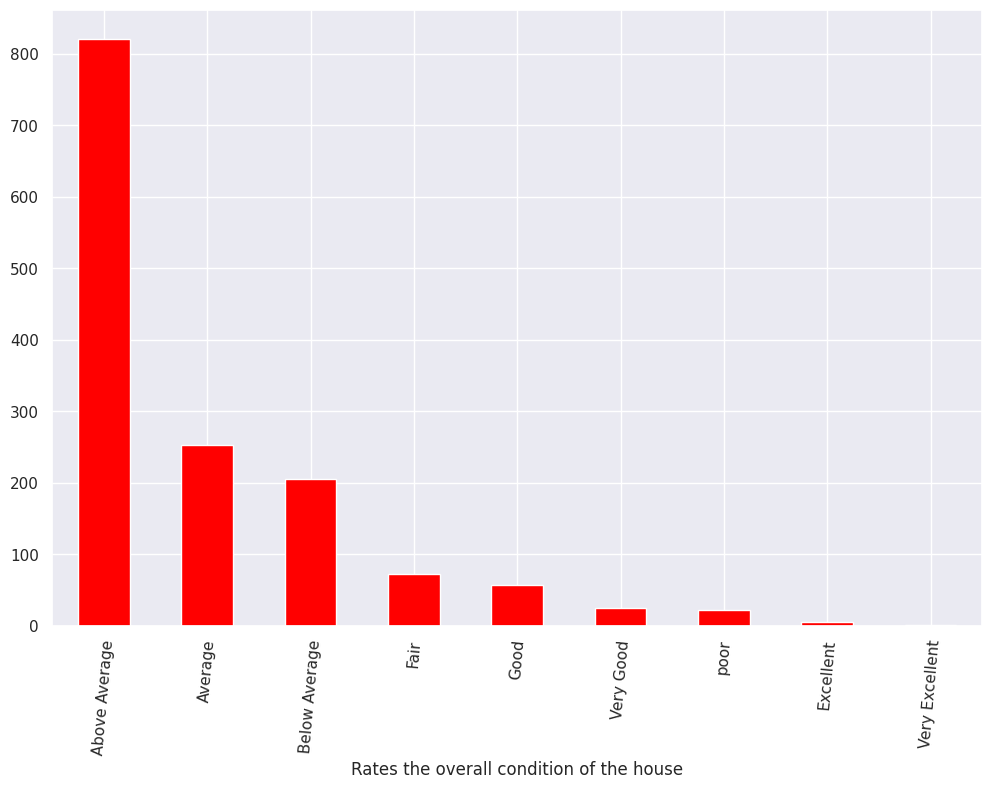

In [ ]:
plt.figure(figsize=(12,8))
House_data['Rates the overall condition of the house'].value_counts().plot(kind='bar',color ='red')
plt.xticks(rotation = 85)

In [ ]:
House_data.columns

Index(['Type of Dwelling', 'General Zone Classification',
       'Linear Feet of Street', 'Plot size in Square feet', 'Type of road',
       'Type of Alley', 'General shape of property',
       'Flatness of the property', 'Type of Utilites available',
       'Lot configuration', 'Slope of the Property',
       'Location Within Ames City limits', 'proximity to various condition',
       'Rates the overall material and finish of the house',
       'Rates the overall condition of the house', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 

## CHANGE YEAR FROM FLOAT TO INTEGER

In [ ]:
def correct_year(x):
    return int (x)

In [ ]:
House_data.rename(columns={'GarageYrBlt':'The year of Garage Built'},inplace = True)

In [ ]:
House_data["The year of Garage Built"] = House_data["The year of Garage Built"].astype("object")# Data type Conversion

## RENAME OF THE COLUMNS

In [ ]:
House_data.rename(columns={'YearBuilt':'Original construction data'},inplace = True)

In [ ]:
House_data.rename(columns={'YearRemodAdd':'Remodel data of Property'},inplace = True)

In [ ]:
House_data.rename(columns={'RoofStyle':'Type of Roof'},inplace = True)

In [ ]:
House_data.rename(columns={'RoofMatl':'Material used in Roof'},inplace = True)

In [ ]:
House_data.rename(columns={'Exterior1st':'Exterior Covering on the House'},inplace = True)

In [ ]:
House_data.rename(columns={'MasVnrType':'Masonry veneer type'},inplace = True)

In [ ]:
House_data.rename(columns={'MasVnrArea':'Masonry veneer area in square feet'},inplace = True)

In [ ]:
House_data.rename(columns={'ExterQual':'Evaluation of Quality of material on Exterior'},inplace = True)

In [ ]:
House_data.rename(columns={'ExterCond':'Evaluation present condition of material on Exterior'},inplace = True)

In [ ]:
House_data.rename(columns={'Foundation':'Type of Foundation'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtQual':'Evaluate of hight of the basement'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtCond':'Evaluation of condition of besement'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtExposure':'Exposure Walkout or garden leve walls'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtFinType1':'Basement Finished area rating'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtFinSF1':'Finished Square feet area in besement'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtFinSF2':'Type2 finished square feet'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtUnfSF':'Unfinished Basement area in square feet'},inplace = True)

In [ ]:
House_data.rename(columns={'TotalBsmtSF':'Total Basement area in square feet'},inplace = True)

In [ ]:
House_data.rename(columns={'Heating':'Type of Heating'},inplace = True)

In [ ]:
House_data.rename(columns={'HeatingQC':'Heating Quality and condition'},inplace = True)

In [ ]:
House_data.rename(columns={'CentralAir':'Central Air Conditioning'},inplace = True)

In [ ]:
House_data.rename(columns={'Electrical':'Electrical System'},inplace = True)

In [ ]:
House_data.rename(columns={'1stFlrSF':'Area of 1st Floor in Square feet'},inplace = True)

In [ ]:
House_data.rename(columns={'2ndFlrSF':'Area of 2nd Floor in Square feet'},inplace = True)

In [ ]:
House_data.rename(columns={'GrLivArea':'Total living area in square feet'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtFullBath':'Full Bathrooms'},inplace = True)

In [ ]:
House_data.rename(columns={'BedroomAbvGr':'Bedrooms above grade does Not include basement'},inplace = True)

In [ ]:
House_data.rename(columns={'BsmtHalfBath':'Half Bathroom'},inplace = True)

In [ ]:
House_data.rename(columns={'KitchenQual':'Kitchen Quality'},inplace = True)

In [ ]:
House_data.rename(columns={'TotRmsAbvGrd':'Total Rooms Excluded bathrooms'},inplace = True)

In [ ]:
House_data.rename(columns={'Fireplaces':'Number of Fireplaces'},inplace = True)

In [ ]:
House_data.rename(columns={'FireplaceQu':'Fireplace Quality'},inplace = True)

In [ ]:
House_data.rename(columns={'GarageType':'Garage location'},inplace = True)

In [ ]:
House_data.rename(columns={'GarageYrBlt':'The year of Garage Built'},inplace = True)

In [ ]:
House_data.rename(columns={'SalePrice':'Sale Price'},inplace = True)

In [ ]:
House_data.iloc[0:2,0:50]

,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration,...,Area of 2nd Floor in Square feet,LowQualFinSF,Total living area in square feet,Full Bathrooms,Half Bathroom,FullBath,HalfBath,Bedrooms above grade does Not include basement,KitchenAbvGr,Kitchen Quality
0,2-STORY 1946 $ NEWER,Residential Low-Density,65,8450,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Inside lot,...,854,0,1710,1,0,2,1,3,1,Gd
1,1-STORY 1946 & NEWER ALL STYLES,Residential Low-Density,80,9600,Paved,No Alley Access,Regular,Near Flat/Level,"All public Utilities (E,G,W,&S)",Frantage on 2 sides of the property,...,0,0,1262,0,1,2,0,3,1,TA


## MEAN, MODE, MEDIAN

In [ ]:
House_data['Sale Price'].mean()

180921.19589041095

In [ ]:
House_data['Sale Price'].mode()

0    140000
Name: Sale Price, dtype: int64

In [ ]:
House_data['Sale Price'].median()

163000.0

### FEATURE ENGINEERING

## BOX PLOT AND CHECK OUTLIER

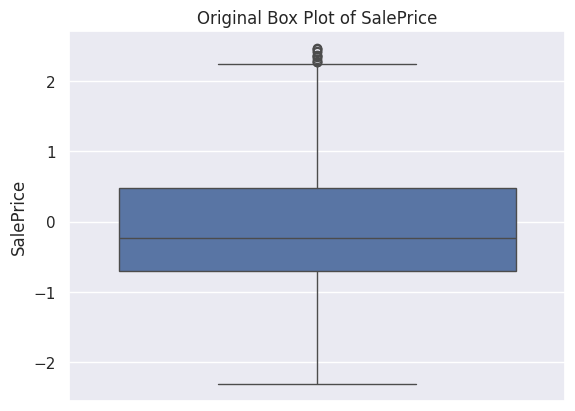

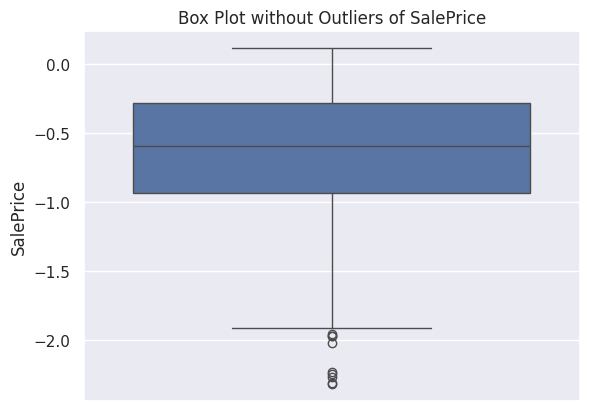

In [ ]:
def removal_box_plot(df, column, threshold):
    sns.boxplot(df[column])
    plt.title(f'Original Box Plot of {column}')
    plt.show()

    removed_outliers = df[df[column] <= threshold]

    sns.boxplot(removed_outliers[column])
    plt.title(f'Box Plot without Outliers of {column}')
    plt.show()
    return removed_outliers


threshold_value = 0.12

no_outliers = removal_box_plot(concatenate_df, 'SalePrice', threshold_value,)


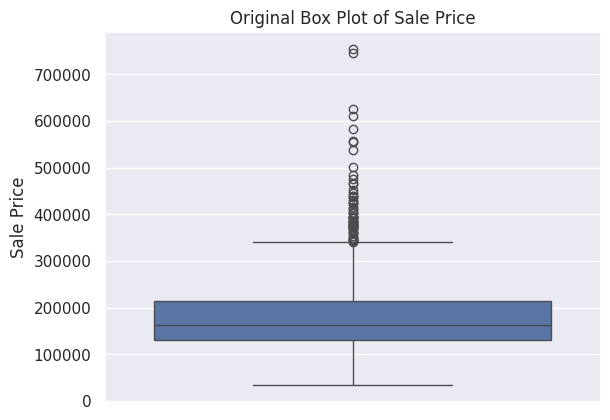

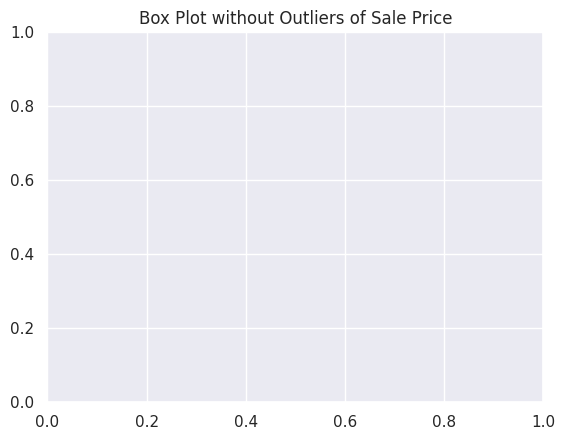

In [ ]:
def removal_box_plot(House_data, column, threshold):
    sns.boxplot(House_data[column])
    plt.title(f'Original Box Plot of {column}')
    plt.show()

    removed_outliers = House_data[House_data[column] <= threshold]

    sns.boxplot(removed_outliers[column])
    plt.title(f'Box Plot without Outliers of {column}')
    plt.show()
    return removed_outliers


threshold_value = 0.12

no_outliers = removal_box_plot(House_data, 'Sale Price', threshold_value,)


In [ ]:
# identfy file the numeric and the categorical_columns as
numerical_columns= House_data.select_dtypes(include=["number"]).columns.to_list()
categorical_columns= House_data.select_dtypes(include=["object"]).columns.to_list()

In [ ]:
numerical_columns

['Linear Feet of Street',
 'Plot size in Square feet',
 'Original construction data',
 'Remodel data of Property',
 'Masonry veneer area in square feet',
 'Finished Square feet area in besement',
 'Type2 finished square feet',
 'Unfinished Basement area in square feet',
 'Total Basement area in square feet',
 'Area of 1st Floor in Square feet',
 'Area of 2nd Floor in Square feet',
 'LowQualFinSF',
 'Total living area in square feet',
 'Full Bathrooms',
 'Half Bathroom',
 'FullBath',
 'HalfBath',
 'Bedrooms above grade does Not include basement',
 'KitchenAbvGr',
 'Total Rooms Excluded bathrooms',
 'Number of Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'YrSold',
 'Sale Price']

In [ ]:
categorical_columns

['Type of Dwelling',
 'General Zone Classification',
 'Type of road',
 'Type of Alley',
 'General shape of property',
 'Flatness of the property',
 'Type of Utilites available',
 'Lot configuration',
 'Slope of the Property',
 'Location Within Ames City limits',
 'proximity to various condition',
 'Rates the overall material and finish of the house',
 'Rates the overall condition of the house',
 'Type of Roof',
 'Material used in Roof',
 'Exterior Covering on the House',
 'Exterior2nd',
 'Masonry veneer type',
 'Evaluation of Quality of material on Exterior',
 'Evaluation present condition of material on Exterior',
 'Type of Foundation',
 'Evaluate of hight of the basement',
 'Evaluation of condition of besement',
 'Exposure Walkout or garden leve walls',
 'Basement Finished area rating',
 'BsmtFinType2',
 'Type of Heating',
 'Heating Quality and condition',
 'Central Air Conditioning',
 'Electrical System',
 'Kitchen Quality',
 'Functional',
 'Fireplace Quality',
 'Garage location',
 

In [ ]:
## for categorical data encoding

from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
for categorical_col in categorical_columns:
    House_data[categorical_col] = encoder.fit_transform(House_data[categorical_col])

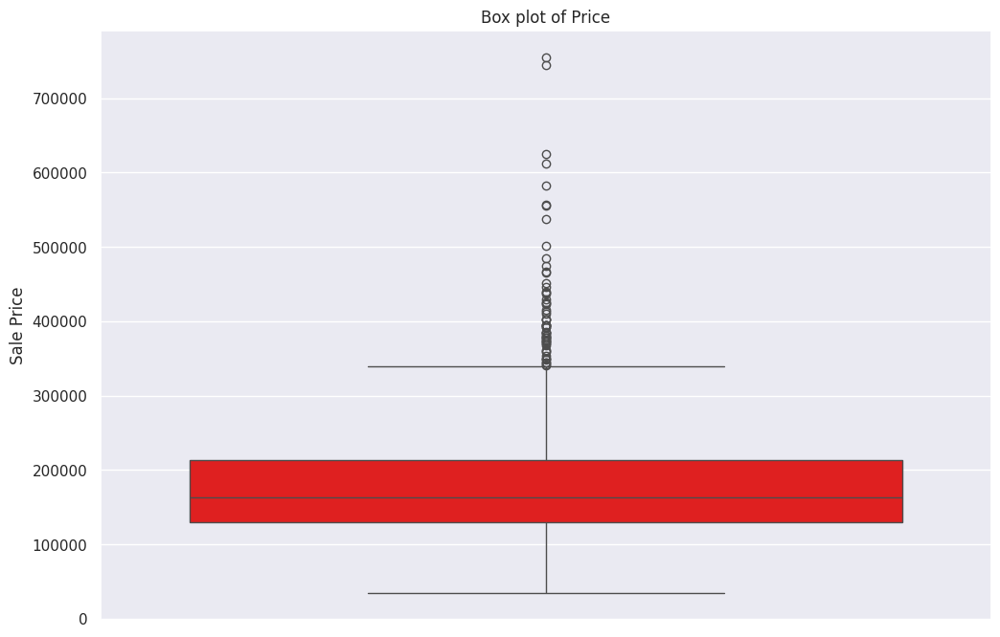

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(data = House_data, y = 'Sale Price', color = 'red')
plt.title('Box plot of Price')
plt.show()

In [ ]:
def iqr_technique(DFcolumn): # Make function to handle outliers of column with IQR method by capping
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(House_data['Sale Price'])


In [ ]:
House_data = House_data[(House_data['Sale Price'] > lower_range) & (House_data['Sale Price'] < upper_range)]

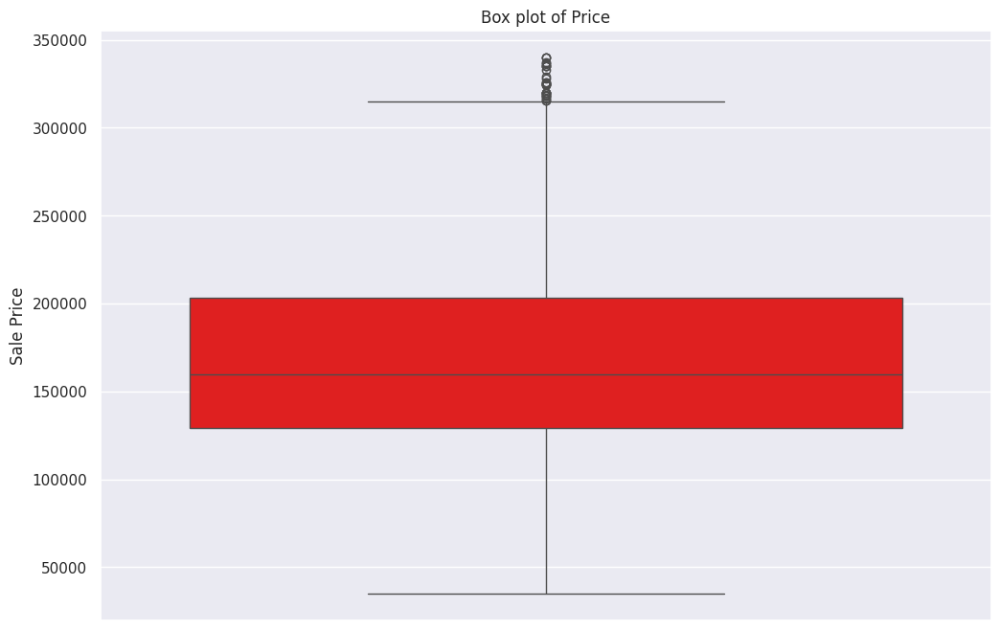

In [ ]:
# Check that the outliers are removed.
plt.figure(figsize=(12,8))
sns.boxplot(data = House_data, y ='Sale Price',color = 'red')
plt.title('Box plot of Price')
plt.show()

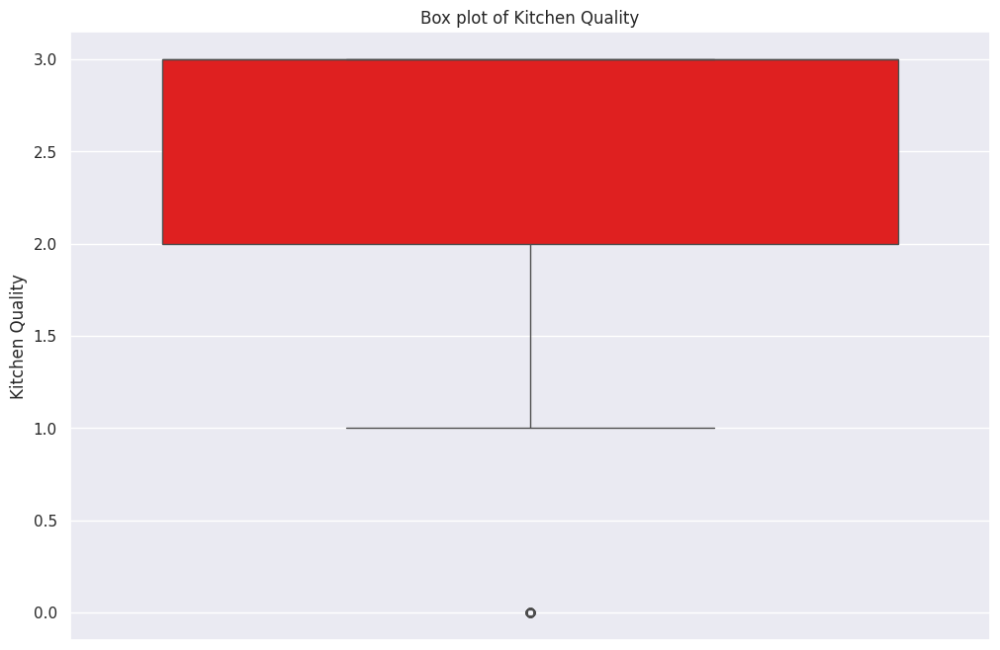

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(data = House_data, y = 'Kitchen Quality', color = 'red')
plt.title('Box plot of Kitchen Quality')
plt.show()

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(House_data['Kitchen Quality'])
House_data = House_data[(House_data['Kitchen Quality'] > lower_range) & (House_data['Kitchen Quality'] < upper_range)]

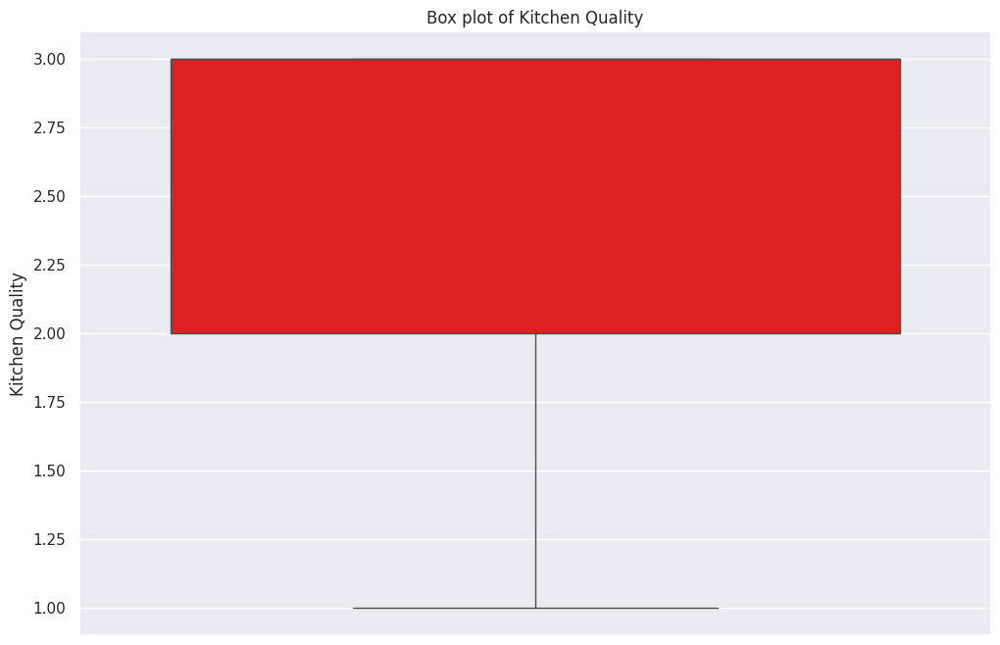

In [ ]:
plt.figure(figsize=(12,8)) # Check that the outliers are removed
sns.boxplot(data = House_data, y = 'Kitchen Quality', color = 'red')
plt.title('Box plot of Kitchen Quality')
plt.show()

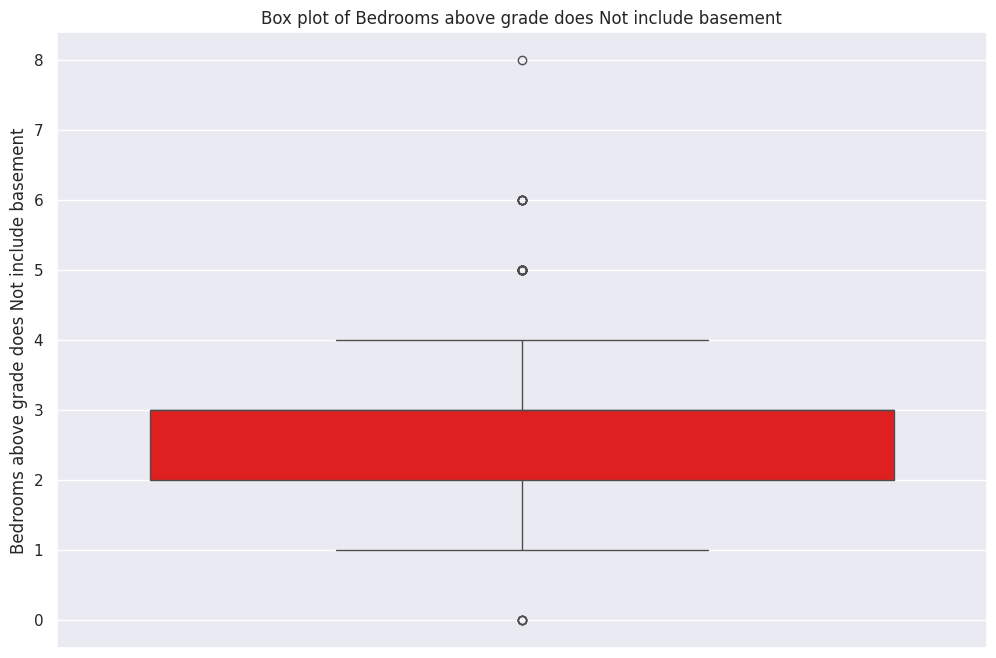

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(data = House_data, y = 'Bedrooms above grade does Not include basement', color = 'red')
plt.title('Box plot of Bedrooms above grade does Not include basement')
plt.show()

In [ ]:
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3-Q1
  lower_range = Q1 -(1.5 * IQR)
  upper_range = Q3 +(1.5 * IQR)
  return lower_range, upper_range

In [ ]:
lower_range, upper_range = iqr_technique(House_data['Bedrooms above grade does Not include basement'])
House_data = House_data[(House_data['Bedrooms above grade does Not include basement'] > lower_range) & (House_data['Bedrooms above grade does Not include basement'] < upper_range)]

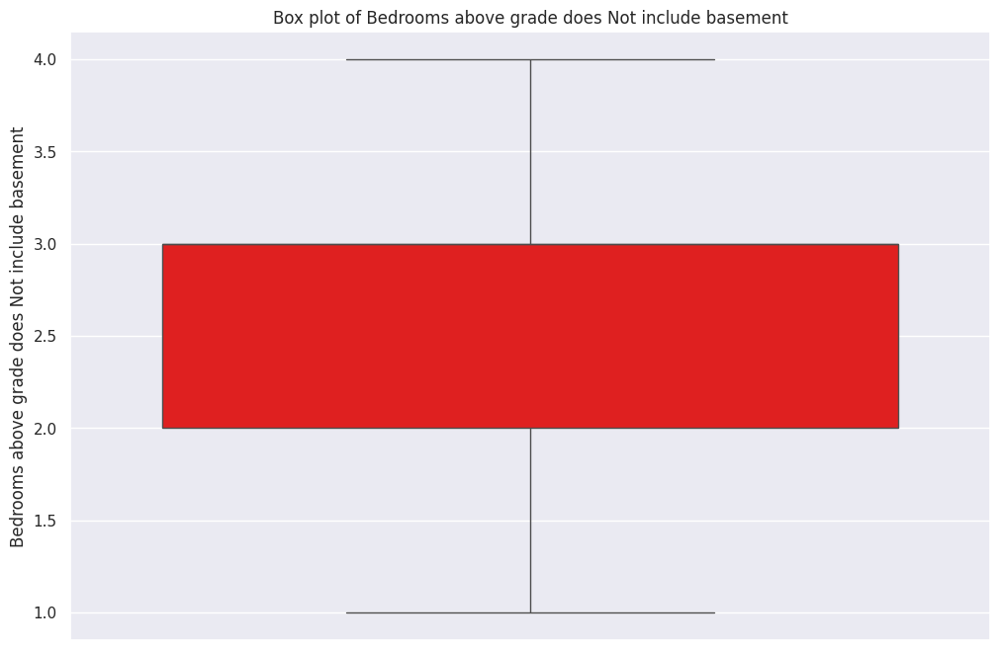

In [ ]:
# Check that the outliers are removed
plt.figure(figsize=(12,8))
sns.boxplot(data = House_data, y = 'Bedrooms above grade does Not include basement', color = 'red')
plt.title('Box plot of Bedrooms above grade does Not include basement')
plt.show()

## Univariate Analysis

In [ ]:
House_data.describe().iloc[:,:10]

,Type of Dwelling,General Zone Classification,Linear Feet of Street,Plot size in Square feet,Type of road,Type of Alley,General shape of property,Flatness of the property,Type of Utilites available,Lot configuration
count,1304.000000,1304.000000,1304.000000,1304.000000,1304.000000,1304.000000,1304.000000,1304.000000,1304.000000,1304.000000
mean,6.642638,3.029908,55.548313,10018.805215,0.995399,0.995399,2.286810,2.799080,0.000767,3.020706
std,3.131729,0.650776,33.528066,8332.553843,0.067702,0.250820,0.540553,0.675954,0.027692,1.621148
min,0.000000,0.000000,0.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,3.000000,39.750000,7389.500000,1.000000,1.000000,2.000000,3.000000,0.000000,2.000000
50%,6.000000,3.000000,60.000000,9202.000000,1.000000,1.000000,2.000000,3.000000,0.000000,4.000000
75%,10.000000,3.000000,76.000000,11201.750000,1.000000,1.000000,3.000000,3.000000,0.000000,4.000000
max,14.000000,4.000000,313.000000,164660.000000,1.000000,2.000000,3.000000,3.000000,1.000000,4.000000


## HISTOGRAM OF PRICE ANALYSIS

In [ ]:
import seaborn as sns

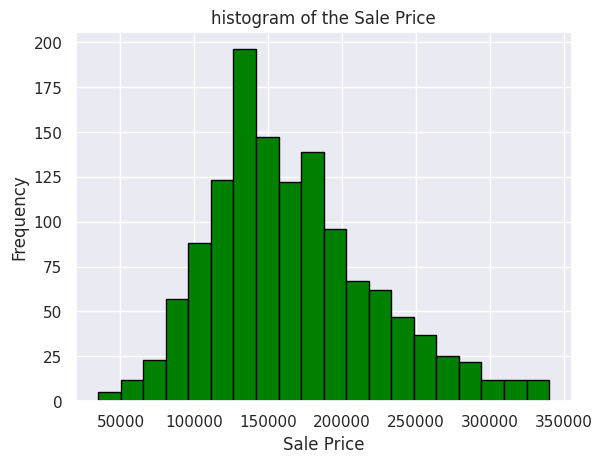

In [ ]:
# histogram Sale Price
plt.hist(House_data['Sale Price'], bins = 20, color = 'green', edgecolor = 'black')
plt.xlabel('Sale Price')
plt.ylabel('Frequency')
plt.title('histogram of the Sale Price')
plt.show()

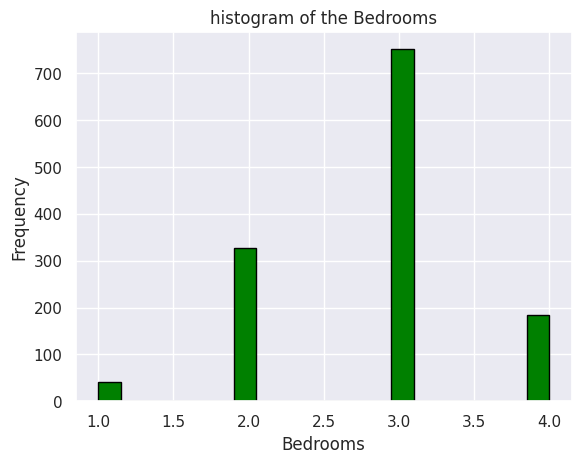

In [ ]:
# histogram Bedrooms
plt.hist(House_data['Bedrooms above grade does Not include basement'], bins = 20, color = 'green', edgecolor = 'black')
plt.xlabel('Bedrooms')
plt.ylabel('Frequency')
plt.title('histogram of the Bedrooms')
plt.show()

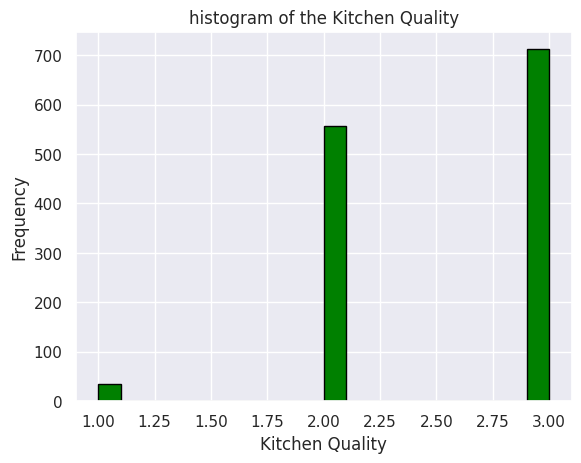

In [ ]:
# histogram Kitchen Quality
plt.hist(House_data['Kitchen Quality'], bins = 20, color = 'green', edgecolor = 'black')
plt.xlabel('Kitchen Quality')
plt.ylabel('Frequency')
plt.title('histogram of the Kitchen Quality')
plt.show()

([0, 1, 2, 3],
 [Text(0, 0, '1'), Text(1, 0, '2'), Text(2, 0, '3'), Text(3, 0, '4')])

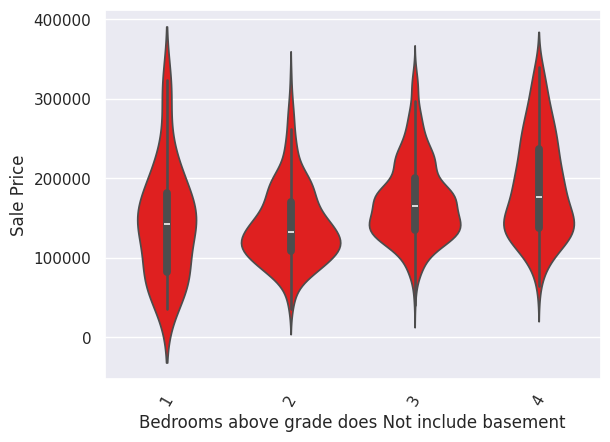

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'Bedrooms above grade does Not include basement', y = 'Sale Price',color = 'red', data = House_data)
plt.xticks(rotation = 60)

([0, 1, 2], [Text(0, 0, '1'), Text(1, 0, '2'), Text(2, 0, '3')])

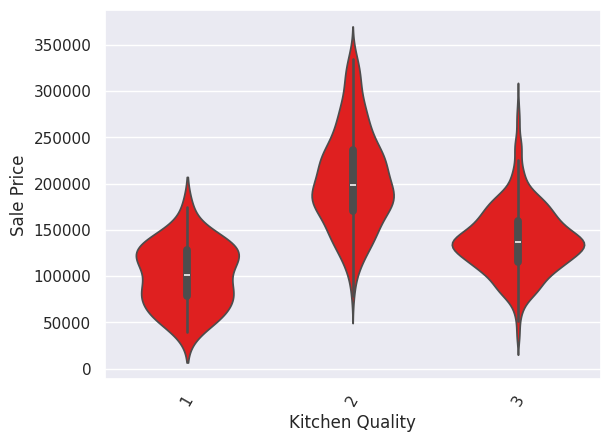

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'Kitchen Quality', y = 'Sale Price',color = 'red', data = House_data)
plt.xticks(rotation = 60)

([0, 1, 2, 3],
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

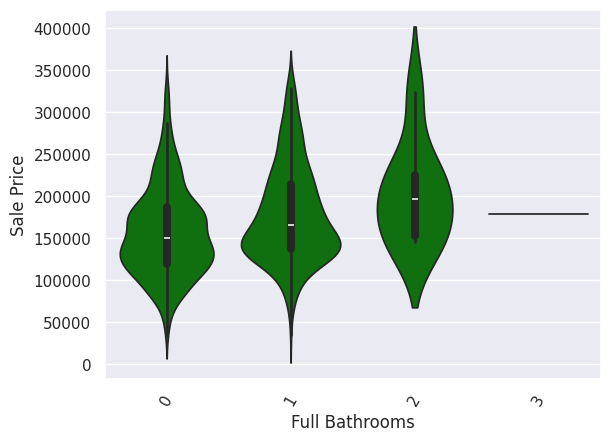

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'Full Bathrooms', y = 'Sale Price',color = 'green', data = House_data)
plt.xticks(rotation = 60)

([0, 1, 2, 3, 4],
 [Text(0, 0, '2006'),
  Text(1, 0, '2007'),
  Text(2, 0, '2008'),
  Text(3, 0, '2009'),
  Text(4, 0, '2010')])

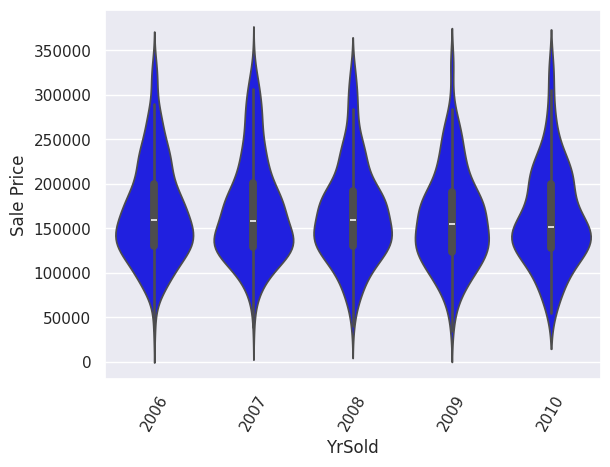

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'YrSold', y = 'Sale Price',color = 'blue', data = House_data)
plt.xticks(rotation = 60)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11')])

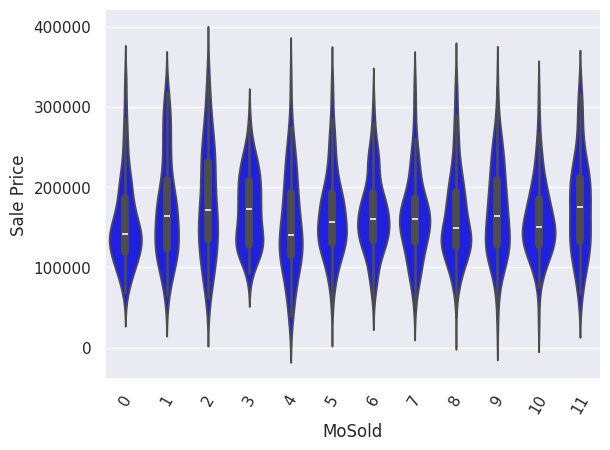

In [ ]:
# Price distribution using violin plot
ax = sns.violinplot(x = 'MoSold', y = 'Sale Price',color = 'blue', data = House_data)
plt.xticks(rotation = 60)

In [ ]:
House_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1304 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column                                                Non-Null Count  Dtype
---  ------                                                --------------  -----
 0   Type of Dwelling                                      1304 non-null   int64
 1   General Zone Classification                           1304 non-null   int64
 2   Linear Feet of Street                                 1304 non-null   int64
 3   Plot size in Square feet                              1304 non-null   int64
 4   Type of road                                          1304 non-null   int64
 5   Type of Alley                                         1304 non-null   int64
 6   General shape of property                             1304 non-null   int64
 7   Flatness of the property                              1304 non-null   int64
 8   Type of Utilites available                            1304 non-null   int64
 9   Lo

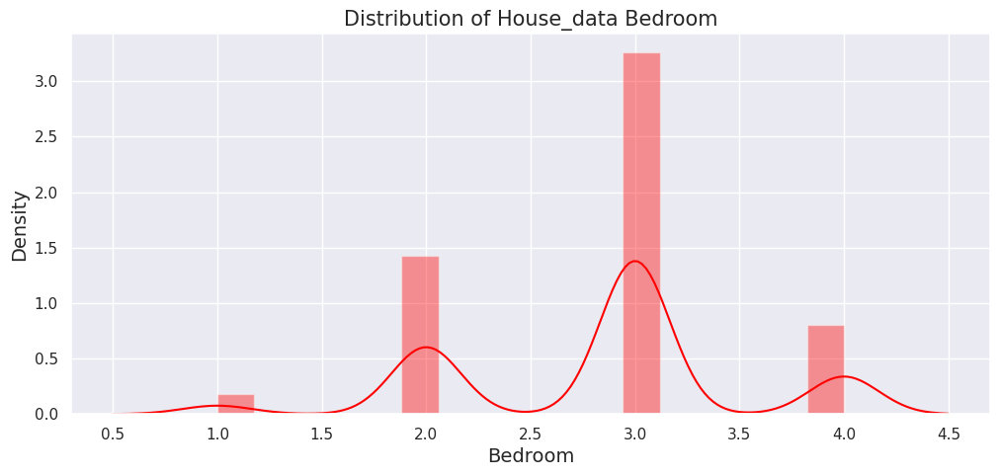

In [ ]:
# Distribution of the Bedroom
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(House_data['Bedrooms above grade does Not include basement'], color= 'red')
plt.xlabel("Bedroom", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of House_data Bedroom", fontsize = 15)
plt.show()

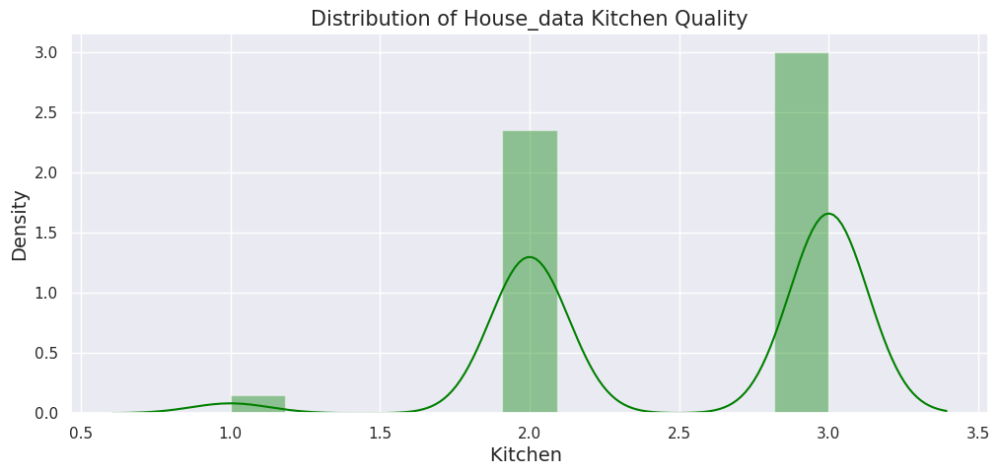

In [ ]:
# Distribution of the Kitchen Quality
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(House_data['Kitchen Quality'], color= 'green')
plt.xlabel("Kitchen ", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of House_data Kitchen Quality", fontsize = 15)
plt.show()

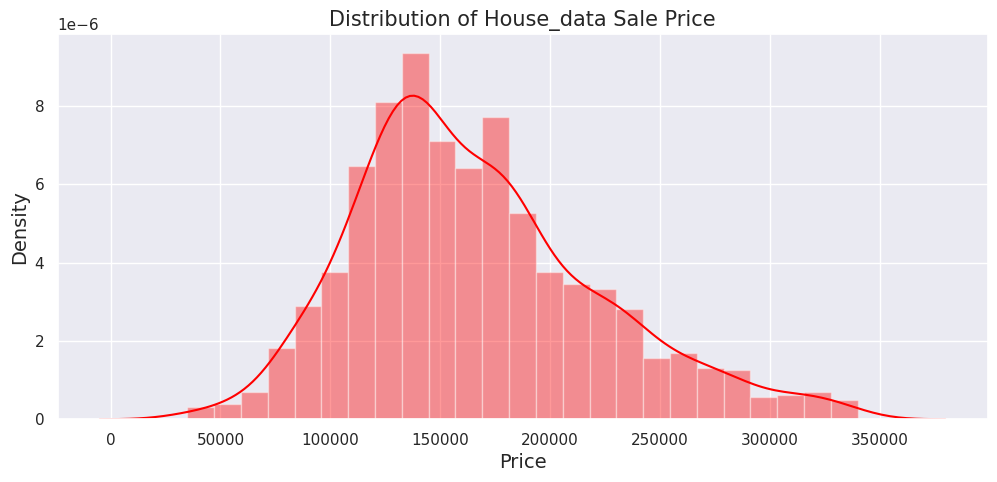

In [ ]:
# Distribution of the SalePrice
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(House_data['Sale Price'], color= 'red')
plt.xlabel("Price", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of House_data Sale Price", fontsize = 15)
plt.show()

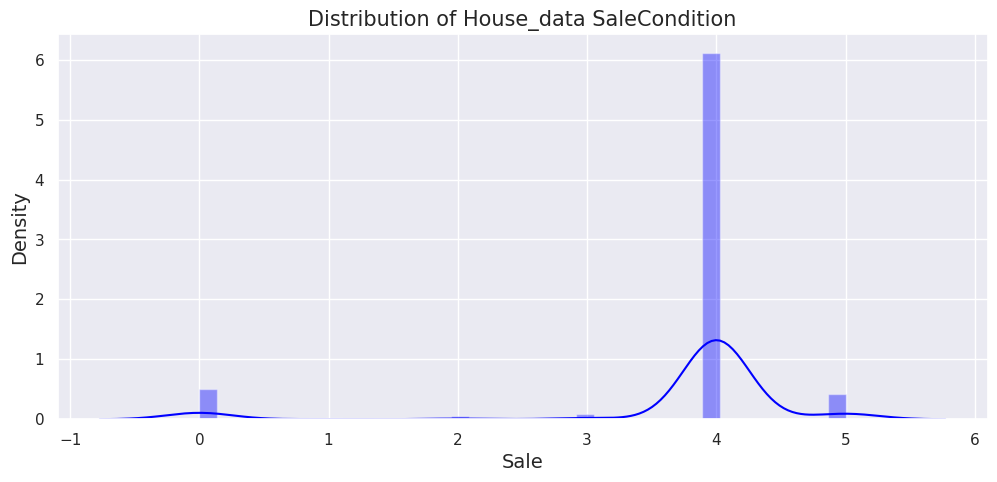

In [ ]:
# Distribution of the SaleCondition
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(House_data['SaleCondition'], color= 'blue')
plt.xlabel("Sale", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of House_data SaleCondition", fontsize = 15)
plt.show()

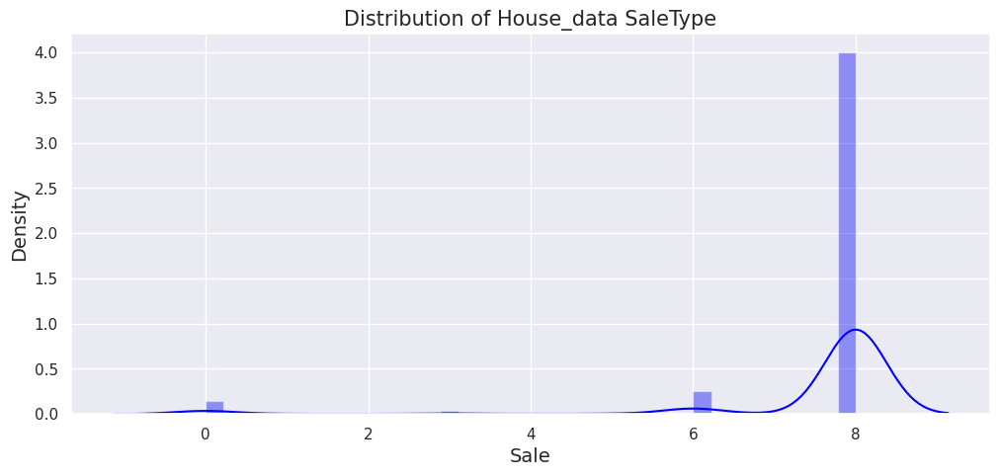

In [ ]:
# Distribution of the SaleType
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(House_data['SaleType'], color= 'blue')
plt.xlabel("Sale", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of House_data SaleType", fontsize = 15)
plt.show()

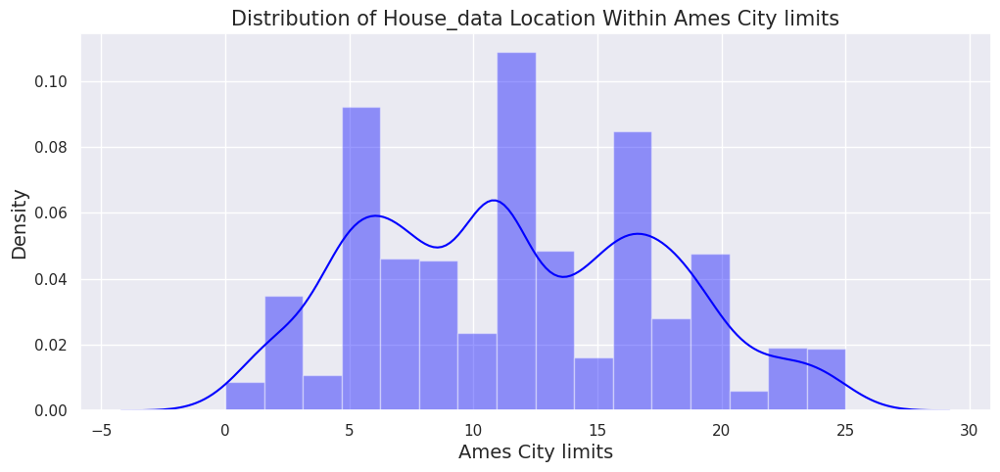

In [ ]:
# Distribution of the Location Within Ames City limits
plt.figure(figsize=(12,5))
sns.set_theme(style="darkgrid")
sns.distplot(House_data['Location Within Ames City limits'], color= 'blue')
plt.xlabel("Ames City limits", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of House_data Location Within Ames City limits", fontsize = 15)
plt.show()

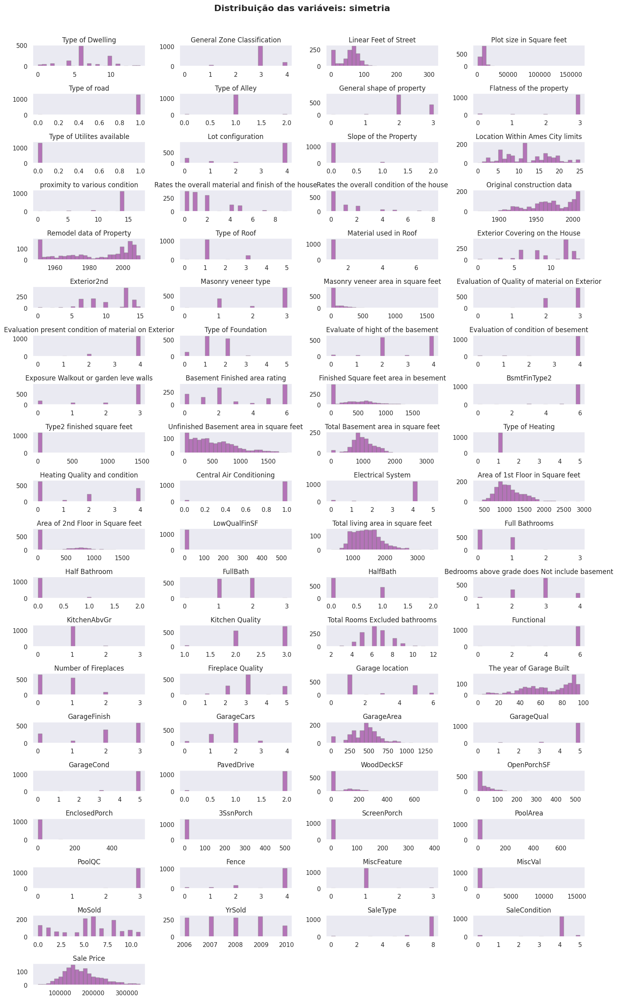

In [ ]:
House_data.hist(bins=25, figsize=(15, 25), layout=(-1, 4), edgecolor="gray", color = 'purple', alpha = 0.5, grid = False)
plt.suptitle('Distribuição das variáveis: simetria', y = 1.01, fontsize = 16, fontweight = 'bold')
plt.tight_layout()
plt.show()

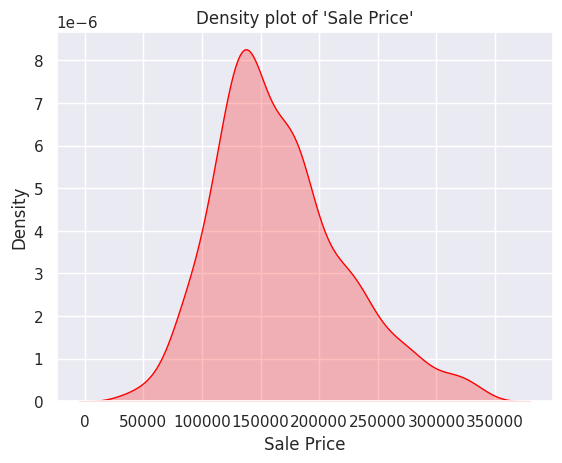

In [ ]:
# Density plot Sale Price
sns.kdeplot(House_data['Sale Price'],shade = True, color = 'red')
plt.xlabel ('Sale Price')
plt.ylabel ('Density')
plt.title ("Density plot of 'Sale Price'")
plt.show()

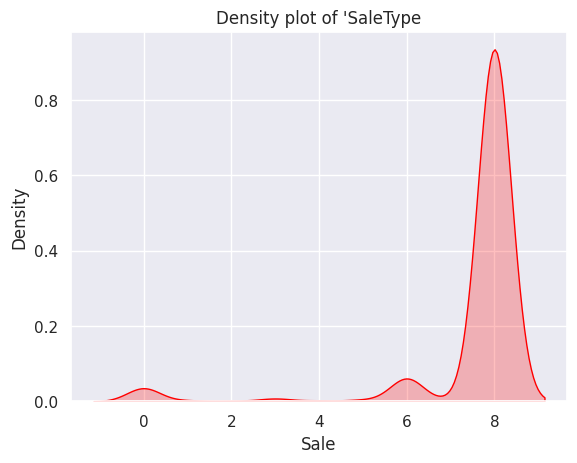

In [ ]:
# Density plot SaleType
sns.kdeplot(House_data['SaleType'],shade = True, color = 'red')
plt.xlabel ('Sale')
plt.ylabel ('Density')
plt.title ("Density plot of 'SaleType")
plt.show()

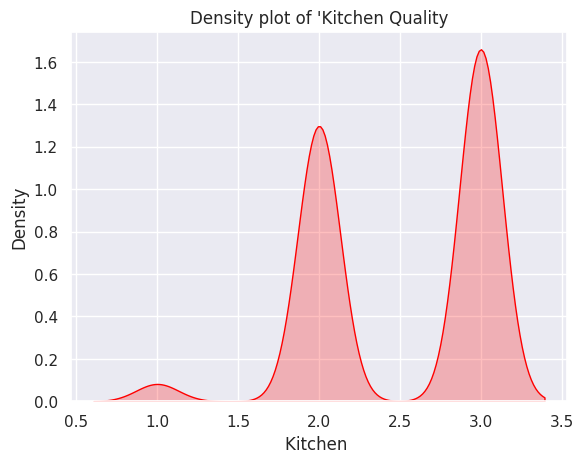

In [ ]:
# Density plot Kitchen Quality
sns.kdeplot(House_data['Kitchen Quality'],shade = True, color = 'red')
plt.xlabel ('Kitchen ')
plt.ylabel ('Density')
plt.title ("Density plot of 'Kitchen Quality")
plt.show()

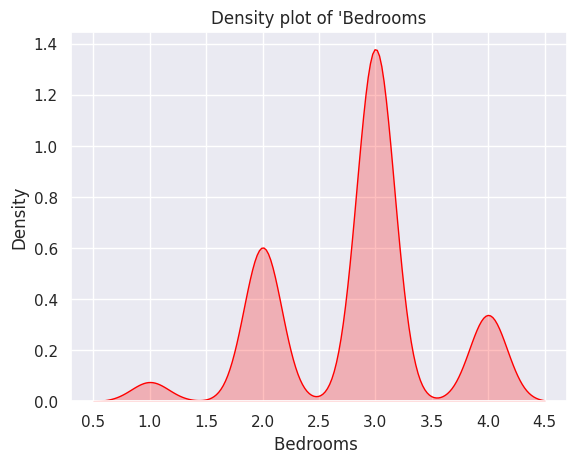

In [ ]:
# Density plot Bedrooms
sns.kdeplot(House_data['Bedrooms above grade does Not include basement'],shade = True, color = 'red')
plt.xlabel ('Bedrooms ')
plt.ylabel ('Density')
plt.title ("Density plot of 'Bedrooms")
plt.show()

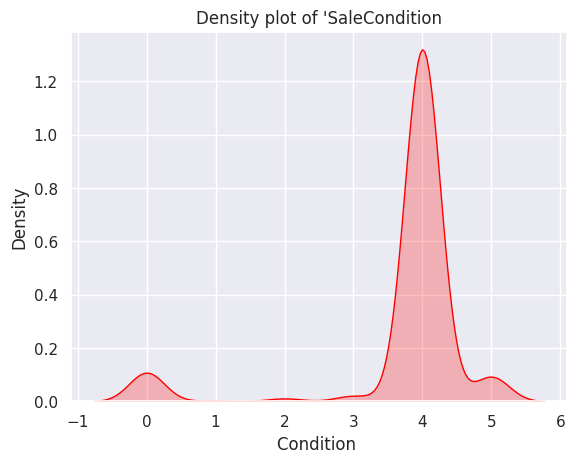

In [ ]:
# Density plot SaleCondition
sns.kdeplot(House_data['SaleCondition'],shade = True, color = 'red')
plt.xlabel ('Condition ')
plt.ylabel ('Density')
plt.title ("Density plot of 'SaleCondition")
plt.show()